In [1]:
import pandas as pd
import geopandas as gpd
from functools import reduce
import numpy as np

import plotly.graph_objects as go
import plotly.express as px
# import plotly
# plotly.offline.init_notebook_mode(connected=True)

import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import seaborn as sns
import matplotlib as mpl
import matplotlib.colors as mcl
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib_scalebar.scalebar import ScaleBar
from matplotlib.colors import TwoSlopeNorm, Normalize
from matplotlib.patches import Patch, Ellipse
from shapely.geometry.point import Point
mpl.rcParams['figure.dpi']= 300
plt.rcParams['text.usetex'] = False
# mpl.rcParams['text.usetex'] = True
mpl.rc('font',family='Arial')

from matplotlib.colors import rgb2hex

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
# Identifier between numeric and alphabetical
alpha_id = {
    'p1' : {1 : 'DP1',
            2 : 'BP1',
            3 : 'CP1',
            4 : 'EP1',
            5 : 'AP1'},
    'p2' : {2 : 'CP2',
            1 : 'BP2',
            3 : 'AP2'},
    'p3' : {2 : 'CP3',
            1 : 'BP3',
            3 : 'AP3'},
    'p4' : {1 : 'CP4',
            2 : 'BP4',
            3 : 'AP4'}
}

In [4]:
cmap = plt.get_cmap('tab20')
list_colors = [mcl.rgb2hex(cmap(i)) for i in range(cmap.N)]

pal_p14 = {
    'p1' : {'AP1' : '#6db54f',
            'BP1' : '#e04d4d',
            'CP1' : '#ffd966', # '#6fa8dc',
            'DP1' : '#67e4ef', # '#eeeeee',
            'EP1' : '#ee9e58'},
    'p2' : {'AP2' : '#06794b', 
            'BP2' : '#cb364e', 
            'CP2' : '#e7b242'}, 
    'p3' : {'AP3' : '#06794b', 
            'BP3' : '#cb364e', 
            'CP3' : '#e7b242'}, 
    'p4' : {'AP4' : '#06794b', # list_colors[0],
            'BP4' : '#cb364e', # list_colors[1],
            'CP4' : '#e7b242'} # list_colors[2]}
}

pal_p14_2 = {
    'p1' : {10 : '#6db54f',
            12 : '#497935',
            
            7 : '#872341',
            2 : '#BE3144',
            4 : '#F05941',
            
            5 : '#FBD85D',
            6 : '#FAE392',
            
            1 : '#22668D', # '#eeeeee',
            3 : '#8ECDDD',
            
            8 : '#F99417',#'#FFBB5C',
           11 : '#FFBB5C',
           9 : '#FFD56F'},
    'p4' : {8 : '#06794b', # list_colors[0],
            
            4 : '#872341', # list_colors[1],
            6 : '#BE3144',
            7 : '#F05941',
            
            1 : '#FFBB5C',
           3 : '#FBD85D',
           5 : '#FAE392',
           2 : '#F99417'} }# list_colors[2]}

In [5]:
# User inputs
grid_id = '30km'

# Periods we are working with
nperiods = 4
nyears = 9

# Number of solutions we want to work with for each period
kp1_1 = 5
kp1_2 = 12
kp2_1 = 3
kp2_2 = 10
kp3_1 = 3
kp3_2 = 12
kp4_1 = 3
kp4_2 = 8

# list of fire variables
fire_vars = ['size_q50', 'size_q99', 'number_fires_n', 'burned_area_n', 'season_q50s', 'frequency_q99s']
# List of transformed fire variables
# fire_vars_t = ['log_size_q50', 'log_size_q99', 'log_number_fires_n', 'log_burned_area_n', 'season_q50s', 'log1_frequency_q99s']
fire_vars_t = ['log_size_q50', 'log_size_q99', 'log_burned_area_n', 'log_number_fires_n', 'log1_frequency_q99s', 'season_q50s']

# Labels to name the PCA components
# pca_comp_labels = ['Logarithm of median fire size', 'Logarithm of 99th fire size', 'Logarithm of number fires', 'Logarithm of burned area', 'Median fire season', 'Logarithm of 99th frequency']
pca_comp_labels_1 = ['Peak fire season', 'Log. median fire size', 'Log. 99th fire size', 'Log. burned area', 'Log. number fires', 'Log. 99th frequency']
pca_comp_labels = ['Log. median fire size', 'Log. 99th fire size', 'Log. burned area', 'Log. number fires', 'Log. 99th frequency', 'Peak fire season']


In [6]:
# Reading data for each period
grid = gpd.read_file('../../data/shapes/cerrado_grid_{}_cropped.shp'.format(grid_id))[['id','geometry']]

data = dict()
pca_comp = dict()

for period, klist in zip([1, 2, 3, 4], [[kp1_1, kp1_2], [kp2_1, kp2_2], [kp3_1, kp3_2], [kp4_1, kp4_2]]):
    # Classification solutions for each k
    class_k = pd.read_csv('../../analysis_new_grids/{}_year_periods/fireSize_intersecting/constClusteringClass_ksolutions_grid{}_period{}.csv'.format(nyears, grid_id, period))
    # Keeping only relevant columns
    class_k = class_k[['id'] + ['clust_{}'.format(k) for k in klist]]

    # PCA scores for period
    pca_dir = '../../data_new_grids/processed/clustering_algorithm/{}_year_periods/'.format(nyears)
    scores = pd.read_csv(pca_dir + 'PCAscores_scaling1_sites_input_vars_transformed_grid{}_period{}.csv'.format(grid_id, period))
    pca_comp['p{}'.format(period)] = pd.read_csv(pca_dir + 'PCAscores_scaling1_species_input_vars_transformed_grid{}_period{}.csv'.format(grid_id, period))
    
    # Add column with labels
    pca_comp['p{}'.format(period)]['id_label'] = pca_comp_labels_1

    # Merging all data
    data['p{}'.format(period)] = reduce(lambda df1, df2: pd.merge(df1, df2, on='id'), [grid, class_k, scores])
    
    # # Adding alphabetical and color-code information per solution k
    # for k in klist:
    # # Create alphanumeric relation to relate the numeric identifier to a letter
    # alphanumeric_relation = dict(zip(range(1, k+1), [chr(x) for x in range(65, 65 + k)]))
    k = klist[0]
    # Casting as column
    data['p{}'.format(period)]['clust_alpha_{}'.format(k)] = [alpha_id['p{}'.format(period)][v] for v in data['p{}'.format(period)]['clust_{}'.format(k)]] #[alphanumeric_relation[v] for v in data['p{}'.format(period)]['clust_{}'.format(k)]]

    # Adding colour-code information as column
    data['p{}'.format(period)]['colors_{}'.format(k)] = [pal_p14['p{}'.format(period)][v] for v in data['p{}'.format(period)]['clust_alpha_{}'.format(k)]]
    
    if period in [1,4]:
        k = klist[1]
        # Adding colour-code information as column
        data['p{}'.format(period)]['colors_{}'.format(k)] = [pal_p14_2['p{}'.format(period)][v] for v in data['p{}'.format(period)]['clust_{}'.format(k)]]
        

# Reading the explanaotry power of the PCA axes
pca_exp = pd.read_csv('../../data_new_grids/processed/clustering_algorithm/PCAexpPower_scaling1_sites_input_vars_transformed_grid{}.csv'.format(grid_id))

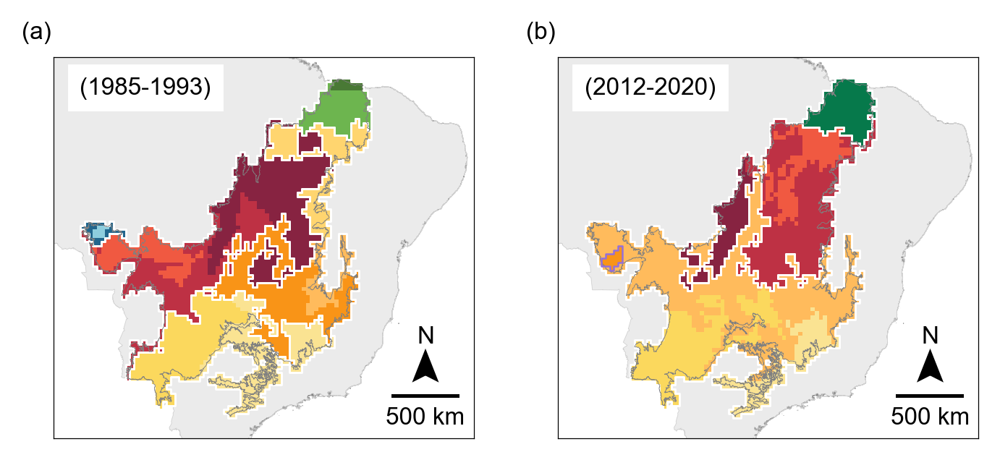

In [7]:
fig, axes = plt.subplots(1, 2, figsize = (5.5, 5))



# Plot for each solution (number of clusters)
# i = 0
for i, period, k, k2, p_label, fig_label in zip(range(2), [1, 4], [kp1_1, kp4_1], [kp1_2, kp4_2], ['(1985-1993)', '(2012-2020)'], ['(a)', '(b)']):
    
    toPlot = data['p{}'.format(period)].copy()
    
    # ----------------------------------------------------------------------------------------------------------------------
    # Map on top
    
    # Now, create the map
    br = gpd.read_file('../../data/shapes/brazil/gadm36_BRA_0.shp')
    br = br.to_crs(toPlot.crs)
    br.plot(ax = axes[i], linewidth=0.2, edgecolor = 'grey', color = 'silver', alpha = 0.3)
    
    
    
    toPlot.plot(color = toPlot['colors_{}'.format(k2)], ax = axes[i], legend = True)
    toPlot.dissolve(by = 'clust_{}'.format(k)).boundary.plot(color = 'white', ax = axes[i], linewidth = 0.7)
    

    cerrado = gpd.read_file('../../data/shapes/cerrado_1-250000.shp')
    cerrado = cerrado.to_crs(toPlot.crs)
    cerrado.boundary.plot(ax = axes[i], linewidth=0.2, edgecolor = 'grey')
    
    minx, miny, maxx, maxy = toPlot.total_bounds
    axes[i].set_xlim(minx-200000, maxx+750000)
    axes[i].set_ylim(miny-150000, maxy+150000)
    
    # Adding figure label
    # print(fig_label)
    axes[i].text(x=-0.075, y=1.05, s=fig_label, transform=axes[i].transAxes, fontsize=8)
    
    axes[i].tick_params(axis='both', 
                            which='both',
                            bottom=False,
                            left = False,
                            labelbottom=False, labelleft = False)
    
    # Change width of all spines of axis
    for axis in ['top','bottom','left','right']:
        axes[i].spines[axis].set_linewidth(0.3)
        
    # Adding label with the period
    axes[i].text(0.375, 0.95, p_label, transform = axes[i].transAxes, fontsize=8, bbox = {'edgecolor': 'white', 'facecolor':'white', 'linewidth':0.2}, va = 'top', ha = 'right') # , backgroundcolor='white'
    
    # Including an arrow
    axes[i].text(x=0.865, y=0.25, s='N', transform=axes[i].transAxes, fontsize=8)
    # 0.055 for the 4-grid, 0.05 for the 3-grid
    axes[i].arrow(0.885, 0.175, 0.0, 0.05, length_includes_head=True, transform=axes[i].transAxes,
              width = 0, head_width=0.05, head_length=0.07, overhang=0.2, facecolor='k')
    
    # Taken from the GeoPandas documentation: https://geopandas.org/en/stable/gallery/matplotlib_scalebar.html 
    points = gpd.GeoSeries([Point(-45, -10.0), Point(-46, -10.0)], crs=4326)  # Geographic WGS 84 - degrees
    points = points.to_crs('epsg:5880') # Projected WGS 84 - meters
    distance_meters = points.distance(points[1])

    # axes[i].add_artist(ScaleBar(distance_meters, location='lower right', font_properties={'size': 8}, sep = 3))
    axes[i].add_artist(ScaleBar(dx = 1, units = 'm', dimension = 'si-length',  location='lower right', font_properties={'size': 8}, sep = 3))
    
    # Add zone that is a bit special
    if period == 4:
        subset = toPlot[toPlot['clust_{}'.format(kp4_2)] == 2]
        subset.dissolve().boundary.plot(color = 'mediumpurple', ax = axes[i], linewidth = 0.6)
    
    del toPlot
        
    # i += 1
    
plt.savefig('../plots/secondSolution_maps.png', dpi=300, facecolor='white', transparent=False, bbox_inches="tight")
plt.savefig('../plots/secondSolution_maps.pdf', dpi=300, facecolor='white', transparent=False, bbox_inches="tight")
plt.show()

In [64]:
# Reading trends in PCA
pca_trends = pd.read_csv('../../analysis_new_grids/{}_year_periods/lm_fits/PCA_linearModel_grid{}.csv'.format(nyears, grid_id))

# Add classification for first period
pca_trends = pca_trends.merge(data['p1'][['id', 'clust_{}'.format(kp1_1), 'clust_alpha_{}'.format(kp1_1)]], on = 'id', how = 'left')
# Add classification for last period
pca_trends = pca_trends.merge(data['p4'][['id', 'clust_alpha_{}'.format(kp4_1)]], on = 'id', how = 'left')

# Adding geographical informatin
pca_trends = grid.merge(pca_trends, on = 'id', how = 'right')
pca_trends.head()

,id,geometry,pca_var,interc,slope,slope_cimin,slope_cimax,slope_sig,clust_5,clust_alpha_5,clust_alpha_3
0,307.0,"POLYGON ((4288491.269 8664278.452, 4318491.269...",PC1,-0.034230,0.019026,-0.057198,0.095250,False,1,DP1,CP4
1,307.0,"POLYGON ((4288491.269 8664278.452, 4318491.269...",PC2,-0.074748,0.027658,-0.027883,0.083200,False,1,DP1,CP4
2,308.0,"POLYGON ((4288491.269 8634278.452, 4318491.269...",PC1,0.146120,-0.024974,-0.052713,0.002765,False,2,BP1,CP4
3,308.0,"POLYGON ((4288491.269 8634278.452, 4318491.269...",PC2,0.031578,0.001685,-0.035884,0.039253,False,2,BP1,CP4
4,309.0,"POLYGON ((4288491.269 8604278.452, 4318491.269...",PC1,0.091161,0.017313,-0.027842,0.062469,False,2,BP1,CP4


In [9]:
lda_data = dict()
lda_comp = dict()

lda_id_list = ['anthropic01', 'climatic01']

for period, k in zip([1, 4], [kp1_1, kp4_1]):
    # Classification solutions for each k
    class_k = pd.read_csv('../../analysis_new_grids/{}_year_periods/fireSize_intersecting/constClusteringClass_ksolutions_grid{}_period{}.csv'.format(nyears, grid_id, period))
    # Keeping only relevant columns
    class_k = class_k[['id', 'clust_{}'.format(k)]]
    
    for vars_id in lda_id_list:

        # PCA scores for period
        lda_dir = '../../analysis_new_grids/{}_year_periods/fireSize_intersecting/lda_output/'.format(nyears)
        scores = pd.read_csv(lda_dir + 'LDAcoord_period{}_sol{}_vars_{}_grid{}.csv'.format(period, k, vars_id, grid_id))
        lda_comp['p{}_{}'.format(period, vars_id)] = pd.read_csv(lda_dir + 'LDAcoeff_period{}_sol{}_vars_{}_grid{}.csv'.format(period, k, vars_id, grid_id))

        # # Add column with labels
        # pca_comp['p{}_{}'.format(period, vars_id)]['id_label'] = pca_comp_labels

        # Merging all data
        lda_data['p{}_{}'.format(period, vars_id)] = reduce(lambda df1, df2: pd.merge(df1, df2, on='id'), [grid, scores])

        # # Adding alphabetical and color-code information per solution k
        # for k in klist:
        # # Create alphanumeric relation to relate the numeric identifier to a letter
        # alphanumeric_relation = dict(zip(range(1, k+1), [chr(x) for x in range(65, 65 + k)]))

        # Casting as column
        lda_data['p{}_{}'.format(period, vars_id)]['clust_alpha_{}'.format(k)] = [alpha_id['p{}'.format(period)][v] for v in lda_data['p{}_{}'.format(period, vars_id)]['clust_{}'.format(k)]] #[alphanumeric_relation[v] for v in data['p{}'.format(period)]['clust_{}'.format(k)]]

        # Adding colour-code information as column
        lda_data['p{}_{}'.format(period, vars_id)]['colors_{}'.format(k)] = [pal_p14['p{}'.format(period)][v] for v in lda_data['p{}_{}'.format(period, vars_id)]['clust_alpha_{}'.format(k)]]


In [10]:
# Reading the time series data
# All variables except frequency_q99s, a time series based on annual data
fvars_ts = pd.read_csv('../../analysis_new_grids/annual/lm_fits/fire_trans_linearModel_grid{}.csv'.format(grid_id))

# For frequency, we use the time-series based on the period data
freq_ts = pd.read_csv('../../analysis_new_grids/{}_year_periods/lm_fits/fire_trans_linearModel_grid{}.csv'.format(nyears, grid_id))
# Subsetting relevant rows
freq_ts = freq_ts[freq_ts['fire_var'] == 'log1_frequency_q99s'].reset_index(drop = True)

# Concatenating dataframes
fvars_ts = pd.concat([fvars_ts, freq_ts], ignore_index = True)

# Add column indicating sign of the slope
fvars_ts['sign_slope'] = [0 if e > 0 else -1 for e in fvars_ts['slope']]
# Modify column with a 0 indicating those where slope is non-significant
fvars_ts.loc[fvars_ts['slope_sig'] == False, 'sign_slope'] = 1

# In symbols
fvars_ts['sign_slope_sym'] = ['> 0' if e > 0 else '< 0' for e in fvars_ts['slope']]
# Modify column with a 0 indicating those where slope is non-significant
fvars_ts.loc[fvars_ts['slope_sig'] == False, 'sign_slope_sym'] = '=='

# Add classification for last period
fvars_ts = fvars_ts.merge(data['p4'][['id', 'clust_{}'.format(kp4_1),'clust_alpha_{}'.format(kp4_1),'colors_{}'.format(kp4_1)]], on = 'id', how = 'left')

# Order by sign
fvars_ts = fvars_ts.sort_values(by = 'sign_slope')

# Adding grid info
fvars_ts = grid.merge(fvars_ts, on = 'id', how = 'right')
fvars_ts

,id,geometry,fire_var,interc,slope,slope_cimin,slope_cimax,slope_sig,sign_slope,sign_slope_sym,clust_3,clust_alpha_3,colors_3
0,5188.0,"POLYGON ((5938491.269 9084278.451, 5968491.269...",log_size_q99,48.518090,-0.022325,-0.043941,-0.000709,True,-1,< 0,2,BP4,#cb364e
1,3183.0,"POLYGON ((5248491.269 7824278.452, 5278491.269...",log_size_q99,124.058385,-0.062998,-0.100277,-0.025719,True,-1,< 0,1,CP4,#e7b242
2,2913.0,"POLYGON ((5158491.269 7914278.452, 5188491.269...",log1_frequency_q99s,0.823879,-0.194532,-0.272686,-0.116377,True,-1,< 0,1,CP4,#e7b242
3,3183.0,"POLYGON ((5248491.269 7824278.452, 5278491.269...",log_number_fires_n,75.848588,-0.041047,-0.059689,-0.022405,True,-1,< 0,1,CP4,#e7b242
4,3183.0,"POLYGON ((5248491.269 7824278.452, 5278491.269...",log_burned_area_n,145.257730,-0.076917,-0.118112,-0.035722,True,-1,< 0,1,CP4,#e7b242
...,...,...,...,...,...,...,...,...,...,...,...,...,...
15901,4257.0,"POLYGON ((5608491.269 7644278.452, 5638491.269...",log_size_q50,-15.387306,0.006339,-0.005248,0.017925,False,1,==,1,CP4,#e7b242
15902,4257.0,"POLYGON ((5608491.269 7644278.452, 5638491.269...",season_q50s_rel,4.737329,0.000310,-0.016129,0.016750,False,1,==,1,CP4,#e7b242
15903,4258.0,"POLYGON ((5608491.269 7614278.452, 5638491.269...",log_burned_area_n,-63.485367,0.028863,-0.006851,0.064578,False,1,==,1,CP4,#e7b242
15904,4263.0,"POLYGON ((5608491.269 7464278.452, 5638491.269...",log_size_q99,-26.531245,0.012123,-0.011331,0.035578,False,1,==,1,CP4,#e7b242


In [11]:
# Generating table of percentages
fvars_ts_table = fvars_ts[['fire_var', 'clust_alpha_3', 'sign_slope_sym', 'id']].groupby(by = ['fire_var', 'clust_alpha_3', 'sign_slope_sym']).count().reset_index()

fvars_ts_table = fvars_ts_table.pivot_table(index = 'fire_var',
                                            columns = ['clust_alpha_3', 'sign_slope_sym'],
                                            values = 'id')
# fvars_ts_table = np.round(100*fvars_ts_table/len(fvars_ts['id'].unique()), 1)
fvars_ts_table['AP4'] = np.round(100 * fvars_ts_table['AP4']/len(fvars_ts.loc[fvars_ts['clust_alpha_3'] == 'AP4', 'id'].unique()), 1)
fvars_ts_table['BP4'] = np.round(100 * fvars_ts_table['BP4']/len(fvars_ts.loc[fvars_ts['clust_alpha_3'] == 'BP4', 'id'].unique()), 1)
fvars_ts_table['CP4'] = np.round(100 * fvars_ts_table['CP4']/len(fvars_ts.loc[fvars_ts['clust_alpha_3'] == 'CP4', 'id'].unique()), 1)
fvars_ts_table.to_csv('../tables/sign_change_perCluster_p4.csv')

In [12]:
# Generating table of percentages
fvars_ts_table = fvars_ts[['fire_var', 'clust_alpha_3', 'sign_slope_sym', 'id']].groupby(by = ['fire_var', 'clust_alpha_3', 'sign_slope_sym']).count().reset_index()

fvars_ts_table = fvars_ts_table.pivot_table(index = 'fire_var',
                                            columns = ['clust_alpha_3', 'sign_slope_sym'],
                                            values = 'id')
fvars_ts_table = np.round(100*fvars_ts_table/len(fvars_ts['id'].unique()), 1)

fvars_ts_table.to_csv('../tables/sign_change_overall_p4.csv')

In [13]:
# Reading the RDA data

rda_data = dict()
rda_comp = dict()
rda_coeff = dict()
rda_expPower = dict()
rda_r2adj = dict()

rda_id_list = ['anthropic01', 'anthropic02', 'climatic01', 'anthropicTopographic01', 'anthClim01','anthropic03', 'climatic03']

rda_labels = {'anthropic01': ['Log. population density', 'Log. livestock density', 'Sqrt anthropic area', 'Log. change anthropic area', 'Patch density'], 
              'anthropic02': ['Log. population density', 'Sqrt anthropic area', 'Log. change anthropic area', 'Patch density'],
              'climatic01': ['Precipitation', 'Temperature', 'Dry-season prec.', 'Peak dry-season'], 
              'anthropicTopographic01': ['Sqrt anthropic area', 'Patch density', 'Log.TRI', 'elevation'], 
              'anthClim01': ['Log. population density', 'Log. livestock density', 'Sqrt anthropic area', 'Temperature', 'Dry-season prec.', 'Peak dry-season'],
             'anthropic03': ['Log. population density', 'Log. livestock density', 'Sqrt anthropic area', 'Log. change anthropic area'],
             'climatic03': ['Precipitation', 'Dry-season temp.', 'Dry-season prec.', 'Peak dry-season']}

rda_fire_labels = ['Median fire season', 'Log. 99th fire size', 'Log. burned area', 'Log. number fires', 'Log. median fire size', 'Log. 99th frequency']

for period, klist in zip([1, 4], [[kp1_1, kp1_2], [kp4_1, kp4_2]]):
    # Classification solutions for each k
    class_k = pd.read_csv('../../analysis_new_grids/{}_year_periods/fireSize_intersecting/constClusteringClass_ksolutions_grid{}_period{}.csv'.format(nyears, grid_id, period))
    # Keeping only relevant columns
    class_k = class_k[['id'] + ['clust_{}'.format(k) for k in klist]]
    
    for rda_id in rda_id_list:
        

        # RDA scores for period
        rda_dir = '../../analysis_new_grids/{}_year_periods/rda_output/'.format(nyears)
        scores = pd.read_csv(rda_dir + 'RDAscores_scaling2_sites_period{}_{}_grid{}.csv'.format(period, rda_id, grid_id))
        rda_comp['p{}_{}'.format(period, rda_id)] = pd.read_csv(rda_dir + 'RDAscores_scaling2_species_period{}_{}_grid{}.csv'.format(period, rda_id, grid_id))
        rda_coeff['p{}_{}'.format(period, rda_id)] = pd.read_csv(rda_dir + 'RDAscores_scaling2_envCoeff_period{}_{}_grid{}.csv'.format(period, rda_id, grid_id))
        rda_expPower['p{}_{}'.format(period, rda_id)] = pd.read_csv(rda_dir + 'RDAexpPower_scaling2_period{}_{}_grid{}.csv'.format(period, rda_id, grid_id))
        rda_r2adj['p{}_{}'.format(period, rda_id)] = pd.read_csv(rda_dir + 'RDAr2adj_scaling2_period{}_{}_grid{}.csv'.format(period, rda_id, grid_id)).loc[0, 'R2adj'].item()

        # Add column with labels
        rda_comp['p{}_{}'.format(period, rda_id)]['fire_label'] = rda_fire_labels
        rda_coeff['p{}_{}'.format(period, rda_id)]['id_label'] = rda_labels[rda_id]

        # Merging scores with classification output
        rda_data['p{}_{}'.format(period, rda_id)] = reduce(lambda df1, df2: pd.merge(df1, df2, on='id'), [grid, class_k, scores])

        # # Adding alphabetical and color-code information per solution k
        # for k in klist:
        # # Create alphanumeric relation to relate the numeric identifier to a letter
        # alphanumeric_relation = dict(zip(range(1, k+1), [chr(x) for x in range(65, 65 + k)]))
        k = klist[0]
        # Casting as column
        rda_data['p{}_{}'.format(period, rda_id)]['clust_alpha_{}'.format(k)] = [alpha_id['p{}'.format(period)][v] for v in rda_data['p{}_{}'.format(period, rda_id)]['clust_{}'.format(k)]] #[alphanumeric_relation[v] for v in data['p{}'.format(period)]['clust_{}'.format(k)]]

        # Adding colour-code information as column
        rda_data['p{}_{}'.format(period, rda_id)]['colors_{}'.format(k)] = [pal_p14['p{}'.format(period)][v] for v in rda_data['p{}_{}'.format(period, rda_id)]['clust_alpha_{}'.format(k)]]

In [14]:
# Reading the RDA data

partialrda_data = dict()
partialrda_comp = dict()
partialrda_coeff = dict()
partialrda_expPower = dict()
partialrda_r2adj = dict()

partialrda_id_list = ['anthropic01', 'climatic01']

for period, klist in zip([1, 4], [[kp1_1, kp1_2], [kp4_1, kp4_2]]):
    # Classification solutions for each k
    class_k = pd.read_csv('../../analysis_new_grids/{}_year_periods/fireSize_intersecting/constClusteringClass_ksolutions_grid{}_period{}.csv'.format(nyears, grid_id, period))
    # Keeping only relevant columns
    class_k = class_k[['id'] + ['clust_{}'.format(k) for k in klist]]
    
    for partialrda_id in partialrda_id_list:
        

        # RDA scores for period
        partialrda_dir = '../../analysis_new_grids/{}_year_periods/rda_output/'.format(nyears)
        scores = pd.read_csv(partialrda_dir + 'partialRDAscores_scaling2_sites_period{}_{}_grid{}.csv'.format(period, partialrda_id, grid_id))
        partialrda_comp['p{}_{}'.format(period, partialrda_id)] = pd.read_csv(partialrda_dir + 'partialRDAscores_scaling2_species_period{}_{}_grid{}.csv'.format(period, partialrda_id, grid_id))
        partialrda_coeff['p{}_{}'.format(period, partialrda_id)] = pd.read_csv(partialrda_dir + 'partialRDAscores_scaling2_envCoeff_period{}_{}_grid{}.csv'.format(period, partialrda_id, grid_id))
        partialrda_expPower['p{}_{}'.format(period, partialrda_id)] = pd.read_csv(partialrda_dir + 'partialRDAexpPower_scaling2_period{}_{}_grid{}.csv'.format(period, partialrda_id, grid_id))
        partialrda_r2adj['p{}_{}'.format(period, partialrda_id)] = pd.read_csv(partialrda_dir + 'partialRDAr2adj_scaling2_period{}_{}_grid{}.csv'.format(period, partialrda_id, grid_id)).loc[0, 'R2adj'].item()

        # Add column with labels
        # rda_comp['p{}_{}'.format(period, rda_id)]['id_label'] = pca_comp_labels

        # Merging scores with classification output
        partialrda_data['p{}_{}'.format(period, partialrda_id)] = reduce(lambda df1, df2: pd.merge(df1, df2, on='id'), [grid, class_k, scores])

        # # Adding alphabetical and color-code information per solution k
        # for k in klist:
        # # Create alphanumeric relation to relate the numeric identifier to a letter
        # alphanumeric_relation = dict(zip(range(1, k+1), [chr(x) for x in range(65, 65 + k)]))
        k = klist[0]
        # Casting as column
        partialrda_data['p{}_{}'.format(period, partialrda_id)]['clust_alpha_{}'.format(k)] = [alpha_id['p{}'.format(period)][v] for v in partialrda_data['p{}_{}'.format(period, partialrda_id)]['clust_{}'.format(k)]] #[alphanumeric_relation[v] for v in data['p{}'.format(period)]['clust_{}'.format(k)]]

        # Adding colour-code information as column
        partialrda_data['p{}_{}'.format(period, partialrda_id)]['colors_{}'.format(k)] = [pal_p14['p{}'.format(period)][v] for v in partialrda_data['p{}_{}'.format(period, partialrda_id)]['clust_alpha_{}'.format(k)]]

In [15]:
# Explanatory variables
in_dir = '../../data_new_grids/processed/summary_tables/{}_year_periods/'.format(nyears)

# Climatic vars
clim_vars = ['mean_prec', 'mean_temp', 'ds_len', 'mean_prec_ds', 'mean_temp_ds', 'mean_peak_ds']
clim_labels = ['Mean annual precipitation [mm]', 'Mean annual temperature [$^\mathregular{o}$C]', 'Dry-season length [month]', 'Precipitation in the dry season [mm]', 
               'Mean temperature in the dry season [$^\mathregular{o}$C]', 'Peak of the dry season [month]']

# Landscape composition
lulc_vars = ['anthropic', '4', '3', '12', '11', '15', '18']#, '9', '21']
luch_vars = ['natural_delta']

# Landscape fragmentation
fragm_vars = ['patch_density']#, 'edge_density', 'area_mn', 'landscape_shape_index'] 
# frch_vars = ['patch_density_delta', 'edge_density_delta', 'area_mn_delta', 'landscape_shape_index_delta'] 

# Population density
pop_vars = ['areaw_popdensity']

# Livestock density
lstock_vars = ['areaw_dens']

# Anthropic variables
anthropic_vars = ['sqrt_anthropic', 'log_anthropic_delta', 'patch_density', 'log_areaw_popdensity', 'log_areaw_dens']
anthropic_labels = ['Square root of\nanthropic area percentage [%$^\mathregular{1/2}$]', 'Log. of change\nin anthropic area perc. [log(%)]', 'Patch density [1/ha]', 
                    'Log. of population density [log(km$^\mathregular{-2}$)]', 'Log. of livestock density [log(km$^\mathregular{-2}$)]']

veg_type_vars = ['log1_4','log1_3', 'log1_12', 'log1_11', 'log1_15', 'log1_18']
veg_type_labels = ['Log. savanna area [log(%)]', 'Log. forest area [log(%)]', 'Log. grassland area [log(%)]', 'Log. wetland area [log(%)]',
                    'Log. pasture area  [log(%)]', 'Log. cropland area [log(%)]']

# # Climatic data
# clim = pd.read_csv(in_dir + 'clim_data_period_allVariables_grid{}_4periods.csv'.format(grid_id))[['id', 'period'] + clim_vars]

# # Land-use area
# lulc = pd.read_csv(in_dir + 'lulc_percArea_grid{}_allPeriods.csv'.format(grid_id))[['id', 'period'] + lulc_vars + luch_vars]

# # Fragmentation
# frag = pd.read_csv(in_dir + 'landscape_metrics_grid{}_allPeriods.csv'.format(grid_id))[['id', 'period'] + fragm_vars]

# # Population density
# pop = pd.read_csv(in_dir + 'population_density_grid{}_allPeriods.csv'.format(grid_id))[['id', 'period'] + pop_vars]

# # Livestcock density
# lstock = pd.read_csv(in_dir + 'livestock_density_grid{}_allPeriods.csv'.format(grid_id))[['id', 'period'] + lstock_vars]

# Explanatory variables and transformed
expvar = pd.read_csv(in_dir + 'summary_expVars_and_expVarsTrans_grid{}_allPeriods.csv'.format(grid_id))

# # Variables
# list_expvars = clim_vars + lulc_vars + luch_vars + fragm_vars + pop_vars + lstock_vars

# # Merging all data
# expvar = reduce(lambda df1, df2: pd.merge(df1, df2, on = ['id', 'period']), [clim, lulc, frag, pop, lstock])


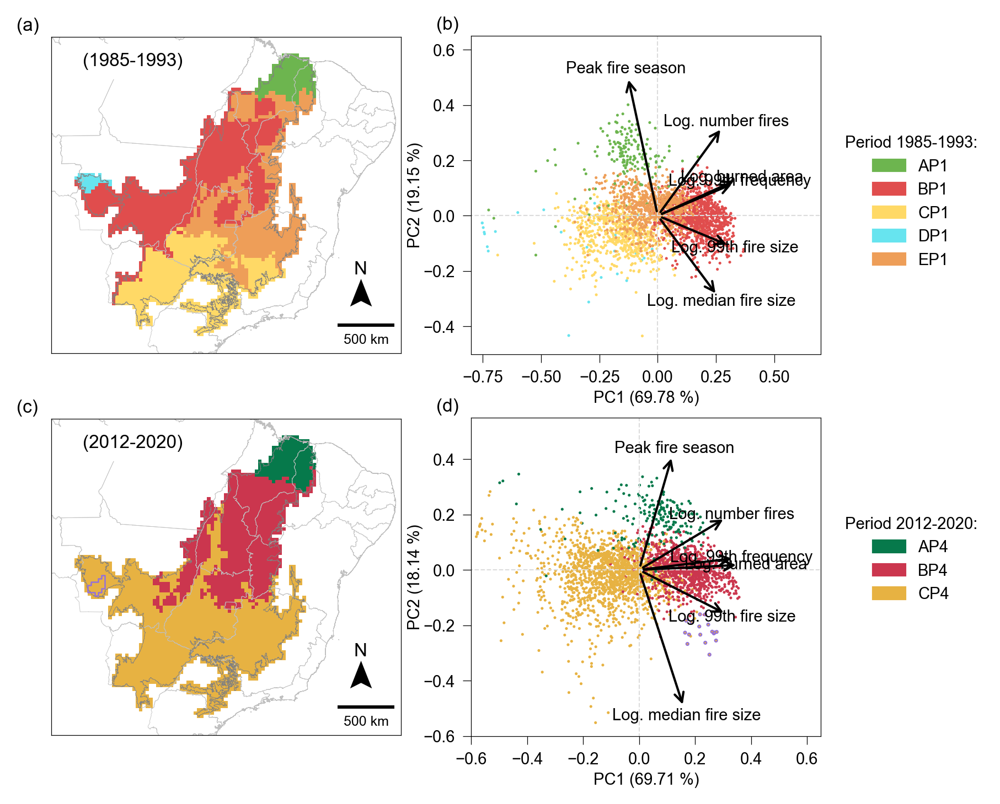

In [16]:
fig, axes = plt.subplots(2, 2, figsize = (6., 5.5))

pca_lim = [((-0.8, 0.7), (-0.5, 0.65)), ((-0.6, 0.65), (-0.6, 0.55))]

fig_label = ['(a)', '(c)', '(b)',  '(d)']

# Plot for each solution (number of clusters)
i = 0
for i, period, k, p_label, (xlim, ylim) in zip(range(2), [1, 4], [kp1_1, kp4_1], ['(1985-1993)', '(2012-2020)'], pca_lim):
    
    toPlot = data['p{}'.format(period)].copy()
    
    # Inverting x-axes of period's 4 PCA
    if period == 4:
        toPlot['PC1'] = (-1) * toPlot['PC1']
    
    # ----------------------------------------------------------------------------------------------------------------------
    # Map on top
    toPlot.plot(color = toPlot['colors_{}'.format(k)], ax = axes[i][0], legend = True)
    # axes[i][0].set_axis_off()
    # axes[i][0].set_title(p_label, fontsize = 8)
    
    br_states = gpd.read_file('../../data/shapes/brazilian_states/gadm36_BRA_1.shp')
    br_states = br_states.to_crs(toPlot.crs)
    br_states.boundary.plot(ax = axes[i][0], linewidth=0.2, edgecolor = 'silver')
    

    cerrado = gpd.read_file('../../data/shapes/cerrado_1-250000.shp')
    cerrado = cerrado.to_crs(toPlot.crs)
    cerrado.boundary.plot(ax = axes[i][0], linewidth=0.2, edgecolor = 'grey')
    
    minx, miny, maxx, maxy = toPlot.total_bounds
    axes[i][0].set_xlim(minx-200000, maxx+750000)
    axes[i][0].set_ylim(miny-150000, maxy+150000)
    
    
    # Adding figure label
    axes[i][0].text(x=-0.1, y=1.02, s=fig_label[i], transform=axes[i][0].transAxes, fontsize=8)
    
    axes[i][0].tick_params(axis='both', 
                            which='both',
                            bottom=False,
                            left = False,
                            labelbottom=False, labelleft = False)
    
    # Change width of all spines of axis
    for axis in ['top','bottom','left','right']:
        axes[i][0].spines[axis].set_linewidth(0.3)
        
    # Adding label with the period
    axes[i][0].text(0.375, 0.95, p_label, transform = axes[i][0].transAxes, fontsize=8, bbox = {'edgecolor': 'white', 'facecolor':'white', 'linewidth':0.2}, va = 'top', ha = 'right') # , backgroundcolor='white'
    
    # Including an arrow
    axes[i][0].text(x=0.865, y=0.25, s='N', transform=axes[i][0].transAxes, fontsize=8)
    # 0.055 for the 4-grid, 0.05 for the 3-grid
    axes[i][0].arrow(0.885, 0.175, 0.0, 0.05, length_includes_head=True, transform=axes[i][0].transAxes,
              width = 0, head_width=0.05, head_length=0.07, overhang=0.2, facecolor='k')
    
    # Taken from the GeoPandas documentation: https://geopandas.org/en/stable/gallery/matplotlib_scalebar.html 
    points = gpd.GeoSeries([Point(-45, -10.0), Point(-46, -10.0)], crs=4326)  # Geographic WGS 84 - degrees
    points = points.to_crs('epsg:5880') # Projected WGS 84 - meters
    distance_meters = points[0].distance(points[1])

    # axes[i][0].add_artist(ScaleBar(distance_meters, location='lower right', font_properties={'size': 8}, sep = 3))
    axes[i][0].add_artist(ScaleBar(dx = 1, units = 'm', dimension = 'si-length',  location='lower right', font_properties={'size': 6}, sep = 3))
    
    # Add zone that is a bit special
    if period == 4:
        subset = toPlot[toPlot['clust_{}'.format(kp4_2)] == 2]
        subset.dissolve().boundary.plot(color = 'mediumpurple', ax = axes[i][0], linewidth = 0.6)
    # ----------------------------------------------------------------------------------------------------------------------
    # PCA at the bottom
    
    # Setting the limits of the axis manually
    axes[i][1].set_xlim(xlim)
    axes[i][1].set_ylim(ylim)
    
    # Adding vertical and horizontal lines
    axes[i][1].axvline(0, -1, 1, linestyle = '--', linewidth = 0.5, color = 'gainsboro')
    axes[i][1].axhline(0, -1, 1, linestyle = '--', linewidth = 0.5, color = 'gainsboro')
    
    # Adding figure label
    axes[i][1].text(x=-0.1, y=1.02, s=fig_label[i+2], transform=axes[i][1].transAxes, fontsize=8)
    
    # The data points
    _plot = sns.scatterplot(x = toPlot['PC1'],
                    y = toPlot['PC2'],
                    hue = toPlot['clust_alpha_{}'.format(k)], 
                    ax = axes[i][1], s = 1.5, edgecolor = 'none', legend = None, palette = pal_p14['p{}'.format(period)])
    
    pca_exp_x = np.round(pca_exp.loc[pca_exp['period'] == period, 'PC1'].item(), decimals = 2)
    pca_exp_y = np.round(pca_exp.loc[pca_exp['period'] == period, 'PC2'].item() - pca_exp_x, decimals = 2)
    
    axes[i][1].set_xlabel('PC1 ({} %)'.format(pca_exp_x), fontsize = 7, labelpad = 2)
    axes[i][1].set_ylabel('PC2 ({} %)'.format(pca_exp_y), fontsize = 7, labelpad = 0.25)
    
    
    # Changing width of plot lines
    axes[i][1].tick_params(axis='both', which='major', labelsize=7, width = 0.3)
    # Change width of all spines of axis
    for axis in ['top','bottom','left','right']:
        axes[i][1].spines[axis].set_linewidth(0.3)
        
    # Adding the arrows
    comp = pca_comp['p{}'.format(period)].copy()
    # Inverting x-axes for period 4
    if period == 4:
        comp['PC1'] = (-1)* comp['PC1']
    for c in range(len(comp)):
        sc = 16
        # axes[i][1].arrow(0, 0, comp.loc[c,'PC1']/sc, comp.loc[c, 'PC2']/sc, color = 'r', width = 0.0001)
        axes[i][1].annotate('', xy = (0, 0),# xycoords = 'data',
                  xytext = (comp.loc[c,'PC1']/sc, comp.loc[c, 'PC2']/sc),# textcoords = 'data',
                  arrowprops = {'arrowstyle':'<-','edgecolor' : 'black', 'facecolor': 'black'})

        axes[i][1].text(comp.loc[c,'PC1']*1.05/sc, comp.loc[c, 'PC2']*1.05/sc, comp.loc[c, 'id_label'], fontsize = 7, color = 'black', ha = 'center', va = 'center')
        
    # Add zone that is a bit special
    if period == 4:
        subset = toPlot[toPlot['clust_{}'.format(kp4_2)] == 2].reset_index(drop = True)
        # The data points
        sns.scatterplot(x = subset['PC1'],
                        y = subset['PC2'],
                        hue = subset['clust_alpha_{}'.format(k)], 
                        ax = axes[i][1], s = 1.5,  legend = None, palette = pal_p14['p{}'.format(period)], linewidth = 0.5, edgecolor = 'mediumpurple')
    del toPlot, comp
        
    i += 1
    
    
# Create legend manually
patches_p1 = [Patch(color = c, label = l) for c, l in zip(pal_p14['p1'].values(), pal_p14['p1'].keys())]
patches_p4 = [Patch(color = c, label = l) for c, l in zip(pal_p14['p4'].values(), pal_p14['p4'].keys())]

legend_contents = [Patch(visible = False, label = 'Period 1985-1993:')] + patches_p1 + [Patch(visible = False, label = ''), Patch(visible = False, label = 'Period 2012-2020:')] + patches_p4

legend_p1 = plt.legend(handles = patches_p1, title ='Period 1985-1993:', loc = (1.05, 1.45), fontsize = 7, title_fontsize = 7, frameon = False)
plt.legend(handles = patches_p4, title ='Period 2012-2020:', loc = (1.05, .4), fontsize = 7, title_fontsize = 7, frameon = False)
plt.gca().add_artist(legend_p1)

plt.savefig('../plots/map_PCA_periods1_4.png', dpi=600, facecolor='white', transparent=False, bbox_inches="tight")
plt.savefig('../plots/map_PCA_periods1_4.pdf', dpi=600, facecolor='white', transparent=False, bbox_inches="tight")
plt.show()

### How much each region occupies

In [96]:
count_cluster_p1 = data['p1']['clust_alpha_{}'.format(kp1_1)].value_counts().reset_index(name = 'count')
count_cluster_p1['perc_count'] = 100 * count_cluster_p1['count'] / np.sum(count_cluster_p1['count'])
count_cluster_p1['category'] = ['high', 'interm', 'low','north','low']

count_cluster_p4 = data['p4']['clust_alpha_{}'.format(kp4_1)].value_counts().reset_index(name = 'count')
count_cluster_p4['perc_count'] = 100 * count_cluster_p4['count'] / np.sum(count_cluster_p4['count'])
count_cluster_p4['category'] = ['low', 'high','north']

print(count_cluster_p1)
print(count_cluster_p4)

print(count_cluster_p4.loc[count_cluster_p4['index'] == 'AP4', 'count'].item() / count_cluster_p1.loc[count_cluster_p1['index'] == 'AP1', 'count'].item())

print(100 - 100*np.sum(count_cluster_p4[count_cluster_p4['category'] == 'high']['count'])/np.sum(count_cluster_p1[count_cluster_p1['category'] == 'high']['count']))
print(100*np.sum(count_cluster_p4[count_cluster_p4['category'] == 'low']['count'])/np.sum(count_cluster_p1[count_cluster_p1['category'] == 'low']['count']))

  index  count  perc_count category
0   BP1   1037   39.117314     high
1   EP1    734   27.687665   interm
2   CP1    679   25.612976      low
3   AP1    165    6.224066    north
4   DP1     36    1.357978      low
  index  count  perc_count category
0   CP4   1576   59.449264      low
1   BP4    893   33.685402     high
2   AP4    182    6.865334    north
1.103030303030303
13.886210221793633
220.41958041958043


In [38]:
transition = data['p1'][['id','clust_alpha_{}'.format(kp1_1)]].merge(data['p4'][['id','clust_alpha_{}'.format(kp4_1)]], on = 'id')
transition = transition.groupby(['clust_alpha_{}'.format(kp1_1), 'clust_alpha_{}'.format(kp4_1)]).size().reset_index(name = 'count').sort_values(by = ['clust_alpha_{}'.format(kp1_1), 'clust_alpha_{}'.format(kp4_1)])
print(transition)
print(100*transition[transition['clust_alpha_{}'.format(kp1_1)] == 'AP1']['count']/transition[transition['clust_alpha_{}'.format(kp1_1)] == 'AP1']['count'].sum())
print(100*transition[transition['clust_alpha_{}'.format(kp1_1)] == 'BP1']['count']/transition[transition['clust_alpha_{}'.format(kp1_1)] == 'BP1']['count'].sum())
print(100*transition[transition['clust_alpha_{}'.format(kp1_1)] == 'CP1']['count']/transition[transition['clust_alpha_{}'.format(kp1_1)] == 'CP1']['count'].sum())
print(100*transition[transition['clust_alpha_{}'.format(kp1_1)] == 'DP1']['count']/transition[transition['clust_alpha_{}'.format(kp1_1)] == 'DP1']['count'].sum())
print(100*transition[transition['clust_alpha_{}'.format(kp1_1)] == 'EP1']['count']/transition[transition['clust_alpha_{}'.format(kp1_1)] == 'EP1']['count'].sum())


  clust_alpha_5 clust_alpha_3  count
0           AP1           AP4    157
1           AP1           BP4      8
2           BP1           BP4    580
3           BP1           CP4    457
4           CP1           CP4    679
5           DP1           CP4     36
6           EP1           AP4     25
7           EP1           BP4    305
8           EP1           CP4    404
0    95.151515
1     4.848485
Name: count, dtype: float64
2    55.930569
3    44.069431
Name: count, dtype: float64
4    100.0
Name: count, dtype: float64
5    100.0
Name: count, dtype: float64
6     3.405995
7    41.553134
8    55.040872
Name: count, dtype: float64


In [15]:
list_ap1 = data['p1'][['clust_alpha_{}'.format(kp1_1), 'id']]
list_ap1 = list_ap1[list_ap1['clust_alpha_{}'.format(kp1_1)] == 'AP1']['id'].tolist()

list_ap4 = data['p4'][['clust_alpha_{}'.format(kp4_1), 'id']]
list_ap4 = list_ap4[list_ap4['clust_alpha_{}'.format(kp4_1)] == 'AP4']['id'].tolist()

# Those in list ap1 not in ap4
one_side = [l for l in list_ap1 if l not in list_ap4]
other_side = [l for l in list_ap4 if l not in list_ap1]
# print(len([1 for l in list_ap4 if l in list_ap1 ])/len(list_ap1)
print(one_side)
print(other_side)
print((len(one_side) + len(other_side))/len(list_ap1))

[5089.0, 5090.0, 5178.0, 5801.0, 6421.0, 6511.0, 6512.0, 6513.0]
[5355.0, 5356.0, 5444.0, 5445.0, 5446.0, 5534.0, 5623.0, 6071.0, 6156.0, 6157.0, 6158.0, 6159.0, 6160.0, 6244.0, 6245.0, 6246.0, 6247.0, 6248.0, 6249.0, 6250.0, 6335.0, 6336.0, 6337.0, 6423.0, 6424.0]
0.2


## Transition between regions

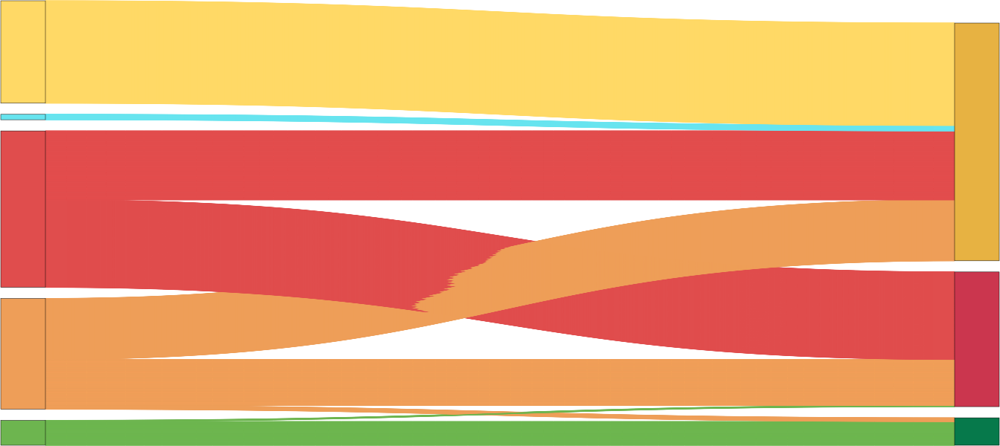

In [51]:
fig = go.Figure(
    data = [go.Sankey(
        node = dict(
            pad = 15, thickness = 60,
            line = dict(color = 'black', width = 0.5),
            # label = data['p1']['clust_alpha_5'].unique().tolist() + data['p4']['clust_alpha_3'].unique().tolist(),
            color = data['p1']['colors_5'].unique().tolist() + data['p4']['colors_3'].unique().tolist()
        ),
        link = dict(
            source = data['p1']['clust_5'] - 1,
            target = data['p4']['clust_3'] + 4,
            value = [5] * len(data['p1']),
            color = data['p1']['colors_5']
        ))])

fig.update_layout(#title_text = 'Transitions between peiod 1 and period 4', font_size = 10,
    margin = {'l':0.5,'r':0.5,'t':0.5,'b':0.5},
       width=600, height=600)

fig.write_image('../plots/transition_plot5.pdf', scale = 1)
# plt.savefig('../plots/transition_plot.pdf', dpi=600, facecolor='white', transparent=False, bbox_inches="tight")
fig.show()

### Comparison of PCAs between periods and exploring changes in fire variables between periods

In [39]:
# Reading the fire data (transformed variables)
fdata_in_dir = '../../data_new_grids/processed/clustering_algorithm/{}_year_periods/'.format(nyears)

# Fire data for period 1
fdata_p1 = pd.read_csv(fdata_in_dir + 'input_vars_transformed_grid{}_period{}.csv'.format(grid_id, 1))[['id'] + fire_vars_t]
fdata_p4 = pd.read_csv(fdata_in_dir + 'input_vars_transformed_grid{}_period{}.csv'.format(grid_id, 4))[['id'] + fire_vars_t]

# Dataframe containing the change in variable
fdata = fdata_p4 - fdata_p1
fdata['id'] = fdata_p1['id']

# fdata.loc[fdata['season_q50s'] <= -0.6, 'season_q50s'] = fdata.loc[fdata['season_q50s'] <= -0.6, 'season_q50s'] + 12


# Create columns with sign per variable
for var in fire_vars_t:
    fdata['sign_'+var] = [1 if e > 0 else 0 for e in fdata[var]]

# Adding classification information for period 4
fdata = fdata.merge(data['p4'][['id','clust_3','clust_alpha_3','colors_3']], on = 'id')
fdata = grid.merge(fdata, on = 'id')

# Adding classification information to each period's fire data
fdata_p1 = fdata_p1.merge(data['p1'][['id','clust_{}'.format(kp1_1),'clust_alpha_{}'.format(kp1_1),'colors_{}'.format(kp1_1)]], on = 'id')
fdata_p1 = fdata_p1.merge(data['p4'][['id','clust_{}'.format(kp4_1),'clust_alpha_{}'.format(kp4_1),'colors_{}'.format(kp4_1)]], on = 'id')

fdata_p4 = fdata_p4.merge(data['p1'][['id','clust_{}'.format(kp1_1),'clust_alpha_{}'.format(kp1_1),'colors_{}'.format(kp1_1)]], on = 'id')
fdata_p4 = fdata_p4.merge(data['p4'][['id','clust_{}'.format(kp4_1),'clust_alpha_{}'.format(kp4_1),'colors_{}'.format(kp4_1)]], on = 'id')

In [40]:
# Reading projection of data for period 4 into PCA for period 1
# Projection fo period 4 data onto period 1 PCA space
pcaproj_p4 = pd.read_csv(pca_dir + 'PCAscores_scaling1_p4projOnp1_sites_input_vars_transformed_grid{}.csv'.format(grid_id))

# Merging classification of first and last period
pcaproj_p4 = pcaproj_p4.merge(data['p1'][['id', 'clust_{}'.format(kp1_1), 'clust_alpha_{}'.format(kp1_1), 'colors_{}'.format(kp1_1), 'clust_{}'.format(kp1_2), 'colors_{}'.format(kp1_2)]], on = 'id')
pcaproj_p4 = pcaproj_p4.merge(data['p4'][['id', 'clust_{}'.format(kp4_1), 'clust_alpha_{}'.format(kp4_1), 'colors_{}'.format(kp4_1), 'clust_{}'.format(kp4_2), 'colors_{}'.format(kp4_2)]], on = 'id')
                     
pcaproj_p4 = grid.merge(pcaproj_p4, on = 'id', how = 'outer')

In [41]:
def colorFromBivariateData(Z1, Z2, vmin1, vmax1, vmin2, vmax2, cmap1 = plt.cm.YlOrRd, cmap2 = plt.cm.PuBuGn):
    # Rescale values to fit into colormap range (0->255)
    
    # Z1_plot = np.array(255*(Z1-Z1.min())/(Z1.max()-Z1.min()), dtype=int)
    # Z2_plot = np.array(255*(Z2-Z2.min())/(Z2.max()-Z2.min()), dtype=int)
    
    Z1_plot = np.array(255*(Z1 - vmin1)/(vmax1 - vmin1), dtype=int)
    Z2_plot = np.array(255*(Z2 - vmin2)/(vmax2 - vmin2), dtype=int)

    Z1_color = cmap1(Z1_plot)
    Z2_color = cmap2(Z2_plot)

    # Color for each point
    Z_color = np.sum([Z1_color, Z2_color], axis=0)/2.0

    return Z_color

In [42]:
# Calculating the minimum and maximum of each PCA axis

pc1_min = np.min(data['p1']['PC1'].tolist() + pcaproj_p4['PC1'].tolist())
pc2_min = np.min(data['p1']['PC2'].tolist() + pcaproj_p4['PC2'].tolist())

pc1_max = np.max(data['p1']['PC1'].tolist() + pcaproj_p4['PC1'].tolist())
pc2_max = np.max(data['p1']['PC2'].tolist() + pcaproj_p4['PC2'].tolist())

In [43]:
def format_PCA_bivariate(toPlot, axx, pc1_min, pc1_max, pc2_min, pc2_max):
    
    # First, create column in data with the bivariate color
    colors = colorFromBivariateData(toPlot['PC1'], toPlot['PC2'], pc1_min, pc1_max, pc2_min, pc2_max)#, cmap1 = cyan, cmap2 = pink)
    toPlot['color_bivariate'] = [rgb2hex([c[0], c[1], c[2]]) for c in colors] 

    # Now, create the map
    toPlot.plot(ax = axx, color = toPlot['color_bivariate'], legend = False)
    axx.set_axis_off()

    # Create inset legend manually
    # Where to put the box and its shape
    ax = axx.inset_axes([0.,0.65,0.35,0.35])                
    ax.set_aspect('equal', adjustable = 'box')

    xx, yy = np.mgrid[0:100,0:100]
    C_map = colorFromBivariateData(xx, yy, 0, 100, 0, 100)#, cmap1 = cyan, cmap2 = pink)

    ax.imshow(C_map)
    ax.set_xlabel('PC2')
    ax.set_ylabel('PC1')
    ax.xaxis.tick_top()

<function matplotlib.pyplot.show(close=None, block=None)>

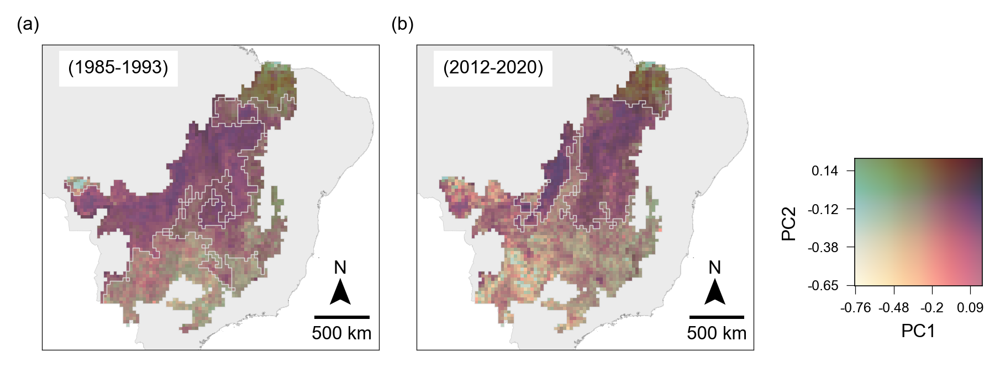

In [23]:
# plot map based on bivariate choroppleth
# Creating the boxplots
fig = plt.figure(figsize = (7, 2.5))
gs = mpl.gridspec.GridSpec(2, 5, wspace=0.25, hspace=0.25)

# -----------------------------------------------------------------------------------------------------------------------------
# Map for period 1
axm1 = fig.add_subplot(gs[:2, :2])
toPlot = data['p1'].copy()
# First, create column in data with the bivariate color
colors = colorFromBivariateData(toPlot['PC1'], toPlot['PC2'], pc1_min, pc1_max, pc2_min, pc2_max)#, cmap1 = cyan, cmap2 = pink)
toPlot['color_bivariate'] = [rgb2hex([c[0], c[1], c[2]]) for c in colors] 

# Now, create the map
br = gpd.read_file('../../data/shapes/brazil/gadm36_BRA_0.shp')
br = br.to_crs(toPlot.crs)
br.plot(ax = axm1, linewidth=0.2, edgecolor = 'grey', color = 'silver', alpha = 0.3)


toPlot.plot(ax = axm1, color = toPlot['color_bivariate'], legend = False)
toPlot.dissolve(by = 'clust_{}'.format(kp1_1)).boundary.plot(color = 'gainsboro', ax = axm1, linewidth = 0.3)

# cerrado = gpd.read_file('../../data/shapes/cerrado_1-250000.shp')
# cerrado = cerrado.to_crs(toPlot.crs)
# cerrado.boundary.plot(ax = axm1, linewidth=0.2, edgecolor = 'gainsboro')

minx, miny, maxx, maxy = toPlot.total_bounds
axm1.set_xlim(minx-200000, maxx+750000)
axm1.set_ylim(miny-150000, maxy+150000)

axm1.tick_params(axis='both', 
                        which='both',
                        bottom=False,
                        left = False,
                        labelbottom=False, labelleft = False)

# Change width of all spines of axis
for axis in ['top','bottom','left','right']:
    axm1.spines[axis].set_linewidth(0.3)

# Adding label with the period
axm1.text(0.375, 0.95, '(1985-1993)', transform = axm1.transAxes, fontsize=8, bbox = {'edgecolor': 'white', 'facecolor':'white', 'linewidth':0.2}, va = 'top', ha = 'right') # , backgroundcolor='white'

# Adding figure label
axm1.text(x=-0.075, y=1.05, s='(a)', transform=axm1.transAxes, fontsize=8)

# Including an arrow
axm1.text(x=0.865, y=0.25, s='N', transform=axm1.transAxes, fontsize=8)
# 0.055 for the 4-grid, 0.05 for the 3-grid
axm1.arrow(0.885, 0.175, 0.0, 0.05, length_includes_head=True, transform=axm1.transAxes,
          width = 0, head_width=0.05, head_length=0.07, overhang=0.2, facecolor='k')

# Taken from the GeoPandas documentation: https://geopandas.org/en/stable/gallery/matplotlib_scalebar.html 
points = gpd.GeoSeries([Point(-45, -10.0), Point(-46, -10.0)], crs=4326)  # Geographic WGS 84 - degrees
points = points.to_crs('epsg:5880') # Projected WGS 84 - meters
distance_meters = points[0].distance(points[1])

# axm1.add_artist(ScaleBar(distance_meters, location='lower right', font_properties={'size': 8}, sep = 3))
axm1.add_artist(ScaleBar(dx = 1, units = 'm', dimension = 'si-length',  location='lower right', font_properties={'size': 8}, sep = 3))


# ------------------------------------------------------------------------------------------------------------------------------
# Map for period 4
axm4 = fig.add_subplot(gs[:2, 2:3+1])
toPlot = pcaproj_p4.copy()
# First, create column in data with the bivariate color
colors = colorFromBivariateData(toPlot['PC1'], toPlot['PC2'], pc1_min, pc1_max, pc2_min, pc2_max)#, cmap1 = cyan, cmap2 = pink)
toPlot['color_bivariate'] = [rgb2hex([c[0], c[1], c[2]]) for c in colors] 

# Now, create the map
br = gpd.read_file('../../data/shapes/brazil/gadm36_BRA_0.shp')
br = br.to_crs(toPlot.crs)
br.plot(ax = axm4, linewidth=0.2, edgecolor = 'grey', color = 'silver', alpha = 0.3)

# Now, create the map
toPlot.plot(ax = axm4, color = toPlot['color_bivariate'], legend = False)
toPlot.dissolve(by = 'clust_{}'.format(kp4_1)).boundary.plot(color = 'gainsboro', ax = axm4, linewidth = 0.3)

# cerrado = gpd.read_file('../../data/shapes/cerrado_1-250000.shp')
# cerrado = cerrado.to_crs(toPlot.crs)
# cerrado.boundary.plot(ax = axm4, linewidth=0.2, edgecolor = 'gainsboro')

minx, miny, maxx, maxy = toPlot.total_bounds
axm4.set_xlim(minx-200000, maxx+750000)
axm4.set_ylim(miny-150000, maxy+150000)

axm4.tick_params(axis='both', 
                        which='both',
                        bottom=False,
                        left = False,
                        labelbottom=False, labelleft = False)

# Change width of all spines of axis
for axis in ['top','bottom','left','right']:
    axm4.spines[axis].set_linewidth(0.3)
    
# Adding figure label
axm4.text(x=-0.075, y=1.05, s='(b)', transform=axm4.transAxes, fontsize=8)

# Adding label with the period
axm4.text(0.375, 0.95, '(2012-2020)', transform = axm4.transAxes, fontsize=8, bbox = {'edgecolor': 'white', 'facecolor':'white', 'linewidth':0.2}, va = 'top', ha = 'right') # , backgroundcolor='white'

# Including an arrow
axm4.text(x=0.865, y=0.25, s='N', transform=axm4.transAxes, fontsize=8)
# 0.055 for the 4-grid, 0.05 for the 3-grid
axm4.arrow(0.885, 0.175, 0.0, 0.05, length_includes_head=True, transform=axm4.transAxes,
          width = 0, head_width=0.05, head_length=0.07, overhang=0.2, facecolor='k')


# axm1.add_artist(ScaleBar(distance_meters, location='lower right', font_properties={'size': 8}, sep = 3))
axm4.add_artist(ScaleBar(dx = 1, units = 'm', dimension = 'si-length',  location='lower right', font_properties={'size': 8}, sep = 3))


# Create inset legend manually
# Where to put the box and its shape
axx = fig.add_subplot(gs[1, 4])         
axx.set_axis_off()
ax = axx.inset_axes([0.4,0.5,0.9,0.9])

xx, yy = np.mgrid[0:100,0:100]
# C_map = colorFromBivariateData(xx, yy, 0, 100, 0, 100)#, cmap1 = cyan, cmap2 = pink)

oldRange_x = (100 - 0)
newRange_x = (pc1_max - pc1_min)
newxx = (((xx - 0) * newRange_x) / oldRange_x) + pc1_min

oldRange_y = (100 - 0)
newRange_y = (pc2_max - pc2_min)
newyy = (((yy - 0) * newRange_y) / oldRange_y) + pc2_min

C_map = colorFromBivariateData(newxx, newyy, pc1_min, pc1_max, pc2_min, pc2_max)#, cmap1 = cyan, cmap2 = pink)

ax.imshow(C_map.transpose(1, 0, 2), origin='lower')
ax.set_xlabel('PC1', fontsize=8)
ax.set_ylabel('PC2', fontsize=8)

ax.tick_params(axis='both', 
               which='both',
            bottom=True,
            left = True,
            labelbottom=True, labelleft = True,
              width = 0.3)
ax.set_xticks(np.arange(0, 100, 30))
ax.set_xticklabels(np.round(np.arange(pc1_min, pc1_max, (pc1_max - pc1_min)/4), decimals = 2), fontsize = 6)
ax.set_yticks(np.arange(0, 100, 30))
ax.set_yticklabels(np.round(np.arange(pc2_min, pc2_max, (pc2_max - pc2_min)/4), decimals = 2), fontsize = 6)

# Change width of all spines of axis
for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(0.4)

    
plt.savefig('../plots/map_changePCA_periods1_proj4.png', dpi=600, facecolor='white', transparent=False, bbox_inches="tight")
plt.savefig('../plots/map_changePCA_periods1_proj4.pdf', dpi=600, facecolor='white', transparent=False, bbox_inches="tight")
plt.show

In [20]:
def plot_pca_trends(data, var, ax):
    
    toPlot = data.copy()
    
    # Trends in BA season length using interquantile definition
    vmin, vmax, vcenter = toPlot[var].min(), toPlot[var].max(), 0
    if (vmin <= vcenter) & (vcenter <= vmax):
        # Establishing the scale for the plots and the color bar
        norm = TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)
        cmap = 'RdYlGn'
        cbar = plt.cm.ScalarMappable(norm=norm, cmap=cmap)
    else:
        norm = Normalize(vmin=vmin, vmax=vmax)
        cmap = 'Oranges'
        cbar = plt.cm.ScalarMappable(norm=norm, cmap=cmap)

    toPlot.plot(column = var,
                 ax = ax,
                 norm = norm,
                 cmap = cmap)

    # toPlot[toPlot['slope_sig'] == False].plot(column = 'slope',
    #                   ax = ax,
    #                   color = 'gainsboro' )
    
    # Adding colorbar
    axins = inset_axes(ax, width = '100%', height = '5%', bbox_to_anchor = (0.04,-1.,1.,1), bbox_transform=ax.transAxes)#[0.,0.,1.,1]) 
    axins.xaxis.set_ticks_position("bottom")
    cb = fig.colorbar(cbar, cax=axins, orientation = 'horizontal')
    cb.outline.set_linewidth(0.3)
    # cb.set_label(var_label, fontsize = 8)
    
    # ax.text(x=0.0, y=1.05, s=var, transform=ax.transAxes, fontsize=8)
    axins.set_xlabel(var, fontsize = 8, labelpad = 2)
    
    # Size and orientation of colorbar ticks and tick labels
    # if var != 'season_q50s_rel':
    #     axins.tick_params(width = 0.3, labelsize = 8)
    # elif var == 'season_q50s_rel':
    axins.tick_params(width = 0.3, labelsize = 7, rotation = 45)
        
    # Map margins
    minx, miny, maxx, maxy = fdata.total_bounds
    ax.set_xlim(minx-200000, maxx+750000)
    ax.set_ylim(miny-150000, maxy+150000)
    
    # Remove ticks of plot frame
    ax.tick_params(axis='both', 
                    which='both',
                    bottom=False,
                    left = False,
                    labelbottom=False, labelleft = False)
    
    # Change width of all spines of axis
    for axis in ['top','bottom','left','right']:
        ax.spines[axis].set_linewidth(0.3)

    # indication of north
    # Including an arrow
    yheight = 0.275
    xheight = 0.84
    ax.text(x=xheight, y=yheight, s='N', transform=ax.transAxes, fontsize=8)
    # 0.055 for the 4-grid, 0.05 for the 3-grid
    ax.arrow(xheight + 0.025, yheight - 0.075, 0.0, 0.05, length_includes_head=True, transform=ax.transAxes,
              width = 0, head_width=0.05, head_length=0.07, overhang=0.2, facecolor='k')
    
    # Adding scale bar
    # Taken from the GeoPandas documentation: https://geopandas.org/en/stable/gallery/matplotlib_scalebar.html 
    ax.add_artist(ScaleBar(dx = 1, units = 'm', dimension = 'si-length',  location='lower right', font_properties={'size': 8}, sep = 3))
    
    
    br_states = gpd.read_file('../../data/shapes/brazilian_states/gadm36_BRA_1.shp')
    br_states = br_states.to_crs(toPlot.crs)
    br_states.boundary.plot(ax = ax, linewidth=0.2, edgecolor = 'silver')
    

    cerrado = gpd.read_file('../../data/shapes/cerrado_1-250000.shp')
    cerrado = cerrado.to_crs(toPlot.crs)
    cerrado.boundary.plot(ax = ax, linewidth=0.2, edgecolor = 'grey')
    

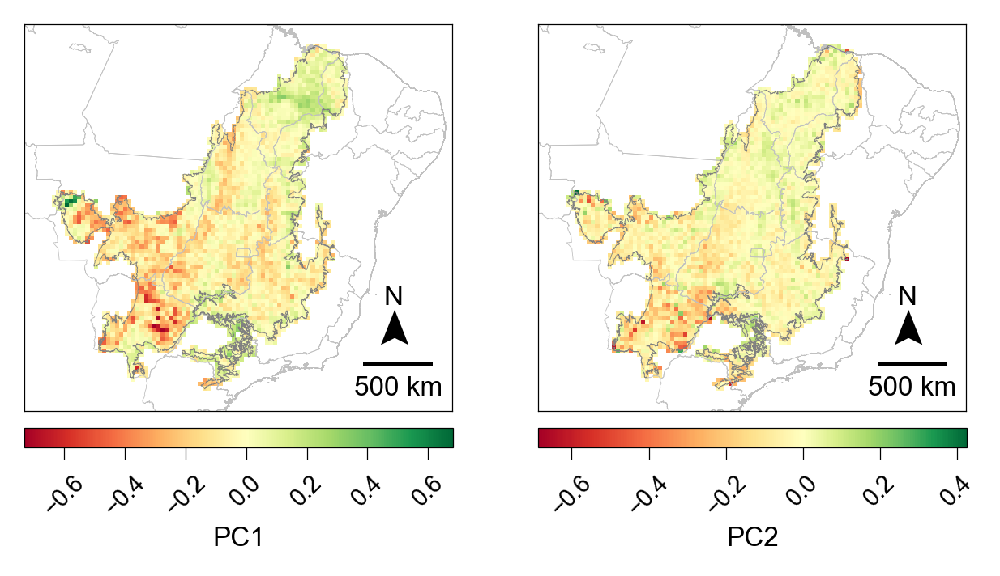

In [25]:
fig, axes = plt.subplots(1, 2, figsize = (5, 2.5))

deltaPC1 = pcaproj_p4['PC1'] - data['p1']['PC1']
deltaPC2 = pcaproj_p4['PC2'] - data['p1']['PC2']
delta = pd.DataFrame({'id': pcaproj_p4['id'].tolist(),
                      'PC1' : deltaPC1.tolist(),
                      'PC2' : deltaPC2.tolist()})
delta = grid.merge(delta, on = 'id', how = 'right')

plot_pca_trends(delta, 'PC1', axes[0])
plot_pca_trends(delta, 'PC2', axes[1])

plt.savefig('../plots/maps_change_PCA.png', dpi=300, facecolor='white', transparent=False, bbox_inches="tight")
plt.savefig('../plots/maps_change_PCA.pdf', dpi=300, facecolor='white', transparent=False, bbox_inches="tight")
plt.show()

In [21]:
def plot_PCA_trends_sig(data, var, var_label, ax):
    
    toPlot = data[data['pca_var'] == var].reset_index(drop = True)
    
    # Trends in BA season length using interquantile definition
    vmin, vmax, vcenter = toPlot['slope'].min(), toPlot['slope'].max(), 0
    if (vmin <= vcenter) & (vcenter <= vmax):
        # Establishing the scale for the plots and the color bar
        norm = TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)
        cmap = 'RdYlGn'
        cbar = plt.cm.ScalarMappable(norm=norm, cmap=cmap)
    else:
        norm = Normalize(vmin=vmin, vmax=vmax)
        cmap = 'Oranges'
        cbar = plt.cm.ScalarMappable(norm=norm, cmap=cmap)

    toPlot[toPlot['slope_sig'] == True].plot(column = 'slope',
                                             ax = ax,
                                             norm = norm,
                                             cmap = cmap)

    toPlot[toPlot['slope_sig'] == False].plot(column = 'slope',
                      ax = ax,
                      color = 'gainsboro' )
    
    # Adding colorbar
    axins = inset_axes(ax, width = '100%', height = '5%', bbox_to_anchor = (0.045,-1.,1.,1), bbox_transform=ax.transAxes)#[0.,0.,1.,1]) 
    axins.xaxis.set_ticks_position("bottom")
    cb = fig.colorbar(cbar, cax=axins, orientation = 'horizontal')
    cb.outline.set_linewidth(0.3)
    # cb.set_label(var_label, fontsize = 8)
    
    # ax.text(x=0.0, y=1.05, s=var, transform=ax.transAxes, fontsize=8)
    axins.set_xlabel(var_label, fontsize = 8, labelpad = 2)
    
    # Size and orientation of colorbar ticks and tick labels
    # if var != 'season_q50s_rel':
    #     axins.tick_params(width = 0.3, labelsize = 8)
    # elif var == 'season_q50s_rel':
    axins.tick_params(width = 0.3, labelsize = 7, rotation = 45)
        
    # Map margins
    minx, miny, maxx, maxy = fdata.total_bounds
    ax.set_xlim(minx-200000, maxx+750000)
    ax.set_ylim(miny-150000, maxy+150000)
    
    # Remove ticks of plot frame
    ax.tick_params(axis='both', 
                    which='both',
                    bottom=False,
                    left = False,
                    labelbottom=False, labelleft = False)
    
    # Change width of all spines of axis
    for axis in ['top','bottom','left','right']:
        ax.spines[axis].set_linewidth(0.3)

    # indication of north
    # Including an arrow
    yheight = 0.275
    xheight = 0.85
    ax.text(x=xheight, y=yheight, s='N', transform=ax.transAxes, fontsize=8)
    # 0.055 for the 4-grid, 0.05 for the 3-grid
    ax.arrow(xheight + 0.025, yheight - 0.075, 0.0, 0.05, length_includes_head=True, transform=ax.transAxes,
              width = 0, head_width=0.05, head_length=0.07, overhang=0.2, facecolor='k')
    
    # Adding scale bar
    # Taken from the GeoPandas documentation: https://geopandas.org/en/stable/gallery/matplotlib_scalebar.html 
    ax.add_artist(ScaleBar(dx = 1, units = 'm', dimension = 'si-length',  location='lower right', font_properties={'size': 8}, sep = 3))
    
    
    br_states = gpd.read_file('../../data/shapes/brazilian_states/gadm36_BRA_1.shp')
    br_states = br_states.to_crs(toPlot.crs)
    br_states.boundary.plot(ax = ax, linewidth=0.2, edgecolor = 'silver')
    

    cerrado = gpd.read_file('../../data/shapes/cerrado_1-250000.shp')
    cerrado = cerrado.to_crs(toPlot.crs)
    cerrado.boundary.plot(ax = ax, linewidth=0.2, edgecolor = 'grey')
    

In [70]:
pc2_trends = pca_trends[pca_trends['pca_var'] == 'PC2']
pc2_trends['sign'] = 0
pc2_trends.loc[(pc2_trends['slope'] > 0) & (pc2_trends['slope_sig'] == True), 'sign'] = 1 
pc2_trends.loc[(pc2_trends['slope'] < 0) & (pc2_trends['slope_sig'] == True), 'sign'] = -1
# print(pc1_trends)

ap4 = pc2_trends[pc2_trends['clust_alpha_{}'.format(kp4_1)] == 'AP4']
print(100*ap4[['sign','slope']].groupby(by = 'sign').size()/len(ap4))

bp4 = pc2_trends[pc2_trends['clust_alpha_{}'.format(kp4_1)] == 'BP4']
print(100*bp4[['sign','slope']].groupby(by = 'sign').size()/len(bp4))

cp4 = pc2_trends[pc2_trends['clust_alpha_{}'.format(kp4_1)] == 'CP4']
print(100*cp4[['sign','slope']].groupby(by = 'sign').size()/len(cp4))


sign
-1     7.692308
 0    85.714286
 1     6.593407
dtype: float64
sign
-1     5.711086
 0    86.562150
 1     7.726764
dtype: float64
sign
-1    16.751269
 0    79.187817
 1     4.060914
dtype: float64


In [69]:
pc1_trends = pca_trends[pca_trends['pca_var'] == 'PC1']
pc1_trends['sign'] = 0
pc1_trends.loc[(pc1_trends['slope'] > 0) & (pc1_trends['slope_sig'] == True), 'sign'] = 1 
pc1_trends.loc[(pc1_trends['slope'] < 0) & (pc1_trends['slope_sig'] == True), 'sign'] = -1
# print(pc1_trends)

ap4 = pc1_trends[pc1_trends['clust_alpha_{}'.format(kp4_1)] == 'AP4']
print(100*ap4[['sign','slope']].groupby(by = 'sign').size()/len(ap4))
print(ap4[['sign','slope', 'clust_alpha_{}'.format(kp1_1)]].groupby(by = ['sign', 'clust_alpha_{}'.format(kp1_1)]).size())

bp4 = pc1_trends[pc1_trends['clust_alpha_{}'.format(kp4_1)] == 'BP4']
print(100*bp4[['sign','slope']].groupby(by = 'sign').size()/len(bp4))
print(bp4[['sign','slope', 'clust_alpha_{}'.format(kp1_1)]].groupby(by = ['sign', 'clust_alpha_{}'.format(kp1_1)]).size())

cp4 = pc1_trends[pc1_trends['clust_alpha_{}'.format(kp4_1)] == 'CP4']
print(100*cp4[['sign','slope']].groupby(by = 'sign').size()/len(cp4))
print(cp4[['sign','slope', 'clust_alpha_{}'.format(kp1_1)]].groupby(by = ['sign', 'clust_alpha_{}'.format(kp1_1)]).size())


sign
-1     2.197802
 0    68.681319
 1    29.120879
dtype: float64
sign  clust_alpha_5
-1    AP1                4
 0    AP1              110
      EP1               15
 1    AP1               43
      EP1               10
dtype: int64
sign
-1    15.901456
 0    69.764838
 1    14.333707
dtype: float64
sign  clust_alpha_5
-1    BP1              122
      EP1               20
 0    AP1                4
      BP1              411
      EP1              208
 1    AP1                4
      BP1               47
      EP1               77
dtype: int64
sign
-1    27.093909
 0    67.703046
 1     5.203046
dtype: float64
sign  clust_alpha_5
-1    BP1              219
      CP1              115
      DP1                1
      EP1               92
 0    BP1              236
      CP1              497
      DP1               31
      EP1              303
 1    BP1                2
      CP1               67
      DP1                4
      EP1                9
dtype: int64


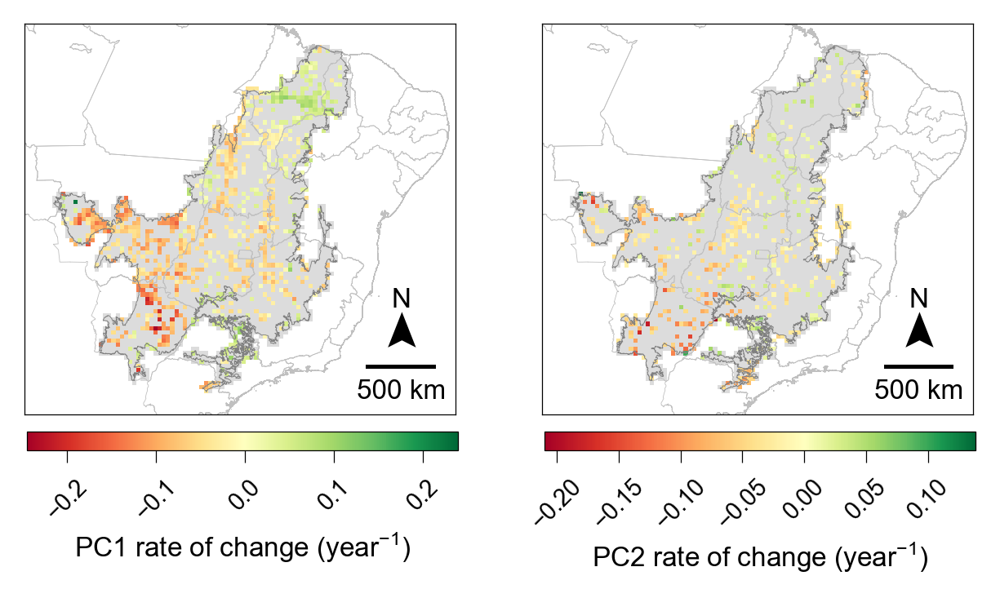

In [37]:
fig, axes = plt.subplots(1, 2, figsize = (5, 2.5))

plot_PCA_trends_sig(pca_trends, 'PC1', 'PC1 rate of change (year$^\mathregular{-1}$)', axes[0])
plot_PCA_trends_sig(pca_trends, 'PC2', 'PC2 rate of change (year$^\mathregular{-1}$)', axes[1])

plt.savefig('../plots/maps_change_PCA_sig.png', dpi=300, facecolor='white', transparent=False, bbox_inches="tight")
plt.savefig('../plots/maps_change_PCA_sig.pdf', dpi=300, facecolor='white', transparent=False, bbox_inches="tight")
plt.show()

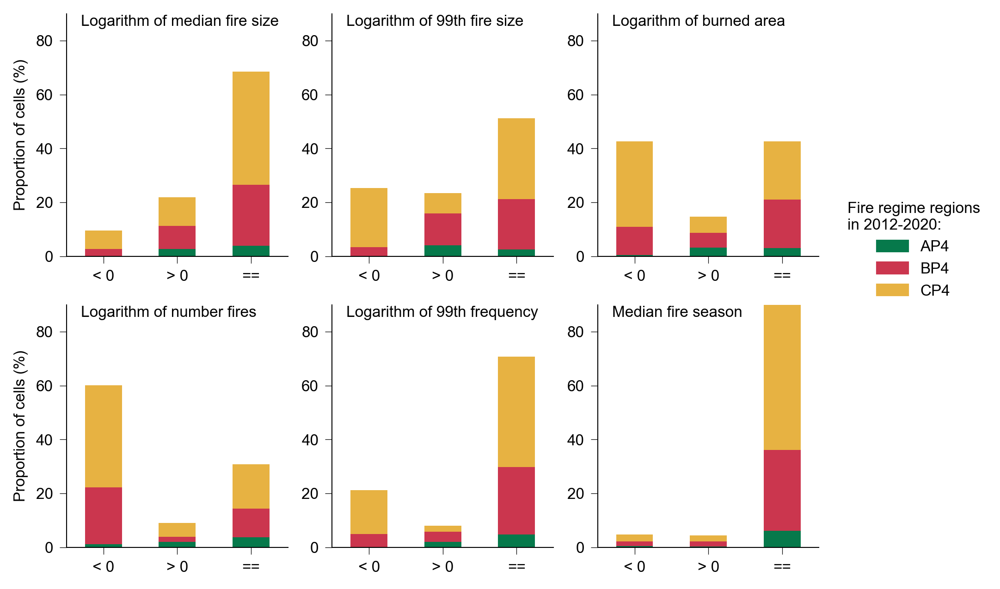

In [89]:
# Creating the boxplots
fig, axes = plt.subplots(2, 3, figsize = (7, 5))

month_cut = 1.

c = 0
for var, axx, var_label in zip(fire_vars_t, axes.flatten(), pca_comp_labels):
    
    if var == 'season_q50s':
        var = 'season_q50s_rel'
    
    toPlot = fvars_ts.loc[fvars_ts['fire_var'] == var, ['clust_{}'.format(kp4_1),'clust_alpha_{}'.format(kp4_1),'colors_{}'.format(kp4_1),'sign_slope']].reset_index(drop = True)
    
    sign_var = toPlot.value_counts().reset_index(name = 'count')
    
    sign_var['perc_change'] = 100 * sign_var['count']/len(fvars_ts['id'].unique())
    
    sign_var = sign_var.sort_values(by = 'sign_slope').reset_index(drop = True)

    bar_plot = pd.DataFrame({'AP4' : sign_var[sign_var['clust_alpha_3'] == 'AP4']['perc_change'].tolist(),
                             'BP4' : sign_var[sign_var['clust_alpha_3'] == 'BP4']['perc_change'].tolist(),
                             'CP4' : sign_var[sign_var['clust_alpha_3'] == 'CP4']['perc_change'].tolist()},
                            index = [0, 1, 2])
    bar_plot.plot(kind = 'bar', stacked = True, color = sign_var.sort_values(by = 'clust_alpha_3')['colors_3'].unique(), ax = axx, legend = False)
    axx.set_xticklabels(['< 0', '> 0', '=='], rotation = 0, fontsize = 8)
    axx.set_yticklabels(np.arange(0,90, 20), fontsize = 8)
    
    axx.text(x=0.065, y=0.95, s=var_label, transform=axx.transAxes, fontsize=8)

    if c in [0, 3]:
        axx.set_ylabel ('Proportion of cells (%)', fontsize = 8)
    else:
        axx.set_ylabel('')
    
    axx.set_ylim(0, 90)
    
    # Change width of all spines of axis
    for axis in ['top','right']:
        axx.spines[axis].set_linewidth(0.)
    for axis in ['bottom','left']:
        axx.spines[axis].set_linewidth(0.5)
        
    axx.tick_params(axis='both', 
                    which='both',
                    bottom=True,
                    left = True,
                    labelbottom=True, labelleft = True,
                    width = 0.3)
    c += 1

 # ANNOTATE NAMES AND REMOVE X LABEL, SHARE Y LABEL, TAKE LEGEND OUT

# Create legend manually
patches_p4 = [Patch(color = c, label = l) for c, l in zip(pal_p14['p4'].values(), pal_p14['p4'].keys())]
plt.legend(handles = patches_p4, title ='Fire regime regions\nin 2012-2020:', loc = (1.1, 1.), fontsize = 8, title_fontsize = 8, frameon = False)

plt.savefig('../plots/barplot_signChange_overall.png', dpi=300, facecolor='white', transparent=False, bbox_inches="tight")
plt.savefig('../plots/barplot_signChange_overall.pdf', dpi=300, facecolor='white', transparent=False, bbox_inches="tight")
plt.show()

9
496
284
312
68


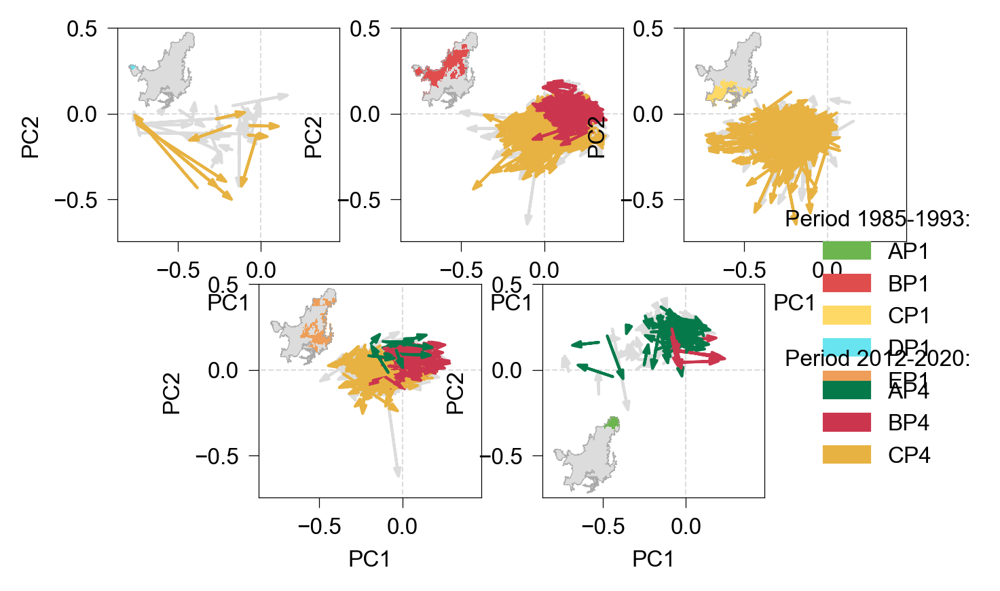

In [53]:
fig = plt.figure(figsize = (10, 6.))
gs = mpl.gridspec.GridSpec(4, 6, wspace=0.75, hspace=0.5)

grid_indicator = [[(0,2), (0,2)], [(0,2), (2,4)], [(0,2), (4,6)], [(2,4), (1,3)], [(2,4), (3,5)]]

# num_select = [int(0.15 * len(data['p1'][data['p1']['clust_{}'.format(kp1_1)] == cl_id])) for cl_id in range(1, kp1_1 + 1)]


for h, indicator in zip(range(kp1_1), grid_indicator):
    
    cl_id = h + 1
    
    x1, x2 = indicator[0]
    y1, y2 = indicator[1]
    
    axes = fig.add_subplot(gs[x1:x2, y1:y2])
    
    clust_p1 = data['p1'][data['p1']['clust_{}'.format(kp1_1)] == cl_id].reset_index(drop = True) 
    clust_p4 = pcaproj_p4[pcaproj_p4['clust_{}'.format(kp1_1)] == cl_id].reset_index(drop = True) 
    # print(clust_p1)
    
    # n_total = num_select[h]
    # unique_counts = clust_p4.groupby('clust_{}'.format(kp4_1))['id'].agg('nunique')
    # nums_selected= np.floor(unique_counts / unique_counts.sum() * n_total).astype(int)  # rounded down

    # selection = clust_p4.groupby('clust_{}'.format(kp4_1), group_keys = False).apply(
    #     lambda x: x.sample(n = nums_selected[x.name], #num_select[h]
    #                        replace = False))
    # selection = selection.index.tolist()
    
    # Select those cells where at least one of the PCA components has a signficative change in time
    selection = pca_trends.loc[(pca_trends['slope_sig'] == True) & (pca_trends['clust_{}'.format(kp1_1)] == cl_id), 'id'].unique().tolist()
    print(len(selection))

    axes.axvline(0, -1, 1, linestyle = '--', linewidth = 0.5, color = 'gainsboro')
    axes.axhline(0, -1, 1, linestyle = '--', linewidth = 0.5, color = 'gainsboro')
    
    axes.set_xlim(pc1_min - 0.1, pc1_max + 0.1)
    axes.set_ylim(pc2_min - 0.1, pc2_max + 0.1)
    
    axes.set_xlabel('PC1', fontsize = 8)
    axes.set_ylabel('PC2', fontsize = 8)
    
    axes.tick_params(axis='both', 
                    which='both',
                    bottom=True,
                    left = True,
                    labelbottom=True, labelleft = True,
                    width = 0.3,
                    labelsize = 8)
    
    # Change width of all spines of axis
    for axis in ['top','bottom','left','right']:
        axes.spines[axis].set_linewidth(0.3)

    for i in clust_p4[~clust_p4['id'].isin(selection)].index:#range(len(clust_p1['PC1'])):
        basex = clust_p1.loc[i, 'PC1'].item()
        basey = clust_p1.loc[i, 'PC2'].item()

        dx = clust_p4.loc[i, 'PC1'].item()# - basex
        dy = clust_p4.loc[i, 'PC2'].item()# - basey

        c = 'gainsboro' #clust_p4.loc[i, 'colors']

        axes.annotate('', xy = (dx, dy),
                      xytext = (basex, basey),
                      arrowprops = {'edgecolor' : c, 'facecolor':c, 'width' : 0.0001, 'headwidth':2, 'headlength':3})


    for i in clust_p4[clust_p4['id'].isin(selection)].index:#range(len(clust_p1['PC1'])):
        basex = clust_p1.loc[i, 'PC1'].item()
        basey = clust_p1.loc[i, 'PC2'].item()

        dx = clust_p4.loc[i, 'PC1'].item()# - basex
        dy = clust_p4.loc[i, 'PC2'].item()# - basey

        c = clust_p4.loc[i, 'colors_{}'.format(kp4_1)]
        axes.annotate('', xy = (dx, dy),
                      xytext = (basex, basey),
                      arrowprops = {'edgecolor' : c, 'facecolor':c, 'width' : 0.0001, 'headwidth':2, 'headlength':3})

    # Create inset legend manually
    if cl_id < kp1_1:
        # Where to put the box and its shape
        ax = axes.inset_axes([0.,0.6,0.4,0.4])   
    elif cl_id == kp1_1:
        ax = axes.inset_axes([0.,0.0,0.4,0.4]) 
    ax.set_aspect('equal', adjustable = 'box')

    # Create temporary column with colors
    data['p1']['map_col'] = 'gainsboro'
    data['p1'].loc[data['p1']['clust_{}'.format(kp1_1)] == cl_id, 'map_col'] = data['p1'].loc[data['p1']['clust_{}'.format(kp1_1)] == cl_id, 'colors_{}'.format(kp1_1)]
    data['p1'].plot(ax = ax, color = data['p1']['map_col'])
    
    cerrado = gpd.read_file('../../data/shapes/cerrado_1-250000.shp')
    cerrado = cerrado.to_crs(grid.crs)
    cerrado.boundary.plot(ax = ax, linewidth=0.2, edgecolor = 'darkgrey')

    ax.set_axis_off()
    # break
    
# Create legend manually
patches_p1 = [Patch(color = c, label = l) for c, l in zip(pal_p14['p1'].values(), pal_p14['p1'].keys())]
patches_p4 = [Patch(color = c, label = l) for c, l in zip(pal_p14['p4'].values(), pal_p14['p4'].keys())]
legend_p1 = plt.legend(handles = patches_p1, title ='Period 1985-1993:', loc = (1.05, 0.45), fontsize = 8, title_fontsize = 8, frameon = False)
plt.legend(handles = patches_p4, title ='Period 2012-2020:', loc = (1.05, .1), fontsize = 8, title_fontsize = 8, frameon = False)
plt.gca().add_artist(legend_p1)

plt.savefig('../plots/arrows_change_cluster_onlySig.png', dpi=300, facecolor='white', transparent=False, bbox_inches="tight")
plt.savefig('../plots/arrows_change_cluster_onlySig.pdf', dpi=300, facecolor='white', transparent=False, bbox_inches="tight")
plt.show()

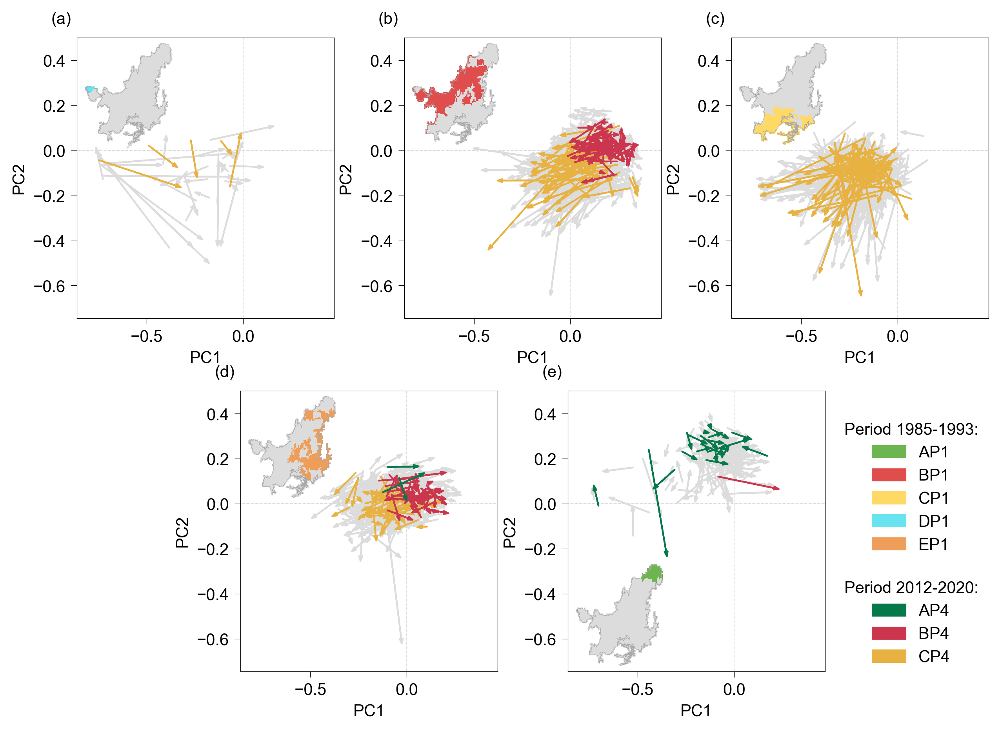

In [74]:
fig = plt.figure(figsize = (10, 6.5))
gs = mpl.gridspec.GridSpec(4, 6, wspace=0.75, hspace=0.8)

grid_indicator = [[(0,2), (0,2)], [(0,2), (2,4)], [(0,2), (4,6)], [(2,4), (1,3)], [(2,4), (3,5)]]

num_select = [int(0.15 * len(data['p1'][data['p1']['clust_{}'.format(kp1_1)] == cl_id])) for cl_id in range(1, kp1_1 + 1)]

fig_label = ['(a)', '(b)', '(c)', '(d)', '(e)']


for h, indicator in zip(range(kp1_1), grid_indicator):
    
    cl_id = h + 1
    
    x1, x2 = indicator[0]
    y1, y2 = indicator[1]
    
    axes = fig.add_subplot(gs[x1:x2, y1:y2])
    
    clust_p1 = data['p1'][data['p1']['clust_{}'.format(kp1_1)] == cl_id].reset_index(drop = True) 
    clust_p4 = pcaproj_p4[pcaproj_p4['clust_{}'.format(kp1_1)] == cl_id].reset_index(drop = True) 
    
    n_total = num_select[h]
    unique_counts = clust_p4.groupby('clust_{}'.format(kp4_1))['id'].agg('nunique')
    nums_selected= np.floor(unique_counts / unique_counts.sum() * n_total).astype(int)  # rounded down

    selection = clust_p4.groupby('clust_{}'.format(kp4_1), group_keys = False).apply(
        lambda x: x.sample(n = nums_selected[x.name], #num_select[h]
                           replace = False))
    selection = selection.index.tolist()

    axes.axvline(0, -1, 1, linestyle = '--', linewidth = 0.5, color = 'gainsboro')
    axes.axhline(0, -1, 1, linestyle = '--', linewidth = 0.5, color = 'gainsboro')
    
    axes.set_xlim(pc1_min - 0.1, pc1_max + 0.1)
    axes.set_ylim(pc2_min - 0.1, pc2_max + 0.1)
    
    axes.set_xlabel('PC1', fontsize = 10)
    axes.set_ylabel('PC2', fontsize = 10)
    
    # Adding figure label
    axes.text(x=-0.1, y=1.05, s=fig_label[h], transform=axes.transAxes, fontsize=10)
    
    axes.tick_params(axis='both', 
                    which='both',
                    bottom=True,
                    left = True,
                    labelbottom=True, labelleft = True,
                    width = 0.3,
                    labelsize = 10)
    
    # Change width of all spines of axis
    for axis in ['top','bottom','left','right']:
        axes.spines[axis].set_linewidth(0.3)

    for i in clust_p4[~clust_p4.index.isin(selection)].index:#range(len(clust_p1['PC1'])):
        basex = clust_p1.loc[i, 'PC1'].item()
        basey = clust_p1.loc[i, 'PC2'].item()

        dx = clust_p4.loc[i, 'PC1'].item()# - basex
        dy = clust_p4.loc[i, 'PC2'].item()# - basey

        c = 'gainsboro' #clust_p4.loc[i, 'colors']

        axes.annotate('', xy = (dx, dy),
                      xytext = (basex, basey),
                      arrowprops = {'edgecolor' : c, 'facecolor':c, 'width' : 0.0001, 'headwidth':2, 'headlength':3})


    for i in selection:#range(len(clust_p1['PC1'])):
        basex = clust_p1.loc[i, 'PC1'].item()
        basey = clust_p1.loc[i, 'PC2'].item()

        dx = clust_p4.loc[i, 'PC1'].item()# - basex
        dy = clust_p4.loc[i, 'PC2'].item()# - basey

        c = clust_p4.loc[i, 'colors_{}'.format(kp4_1)]
        axes.annotate('', xy = (dx, dy),
                      xytext = (basex, basey),
                      arrowprops = {'edgecolor' : c, 'facecolor':c, 'width' : 0.0001, 'headwidth':2, 'headlength':3})

    # Create inset legend manually
    if cl_id < kp1_1:
        # Where to put the box and its shape
        ax = axes.inset_axes([0.,0.6,0.4,0.4])   
    elif cl_id == kp1_1:
        ax = axes.inset_axes([0.,0.0,0.4,0.4]) 
    ax.set_aspect('equal', adjustable = 'box')

    # Create temporary column with colors
    data['p1']['map_col'] = 'gainsboro'
    data['p1'].loc[data['p1']['clust_{}'.format(kp1_1)] == cl_id, 'map_col'] = data['p1'].loc[data['p1']['clust_{}'.format(kp1_1)] == cl_id, 'colors_{}'.format(kp1_1)]
    data['p1'].plot(ax = ax, color = data['p1']['map_col'])
    
    cerrado = gpd.read_file('../../data/shapes/cerrado_1-250000.shp')
    cerrado = cerrado.to_crs(grid.crs)
    cerrado.boundary.plot(ax = ax, linewidth=0.2, edgecolor = 'darkgrey')

    ax.set_axis_off()
    # break
    
# Create legend manually
patches_p1 = [Patch(color = c, label = l) for c, l in zip(pal_p14['p1'].values(), pal_p14['p1'].keys())]
patches_p4 = [Patch(color = c, label = l) for c, l in zip(pal_p14['p4'].values(), pal_p14['p4'].keys())]
legend_p1 = plt.legend(handles = patches_p1, title ='Period 1985-1993:', loc = (1.05, 0.4), fontsize = 10, title_fontsize = 10, frameon = False)
plt.legend(handles = patches_p4, title ='Period 2012-2020:', loc = (1.05, 0.), fontsize = 10, title_fontsize = 10, frameon = False)
plt.gca().add_artist(legend_p1)

plt.savefig('../plots/arrows_change_cluster.png', dpi=300, facecolor='white', transparent=False, bbox_inches="tight")
plt.savefig('../plots/arrows_change_cluster.pdf', dpi=300, facecolor='white', transparent=False, bbox_inches="tight")
plt.show()

In [22]:
def plot_trends(data, var, var_label, fig_label, units, ax):
    
    if var == 'season_q50s':
        var = 'season_q50s_rel'
    
    toPlot = data[data['fire_var'] == var].reset_index(drop = True)
    
    # Trends in BA season length using interquantile definition
    vmin, vmax, vcenter = toPlot['slope'].min(), toPlot['slope'].max(), 0
    if (vmin <= vcenter) & (vcenter <= vmax):
        # Establishing the scale for the plots and the color bar
        norm = TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)
        cmap = 'RdYlGn'
        cbar = plt.cm.ScalarMappable(norm=norm, cmap=cmap)
    else:
        norm = Normalize(vmin=vmin, vmax=vmax)
        cmap = 'Oranges'
        cbar = plt.cm.ScalarMappable(norm=norm, cmap=cmap)

    toPlot[toPlot['slope_sig'] == True].plot(column = 'slope',
                                             ax = ax,
                                             norm = norm,
                                             cmap = cmap)

    toPlot[toPlot['slope_sig'] == False].plot(column = 'slope',
                      ax = ax,
                      color = 'gainsboro' )
    
    # Adding colorbar
    axins = inset_axes(ax, width = '100%', height = '5%', bbox_to_anchor = (0.045,-1.,1.,1), bbox_transform=ax.transAxes)#[0.,0.,1.,1]) 
    axins.xaxis.set_ticks_position("bottom")
    
    cb = fig.colorbar(cbar, cax=axins, orientation = 'horizontal')
    cb.outline.set_linewidth(0.3)
    axins.set_xlabel(units, fontsize = 7, labelpad = 0.25)
    
    # cb.set_label(var_label, fontsize = 8)
    
    # Adding figure title
    ax.text(x=0.0, y=1.05, s=var_label, transform=ax.transAxes, fontsize=8)
    
    
    # Adding figure label
    ax.text(x=-0.1, y=1.05, s=fig_label, transform=ax.transAxes, fontsize=8)
    
    # Size and orientation of colorbar ticks and tick labels
    # if var != 'season_q50s_rel':
    #     axins.tick_params(width = 0.3, labelsize = 8)
    # elif var == 'season_q50s_rel':
    axins.tick_params(width = 0.3, labelsize = 7, rotation = 45)
        
    # Map margins
    minx, miny, maxx, maxy = fdata.total_bounds
    ax.set_xlim(minx-200000, maxx+750000)
    ax.set_ylim(miny-150000, maxy+150000)
    
    # Remove ticks of plot frame
    ax.tick_params(axis='both', 
                    which='both',
                    bottom=False,
                    left = False,
                    labelbottom=False, labelleft = False)
    
    # Change width of all spines of axis
    for axis in ['top','bottom','left','right']:
        ax.spines[axis].set_linewidth(0.3)

    # indication of north
    # Including an arrow
    yheight = 0.275
    xheight = 0.84
    ax.text(x=xheight, y=yheight, s='N', transform=ax.transAxes, fontsize=8)
    # 0.055 for the 4-grid, 0.05 for the 3-grid
    ax.arrow(xheight + 0.025, yheight - 0.075, 0.0, 0.05, length_includes_head=True, transform=ax.transAxes,
              width = 0, head_width=0.05, head_length=0.07, overhang=0.2, facecolor='k')
    
    # Adding scale bar
    # Taken from the GeoPandas documentation: https://geopandas.org/en/stable/gallery/matplotlib_scalebar.html 
    ax.add_artist(ScaleBar(dx = 1, units = 'm', dimension = 'si-length',  location='lower right', font_properties={'size': 8}, sep = 3))
    
    
    br_states = gpd.read_file('../../data/shapes/brazilian_states/gadm36_BRA_1.shp')
    br_states = br_states.to_crs(toPlot.crs)
    br_states.boundary.plot(ax = ax, linewidth=0.2, edgecolor = 'silver')
    

    cerrado = gpd.read_file('../../data/shapes/cerrado_1-250000.shp')
    cerrado = cerrado.to_crs(toPlot.crs)
    cerrado.boundary.plot(ax = ax, linewidth=0.2, edgecolor = 'grey')
    

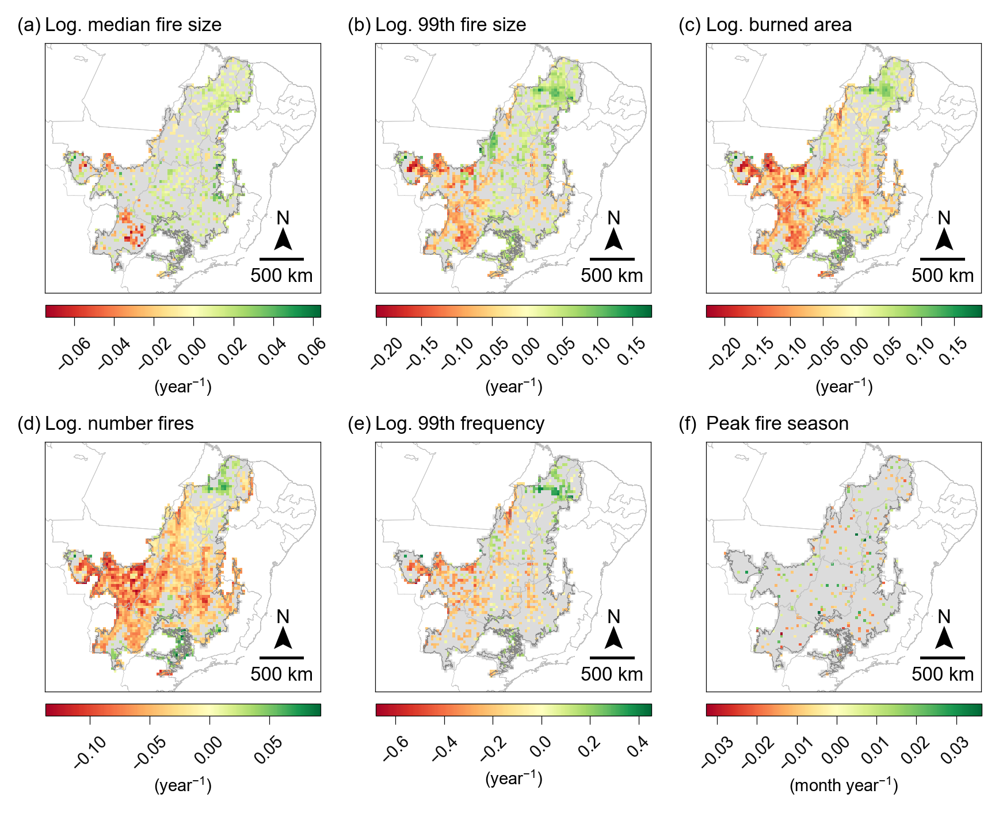

In [52]:
# Generate map for every variable
fig, axes = plt.subplots(2, 3, figsize = (7, 5.5))

for (var, ax, var_label, fig_label, units) in zip(fire_vars_t, axes.flatten(), pca_comp_labels,
                               ['(a)', '(b)', '(c)', '(d)', '(e)', '(f)'],
                                          ['(year$^\mathregular{-1}$)', '(year$^\mathregular{-1}$)', '(year$^\mathregular{-1}$)', '(year$^\mathregular{-1}$)', '(year$^\mathregular{-1}$)', '(month year$^\mathregular{-1}$)']):
    plot_trends(fvars_ts, var, var_label, fig_label, units, ax)

plt.savefig('../plots/maps_change_fireVars.png', dpi=300, facecolor='white', transparent=False, bbox_inches="tight")
plt.savefig('../plots/maps_change_fireVars.pdf', dpi=300, facecolor='white', transparent=False, bbox_inches="tight")
plt.show()

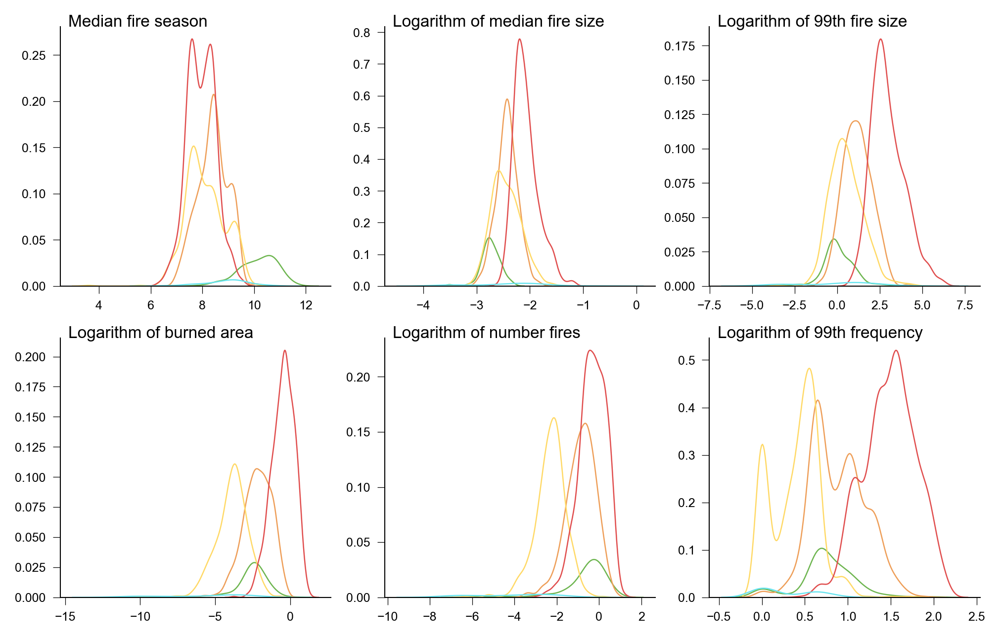

In [26]:
# Creating the boxplots
fig, axes = plt.subplots(2, 3, figsize = (8, 5))


for var, axx, var_label in zip(fire_vars_t, axes.flatten(), pca_comp_labels):
    
    sns.kdeplot(fdata_p1, x = var, hue = 'clust_alpha_{}'.format(kp1_1), palette = pal_p14['p1'], fill = False, ax = axx, legend = False, linewidth = 0.6)
    
    axx.set_xlabel('')
    axx.set_ylabel('')
    
    axx.tick_params(axis='both', 
                    which='both',
                    bottom=True,
                    left = True,
                    labelbottom=True, labelleft = True,
                    width = 0.3,
                    labelsize = 6)
    
    # Change width of all spines of axis
    for axis in ['top','right']:
        axx.spines[axis].set_linewidth(0.)
    for axis in ['bottom','left']:
        axx.spines[axis].set_linewidth(0.5)
        
    axx.text(x=0.03, y=1.0, s=var_label, transform=axx.transAxes, fontsize=8)

plt.savefig('../plots/period1_fireVars_distribution.png', dpi=600, facecolor='white', transparent=False, bbox_inches="tight")
plt.savefig('../plots/period1_fireVars_distribution.pdf', dpi=600, facecolor='white', transparent=False, bbox_inches="tight")
plt.show()

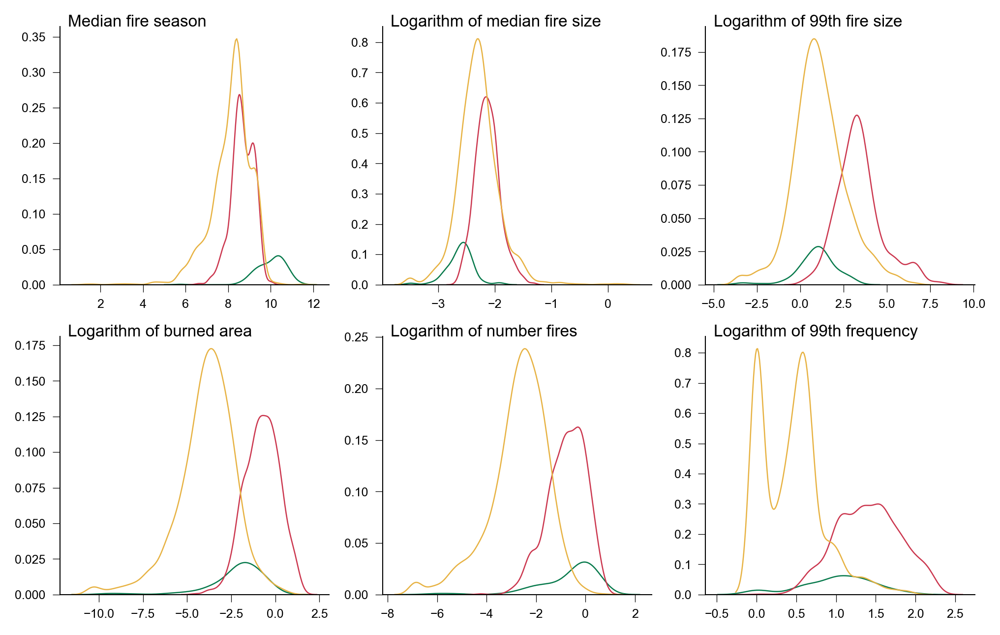

In [27]:
# Creating the boxplots
fig, axes = plt.subplots(2, 3, figsize = (8, 5))


for var, axx, var_label in zip(fire_vars_t, axes.flatten(), pca_comp_labels):
    
    sns.kdeplot(fdata_p4, x = var, hue = 'clust_alpha_{}'.format(kp4_1), palette = pal_p14['p4'], fill = False, ax = axx, legend = False, linewidth = 0.6)
    
    axx.set_xlabel('')
    axx.set_ylabel('')
    
    axx.tick_params(axis='both', 
                    which='both',
                    bottom=True,
                    left = True,
                    labelbottom=True, labelleft = True,
                    width = 0.3,
                    labelsize = 6)
    
    # Change width of all spines of axis
    for axis in ['top','right']:
        axx.spines[axis].set_linewidth(0.)
    for axis in ['bottom','left']:
        axx.spines[axis].set_linewidth(0.5)
        
    axx.text(x=0.03, y=1.0, s=var_label, transform=axx.transAxes, fontsize=8)

plt.savefig('../plots/period4_fireVars_distribution.png', dpi=600, facecolor='white', transparent=False, bbox_inches="tight")
plt.savefig('../plots/period4_fireVars_distribution.pdf', dpi=600, facecolor='white', transparent=False, bbox_inches="tight")
plt.show()

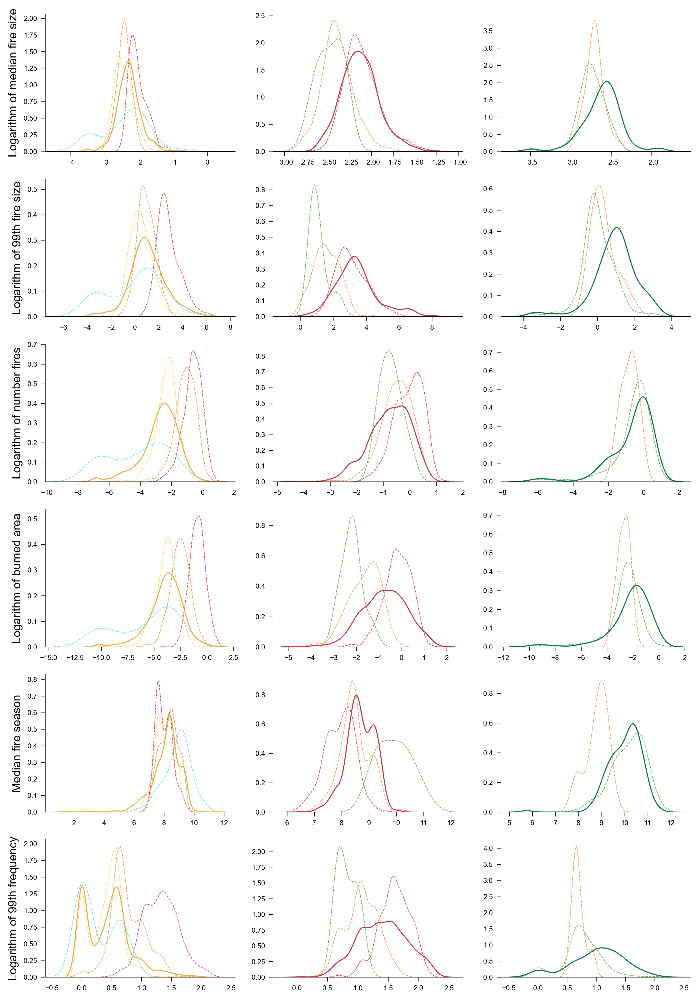

In [66]:
fig, axes = plt.subplots(6, 3, figsize = (10, 15))

axx = axes.flatten()

i = 0
for var, var_label in zip(fire_vars_t, pca_comp_labels):
    
    
    
    for k in range(1, kp4_1 + 1):
        
        toPlot_p1 = fdata_p1[fdata_p1['clust_{}'.format(kp4_1)] == k].reset_index(drop = True).copy()
        toPlot_p4 = fdata_p4[fdata_p4['clust_{}'.format(kp4_1)] == k].reset_index(drop = True).copy()

        sns.kdeplot(toPlot_p1, x = var, hue = 'clust_alpha_{}'.format(kp1_1), palette = pal_p14['p1'], fill = False, ax = axx[i], 
                    linestyle = '--',  linewidth = 0.6,
                    legend = False, 
                    common_norm = False)

        sns.kdeplot(toPlot_p4, x = var, hue = 'clust_alpha_{}'.format(kp4_1), palette = pal_p14['p4'], fill = False, ax = axx[i], 
                    linewidth = 0.9,
                    legend = False)
        
        axx[i].set_xlabel('')
        if i in [0, 3, 6, 9, 12, 15]:
            axx[i].set_ylabel(var_label)
        else:
            axx[i].set_ylabel('')

        axx[i].tick_params(axis='both', 
                        which='both',
                        bottom=True,
                        left = True,
                        labelbottom=True, labelleft = True,
                        width = 0.3,
                        labelsize = 6)

        # Change width of all spines of axis
        for axis in ['top','right']:
            axx[i].spines[axis].set_linewidth(0.)
        for axis in ['bottom','left']:
            axx[i].spines[axis].set_linewidth(0.5)
        
        i += 1

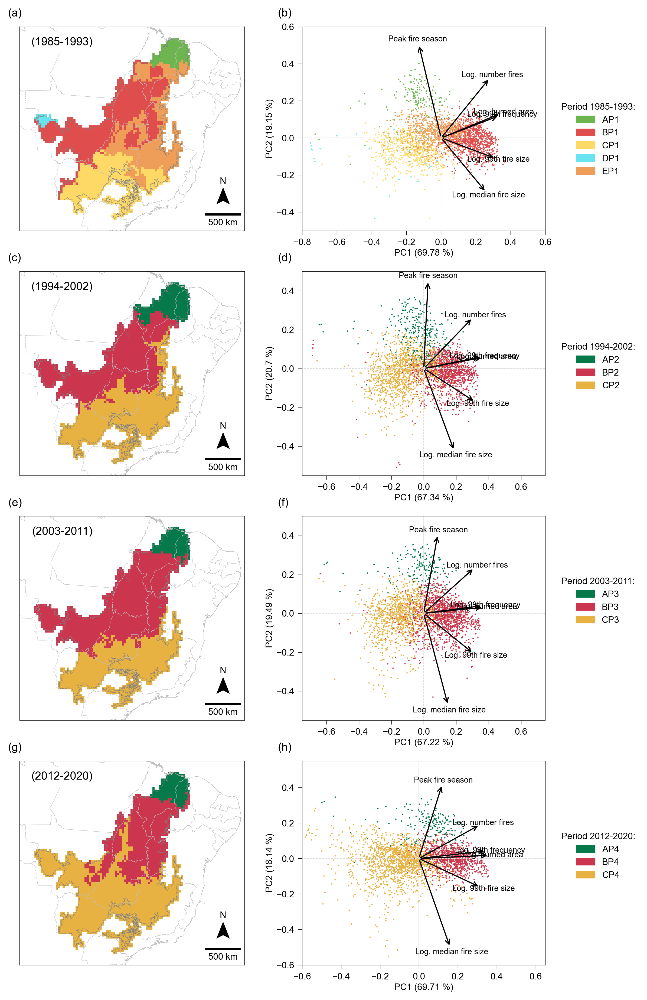

In [53]:
fig, axes = plt.subplots(4, 2, figsize = (8.5, 15))

pca_lim = [((-0.8, 0.6), (-0.5, 0.6)), ((-0.75, 0.75), (-0.55, 0.5)), ((-0.75, 0.75), (-0.55, 0.5)), ((-0.6, 0.65), (-0.6, 0.55))]

# Plot for each solution (number of clusters)
for i, period, k, p_label, (xlim, ylim), (map_label, pca_label) in zip(range(4), [1, 2, 3, 4], [kp1_1, kp2_1, kp3_1, kp4_1], ['(1985-1993)', '(1994-2002)', '(2003-2011)', '(2012-2020)'], pca_lim,
                                                                       [('(a)', '(b)'),('(c)', '(d)'),('(e)', '(f)'),('(g)', '(h)')]):
    
    toPlot = data['p{}'.format(period)].copy()
    
    # Inverting x-axes of period's 4 PCA
    if period != 1:
        toPlot['PC1'] = (-1) * toPlot['PC1']

    
    # ----------------------------------------------------------------------------------------------------------------------
    # Map on top
    toPlot.plot(color = toPlot['colors_{}'.format(k)], ax = axes[i][0], legend = True)
    # axes[i][0].set_axis_off()
    # axes[i][0].set_title(p_label, fontsize = 8)
    
    br_states = gpd.read_file('../../data/shapes/brazilian_states/gadm36_BRA_1.shp')
    br_states = br_states.to_crs(toPlot.crs)
    br_states.boundary.plot(ax = axes[i][0], linewidth=0.2, edgecolor = 'silver')
    

    cerrado = gpd.read_file('../../data/shapes/cerrado_1-250000.shp')
    cerrado = cerrado.to_crs(toPlot.crs)
    cerrado.boundary.plot(ax = axes[i][0], linewidth=0.2, edgecolor = 'grey')
    
    minx, miny, maxx, maxy = toPlot.total_bounds
    axes[i][0].set_xlim(minx-200000, maxx+750000)
    axes[i][0].set_ylim(miny-150000, maxy+150000)
    
    # Adding figure label
    axes[i][0].text(x=-0.05, y=1.05, s=map_label, transform=axes[i][0].transAxes, fontsize=10)
    
    axes[i][0].tick_params(axis='both', 
                            which='both',
                            bottom=False,
                            left = False,
                            labelbottom=False, labelleft = False)
    
    # Change width of all spines of axis
    for axis in ['top','bottom','left','right']:
        axes[i][0].spines[axis].set_linewidth(0.3)
        
    # Adding label with the period
    axes[i][0].text(0.325, 0.95, p_label, transform = axes[i][0].transAxes, fontsize=10, bbox = {'edgecolor': 'white', 'facecolor':'white', 'linewidth':0.2}, va = 'top', ha = 'right') # , backgroundcolor='white'
    
    # Including an arrow
    axes[i][0].text(x=0.89, y=0.23, s='N', transform=axes[i][0].transAxes, fontsize=8)
    # 0.055 for the 4-grid, 0.05 for the 3-grid
    axes[i][0].arrow(0.905, 0.155, 0.0, 0.05, length_includes_head=True, transform=axes[i][0].transAxes,
              width = 0, head_width=0.05, head_length=0.07, overhang=0.2, facecolor='k')
    
    # Taken from the GeoPandas documentation: https://geopandas.org/en/stable/gallery/matplotlib_scalebar.html 
    points = gpd.GeoSeries([Point(-45, -10.0), Point(-46, -10.0)], crs=4326)  # Geographic WGS 84 - degrees
    points = points.to_crs('epsg:5880') # Projected WGS 84 - meters
    distance_meters = points[0].distance(points[1])

    # axes[i][0].add_artist(ScaleBar(distance_meters, location='lower right', font_properties={'size': 8}, sep = 3))
    axes[i][0].add_artist(ScaleBar(dx = 1, units = 'm', dimension = 'si-length',  location='lower right', font_properties={'size': 8}, sep = 3))
    
    # ----------------------------------------------------------------------------------------------------------------------
    # PCA at the bottom
    
    # Setting the limits of the axis manually
    axes[i][1].set_xlim(xlim)
    axes[i][1].set_ylim(ylim)
    
    # Adding vertical and horizontal lines
    axes[i][1].axvline(0, -1, 1, linestyle = '--', linewidth = 0.5, color = 'gainsboro')
    axes[i][1].axhline(0, -1, 1, linestyle = '--', linewidth = 0.5, color = 'gainsboro')
    
    # The data points
    _plot = sns.scatterplot(x = toPlot['PC1'],
                    y = toPlot['PC2'],
                    hue = toPlot['clust_alpha_{}'.format(k)], 
                    ax = axes[i][1], s = 1.5, edgecolor = 'none', legend = None, palette = pal_p14['p{}'.format(period)])

    pca_exp_x = np.round(pca_exp.loc[pca_exp['period'] == period, 'PC1'].item(), decimals = 2)
    pca_exp_y = np.round(pca_exp.loc[pca_exp['period'] == period, 'PC2'].item() - pca_exp_x, decimals = 2)
    
    axes[i][1].set_xlabel('PC1 ({} %)'.format(pca_exp_x), fontsize = 8, labelpad = 2)
    axes[i][1].set_ylabel('PC2 ({} %)'.format(pca_exp_y), fontsize = 8, labelpad = 2)
    
    
    # Adding figure label
    axes[i][1].text(x=-0.1, y=1.05, s=pca_label, transform=axes[i][1].transAxes, fontsize=10)
    
    
    # Changing width of plot lines
    axes[i][1].tick_params(axis='both', which='major', labelsize=8, width = 0.3)
    # Change width of all spines of axis
    for axis in ['top','bottom','left','right']:
        axes[i][1].spines[axis].set_linewidth(0.3)
        
    # Adding the arrows
    comp = pca_comp['p{}'.format(period)].copy()
    if period != 1:
        comp['PC1'] = (-1)* comp['PC1']
    for c in range(len(comp)):
        sc = 16
        # axes[i][1].arrow(0, 0, comp.loc[c,'PC1']/sc, comp.loc[c, 'PC2']/sc, color = 'r', width = 0.0001)
        axes[i][1].annotate('', xy = (0, 0),# xycoords = 'data',
                  xytext = (comp.loc[c,'PC1']/sc, comp.loc[c, 'PC2']/sc),# textcoords = 'data',
                  arrowprops = {'arrowstyle':'<-','edgecolor' : 'black', 'facecolor': 'black'})

        axes[i][1].text(comp.loc[c,'PC1']*1.05/sc, comp.loc[c, 'PC2']*1.05/sc, comp.loc[c, 'id_label'], fontsize = 7, color = 'black', ha = 'center', va = 'center')
        
    del toPlot, comp
        
    i += 1
    
    
# Create legend manually
patches_p1 = [Patch(color = c, label = l) for c, l in zip(pal_p14['p1'].values(), pal_p14['p1'].keys())]
patches_p2 = [Patch(color = c, label = l) for c, l in zip(pal_p14['p2'].values(), pal_p14['p2'].keys())]
patches_p3 = [Patch(color = c, label = l) for c, l in zip(pal_p14['p3'].values(), pal_p14['p3'].keys())]
patches_p4 = [Patch(color = c, label = l) for c, l in zip(pal_p14['p4'].values(), pal_p14['p4'].keys())]

legend_p1 = plt.legend(handles = patches_p1, title ='Period 1985-1993:', loc = (1.05, 3.85), fontsize = 8, title_fontsize = 8, frameon = False)
legend_p2 = plt.legend(handles = patches_p2, title ='Period 1994-2002:', loc = (1.05, 2.8), fontsize = 8, title_fontsize = 8, frameon = False)
legend_p3 = plt.legend(handles = patches_p3, title ='Period 2003-2011:', loc = (1.05, 1.65), fontsize = 8, title_fontsize = 8, frameon = False)

plt.legend(handles = patches_p4, title ='Period 2012-2020:', loc = (1.05, .4), fontsize = 8, title_fontsize = 8, frameon = False)
plt.gca().add_artist(legend_p1)
plt.gca().add_artist(legend_p2)
plt.gca().add_artist(legend_p3)

plt.savefig('../plots/map_PCA_allPeriods.png', dpi=300, facecolor='white', transparent=False, bbox_inches="tight")
plt.savefig('../plots/map_PCA_allPeriods.pdf', dpi=300, facecolor='white', transparent=False, bbox_inches="tight")
plt.show()

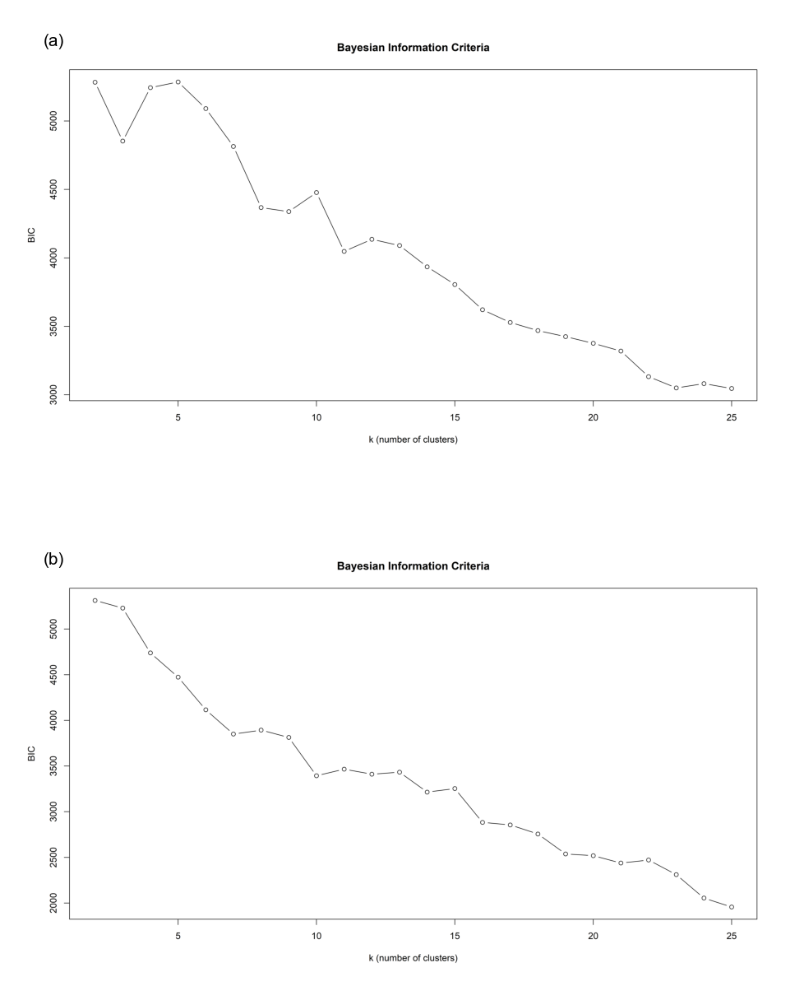

In [31]:
index_dir = '../../analysis_new_grids/{}_year_periods/fireSize_intersecting/plots_numClusters_grid{}/'.format(nyears, grid_id)

fig, axes = plt.subplots(2, 1, figsize = (5, 5))

for period, fig_label, axx in zip([1, 4], ['(a)', '(b)'], axes.flatten()): #range(1, 4+1):
    
    img_term = '_grid{}_period{}.png'.format(grid_id, period)

    img_fp = index_dir + 'BIC' + img_term

    image = plt.imread(img_fp)
    
    # Plotting
    # Adding figure label
    axx.text(x=0.025, y=0.95, s=fig_label, transform=axx.transAxes, fontsize=5)
    axx.imshow(image)
    axx.set_axis_off()
    
plt.savefig('../plots/BIC_period1_4.png', dpi=300, facecolor='white', transparent=False, bbox_inches="tight")
plt.savefig('../plots/BIC_period1_4.pdf', dpi=300, facecolor='white', transparent=False, bbox_inches="tight")
plt.show()

[0 1 2 3 4 6 7 8]


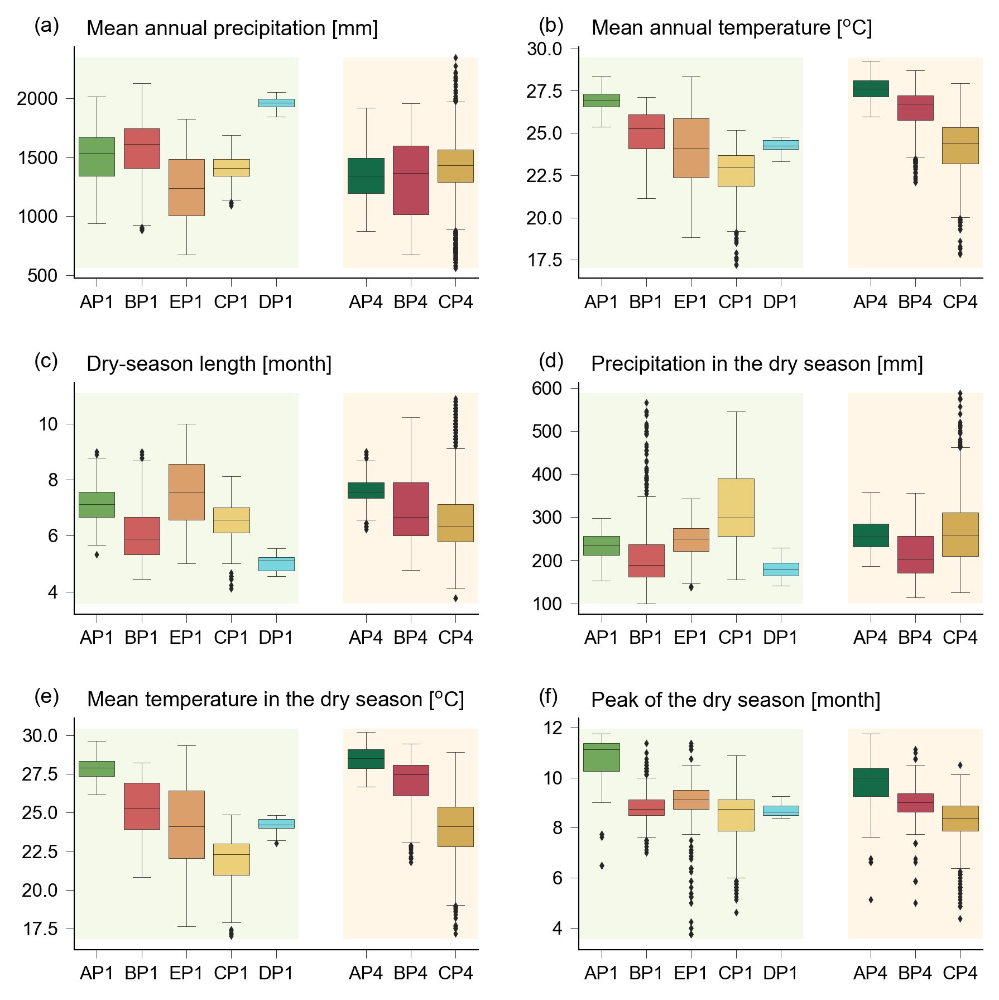

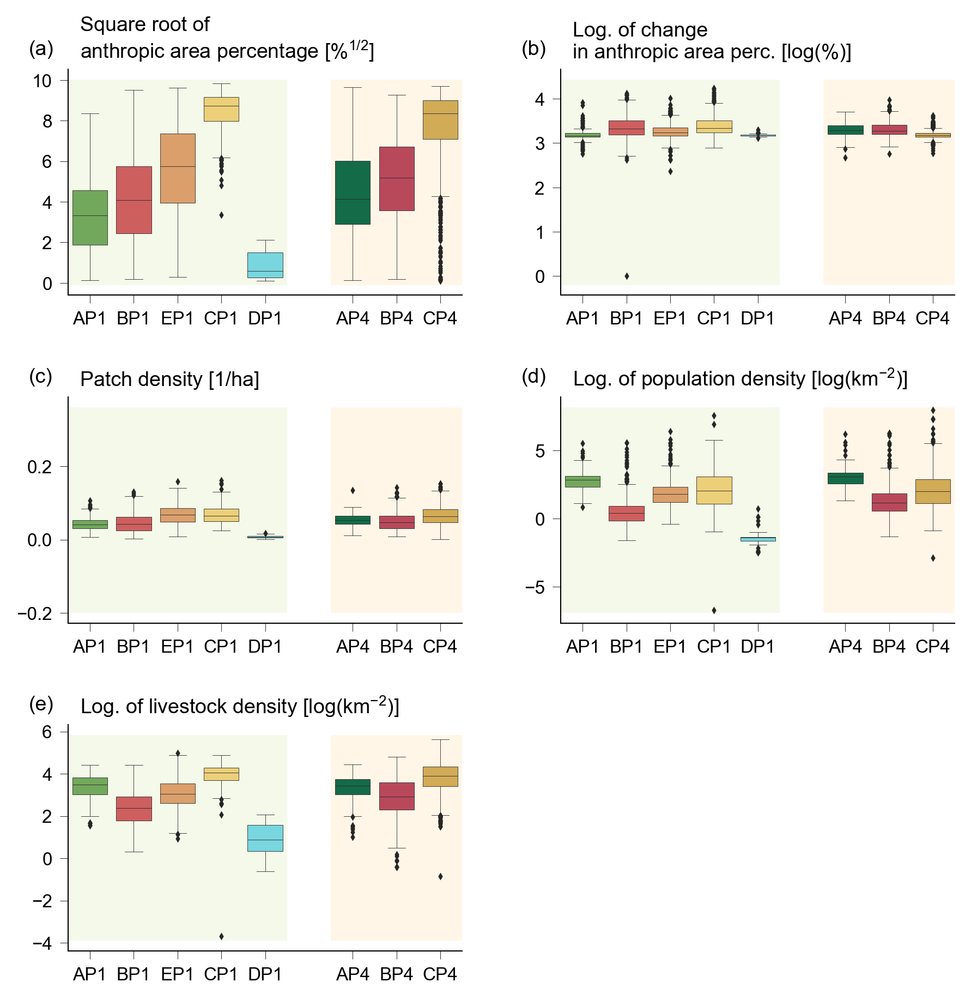

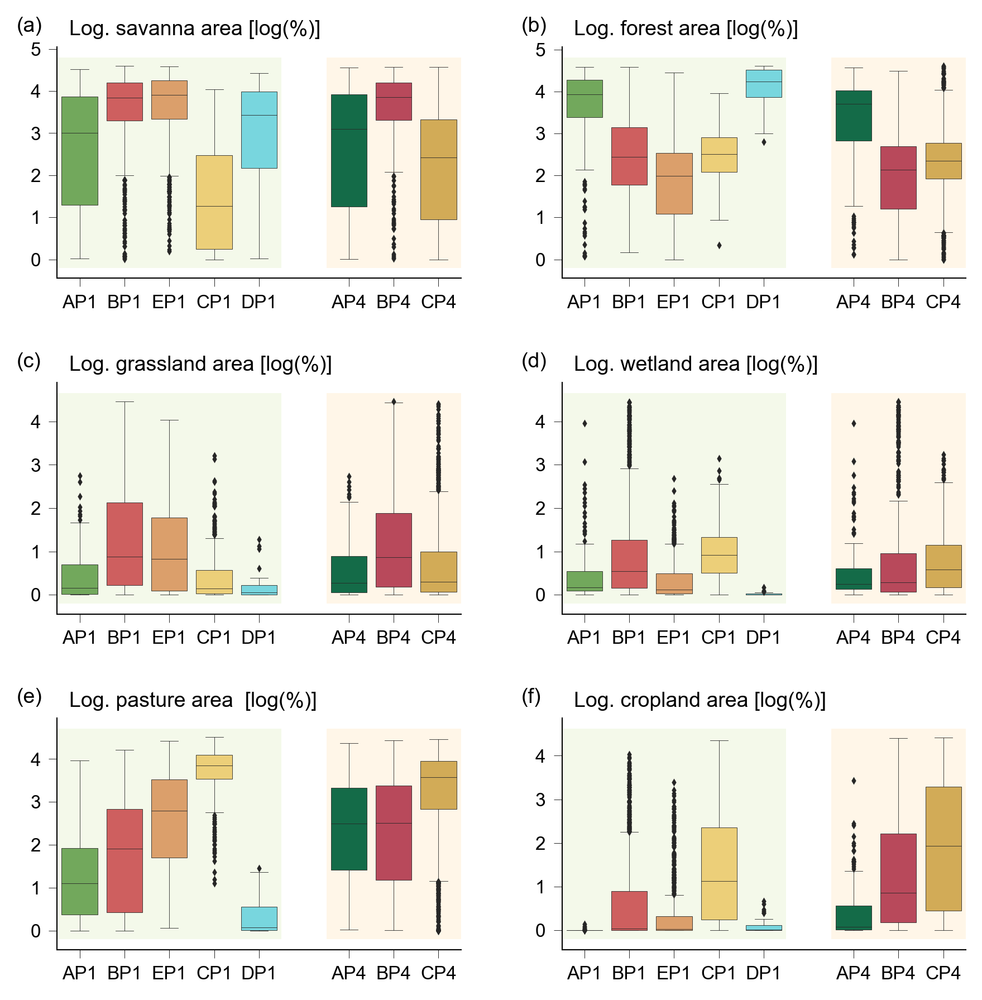

In [113]:
pal_p14_numeric = {
    5-1 : '#6db54f',
    2-1 : '#e04d4d',
    3-1 : '#ffd966', # '#6fa8dc',
    1-1 : '#67e4ef', # '#eeeeee',
    4-1 : '#ee9e58',
    5 : '#ee9e58',
    # 6 : '#ee9e58',
    # 7 : '#ee9e58',
    8 : '#06794b', # list_colors[0],
    7 : '#cb364e', # list_colors[1],
    6 : '#e7b242' # list_colors[2]}
}

fig_labels = ['(a)', '(b)', '(c)', '(d)', '(e)', '(f)']

subset1 = expvar[expvar['period'] == '(1985, 1993)'].reset_index(drop = True)
subset1 = data['p1'][['id', 'clust_alpha_{}'.format(kp1_1), 'clust_{}'.format(kp1_1)]].merge(subset1, on = 'id', how = 'inner')
subset1 = subset1.rename(columns = {'clust_alpha_{}'.format(kp1_1): 'clust_alpha_id', 'clust_{}'.format(kp1_1): 'clust_id'})
subset1['clust_id'] = subset1['clust_id'] - 1


subset2 = expvar[expvar['period'] == '(2012, 2020)'].reset_index(drop = True)
subset2 = data['p4'][['id', 'clust_alpha_{}'.format(kp4_1), 'clust_{}'.format(kp4_1)]].merge(subset2, on = 'id', how = 'inner')
subset2 = subset2.rename(columns = {'clust_alpha_{}'.format(kp4_1): 'clust_alpha_id', 'clust_{}'.format(kp4_1): 'clust_id'})
subset2['clust_id'] = subset2['clust_id'] + 5

subset = pd.concat([subset1, subset2], ignore_index = True)
print(subset['clust_id'].unique())



# Create figure per group of variables

for var_set, var_set_id, var_set_labels in zip([clim_vars,  anthropic_vars, veg_type_vars], ['climatic', 'anthropic', 'vegType'], [clim_labels, anthropic_labels, veg_type_labels]):

    fig = plt.figure(figsize = (7, 7))

    nrow = 3
    ncol = 2

    # Create the grid of figures
    gs = mpl.gridspec.GridSpec(nrow, ncol, wspace=0.25, hspace=0.45) # 2x5 grid

    # Creating the different boxplots
    b = 0
    for i in range(0, nrow):
        for j in range(0, ncol):
            if b < len(var_set):
                ax = fig.add_subplot(gs[i, j])

                # Shading areas depending on period
                ax.fill_between([-0.5, 4.5], min(subset[var_set[b]]) - 0.2, 
                                max(subset[var_set[b]]) + 0.2,
                                alpha=0.1, facecolor = 'yellowgreen',
                               zorder = 0)

                ax.fill_between([6-0.5, 8.5], min(subset[var_set[b]]) - 0.2, 
                                max(subset[var_set[b]]) + 0.2,
                                alpha=0.3, facecolor = 'moccasin',
                               zorder = 0)


                # Plotting boxplots
                sns.boxplot(data = subset, x = 'clust_id', y = var_set[b],
                            order = [4, 1, 3, 2, 0, 5, 8, 7, 6],
                            ax = ax,
                            palette = pal_p14_numeric,
                            linewidth = 0.2,
                            flierprops = {'markersize' : 1}
                           )

                # Setting axes to have no labels, and setting the labels of the ticks we want to show
                ax.set_xlabel('')
                ax.set_ylabel('')
                ax.tick_params(axis='both', which='major', labelsize=8, width = 0.2)
                ax.set_xticklabels(['AP1', 'BP1', 'EP1', 'CP1', 'DP1', '', 'AP4', 'BP4', 'CP4'])



                xticks = ax.xaxis.get_major_ticks()
                xticks[5].set_visible(False)

                ax.text(x=0.03, y=1.05, s=var_set_labels[b], transform=ax.transAxes, fontsize=9)
                ax.text(x=-0.1, y=1.065, s=fig_labels[b], transform=ax.transAxes, fontsize=9)



                # Change width of all spines of axis
                for axis in ['top','right']:
                    ax.spines[axis].set_linewidth(0.)
                for axis in ['bottom','left']:
                    ax.spines[axis].set_linewidth(0.5)

        # Change width of all spine
                b += 1


    plt.savefig('../plots/boxplot_expVars_{}_bothPeriods.png'.format(var_set_id), dpi=300, facecolor='white', transparent=False, bbox_inches="tight")
    plt.savefig('../plots/boxplot_expVars_{}_bothPeriods.pdf'.format(var_set_id), dpi=300, facecolor='white', transparent=False, bbox_inches="tight")
    plt.show()


In [121]:
# # Create figure of subplots

# t = 3

# for period, period_label, k, list_vars, list_labels, order_clusters, plot_type, fig_labels in zip([1]*t + [4]*t, ['(1985, 1993)']*t + ['(2012, 2020)']*t, [kp1_1]*t + [kp4_1]*t,
#                                                                                               [clim_vars,  anthropic_vars, veg_type_vars]*t, [clim_labels, anthropic_labels, veg_type_labels]*t, 
#                                                                                               [['AP1', 'BP1', 'EP1', 'CP1', 'DP1']] * t + [['AP4', 'BP4', 'CP4']] * t,
#                                                                                               ['climatic', 'anthropic', 'vegType']*t,
#                                                                                                  [['(a)', '(b)', '(c)', '(d)', '(e)','(f)']]*3*2):
    
#     fig = plt.figure(figsize = (10, 5))



#     # Create the grid of figures
#     gs = mpl.gridspec.GridSpec(2, 3, wspace=0.25, hspace=0.45) # 2x5 grid


#     # Create data subset to plot
#     toPlot = expvar.loc[expvar['period'] == period_label, ['id'] + list_vars].reset_index(drop = True).copy()
#     toPlot = reduce(lambda df1, df2: pd.merge(df1, df2, on='id'), [grid, data['p{}'.format(period)][['id','clust_{}'.format(k), 'clust_alpha_{}'.format(k)]], toPlot])
    
#     # Order according to preset order

#     # print(toPlot)
#     # toPlot = data[['id', 'geometry', 'clust_{}'.format(k)] + list_vars].copy()


#     # Creating the different boxplots
#     b = 0
#     for i in range(0, 2):
#         for j in range(0, 3):
#             if b < len(list_vars):
#                 ax = fig.add_subplot(gs[i, j])

#                 sns.violinplot(data = toPlot, x = 'clust_alpha_{}'.format(k), y = list_vars[b], 
#                                order = order_clusters,
#                                ax = ax,
#                                palette = pal_p14['p{}'.format(period)], # [pal_p14['p{}'.format(period)][e] for e in toPlot['clust_alpha_{}'.format(k)].unique()],# pal_p14['p{}'.format(period)],
#                                linewidth = 0.2,
#                                scale = 'width') 

#                 ax.set_xlabel('')
#                 ax.set_ylabel('')
#                 ax.tick_params(axis='both', which='major', labelsize=8, width = 0.2)
#                 # print(fig_labels[b])
#                 ax.text(x=0.03, y=1.065, s=list_labels[b], transform=ax.transAxes, fontsize=9)
#                 ax.text(x=-0.1, y=1.065, s=fig_labels[b], transform=ax.transAxes, fontsize=9)

#                 # Change width of all spines of axis
#                 for axis in ['top','right']:
#                     ax.spines[axis].set_linewidth(0.)
#                 for axis in ['bottom','left']:
#                     ax.spines[axis].set_linewidth(0.5)

#     # Change width of all spine
#                 b += 1
        
#     plt.savefig('../plots/boxplot_expVars_{}_period{}.png'.format(plot_type, period), dpi=300, facecolor='white', transparent=False, bbox_inches="tight")
#     plt.savefig('../plots/boxplot_expVars_{}_period{}.pdf'.format(plot_type, period), dpi=300, facecolor='white', transparent=False, bbox_inches="tight")

#     plt.show()

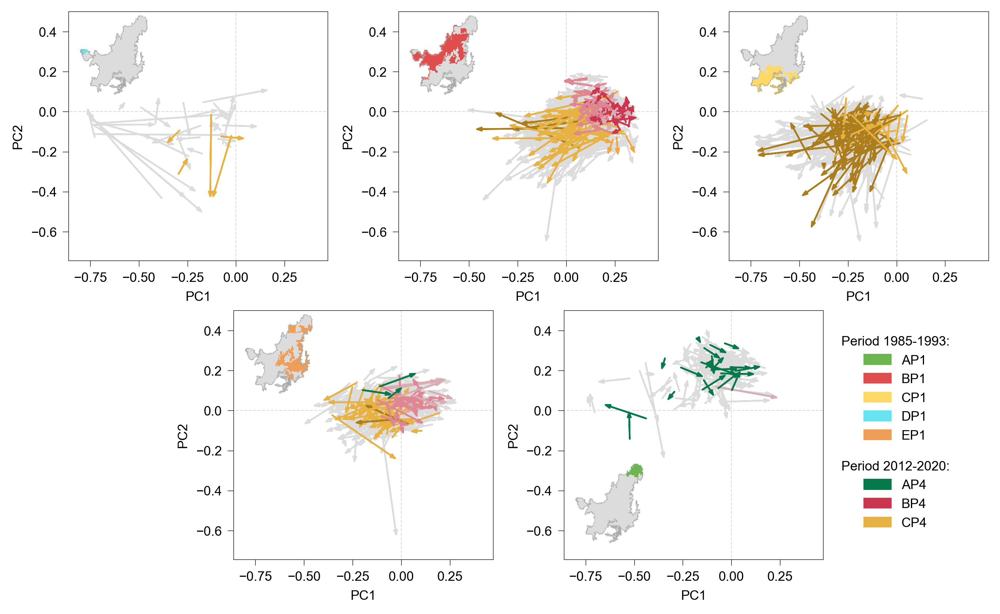

In [54]:
fig = plt.figure(figsize = (10, 6.))
gs = mpl.gridspec.GridSpec(4, 6, wspace=0.75, hspace=0.5)

grid_indicator = [[(0,2), (0,2)], [(0,2), (2,4)], [(0,2), (4,6)], [(2,4), (1,3)], [(2,4), (3,5)]]

num_select = [int(0.15 * len(data['p1'][data['p1']['clust_{}'.format(kp1_1)] == cl_id])) for cl_id in range(1, kp1_1 + 1)]


for h, indicator in zip(range(kp1_1), grid_indicator):
    
    cl_id = h + 1
    
    x1, x2 = indicator[0]
    y1, y2 = indicator[1]
    
    axes = fig.add_subplot(gs[x1:x2, y1:y2])
    
    clust_p1 = data['p1'][data['p1']['clust_{}'.format(kp1_1)] == cl_id].reset_index(drop = True) 
    clust_p4 = pcaproj_p4[pcaproj_p4['clust_{}'.format(kp1_1)] == cl_id].reset_index(drop = True) 
    
    n_total = num_select[h]
    unique_counts = clust_p4.groupby('clust_{}'.format(kp4_1))['id'].agg('nunique')
    nums_selected= np.floor(unique_counts / unique_counts.sum() * n_total).astype(int)  # rounded down

    selection = clust_p4.groupby('clust_{}'.format(kp4_1), group_keys = False).apply(
        lambda x: x.sample(n = nums_selected[x.name], #num_select[h]
                           replace = False))
    selection = selection.index.tolist()

    axes.axvline(0, -1, 1, linestyle = '--', linewidth = 0.5, color = 'gainsboro')
    axes.axhline(0, -1, 1, linestyle = '--', linewidth = 0.5, color = 'gainsboro')
    
    axes.set_xlim(pc1_min - 0.1, pc1_max + 0.1)
    axes.set_ylim(pc2_min - 0.1, pc2_max + 0.1)
    
    axes.set_xlabel('PC1', fontsize = 8)
    axes.set_ylabel('PC2', fontsize = 8)
    
    axes.tick_params(axis='both', 
                    which='both',
                    bottom=True,
                    left = True,
                    labelbottom=True, labelleft = True,
                    width = 0.3,
                    labelsize = 8)
    
    # Change width of all spines of axis
    for axis in ['top','bottom','left','right']:
        axes.spines[axis].set_linewidth(0.3)

    for i in clust_p4[~clust_p4.index.isin(selection)].index:#range(len(clust_p1['PC1'])):
        basex = clust_p1.loc[i, 'PC1'].item()
        basey = clust_p1.loc[i, 'PC2'].item()

        dx = clust_p4.loc[i, 'PC1'].item()# - basex
        dy = clust_p4.loc[i, 'PC2'].item()# - basey

        c = 'gainsboro' #clust_p4.loc[i, 'colors']

        axes.annotate('', xy = (dx, dy),
                      xytext = (basex, basey),
                      arrowprops = {'edgecolor' : c, 'facecolor':c, 'width' : 0.0001, 'headwidth':2, 'headlength':3})


    for i in selection:#range(len(clust_p1['PC1'])):
        basex = clust_p1.loc[i, 'PC1'].item()
        basey = clust_p1.loc[i, 'PC2'].item()

        dx = clust_p4.loc[i, 'PC1'].item()# - basex
        dy = clust_p4.loc[i, 'PC2'].item()# - basey

        c = clust_p4.loc[i, 'colors_{}'.format(kp4_2)]
        axes.annotate('', xy = (dx, dy),
                      xytext = (basex, basey),
                      arrowprops = {'edgecolor' : c, 'facecolor':c, 'width' : 0.0001, 'headwidth':2, 'headlength':3})

    # Create inset legend manually
    if cl_id < kp1_1:
        # Where to put the box and its shape
        ax = axes.inset_axes([0.,0.65,0.35,0.35])   
    elif cl_id == kp1_1:
        ax = axes.inset_axes([0.,0.05,0.35,0.35]) 
    ax.set_aspect('equal', adjustable = 'box')

    # Create temporary column with colors
    data['p1']['map_col'] = 'gainsboro'
    data['p1'].loc[data['p1']['clust_{}'.format(kp1_1)] == cl_id, 'map_col'] = data['p1'].loc[data['p1']['clust_{}'.format(kp1_1)] == cl_id, 'colors_{}'.format(kp1_1)]
    data['p1'].plot(ax = ax, color = data['p1']['map_col'])
    
    cerrado = gpd.read_file('../../data/shapes/cerrado_1-250000.shp')
    cerrado = cerrado.to_crs(toPlot.crs)
    cerrado.boundary.plot(ax = ax, linewidth=0.2, edgecolor = 'darkgrey')

    ax.set_axis_off()
    
# Create legend manually
patches_p1 = [Patch(color = c, label = l) for c, l in zip(pal_p14['p1'].values(), pal_p14['p1'].keys())]
patches_p4 = [Patch(color = c, label = l) for c, l in zip(pal_p14['p4'].values(), pal_p14['p4'].keys())]
legend_p1 = plt.legend(handles = patches_p1, title ='Period 1985-1993:', loc = (1.05, 0.45), fontsize = 8, title_fontsize = 8, frameon = False)
plt.legend(handles = patches_p4, title ='Period 2012-2020:', loc = (1.05, .1), fontsize = 8, title_fontsize = 8, frameon = False)
plt.gca().add_artist(legend_p1)

# Exploring the PCA change for the explanatory variables

In [23]:
# Reading the PCA scores for the first period, and the projection of period 4 on period 1
# Reading projection of data for period 4 into PCA for period 1

pca_id_list = ['anthropic01', 'climatic01', 'anthClim01', 'anthropic03', 'climatic03']

pca_p1_expVars = dict()
pca_p4_expVars = dict()
pcaproj_p4_expVars = dict()

pca_expVars_dir = '../../analysis_new_grids/{}_year_periods/fireSize_intersecting/pca_envVars_output/'.format(nyears)

for pca_id in pca_id_list:
    # Period 1 PCA scores
    pca_p1_expVars[pca_id] = pd.read_csv(pca_expVars_dir + 'PCAscores_scaling1_sites_envVars_period1_{}_grid{}.csv'.format(pca_id, grid_id))
    # Period 4 PCA scores
    pca_p4_expVars[pca_id] = pd.read_csv(pca_expVars_dir + 'PCAscores_scaling1_sites_envVars_period4_{}_grid{}.csv'.format(pca_id, grid_id))
    # Projection of period 4 data onto period 1 PCA space
    pcaproj_p4_expVars[pca_id] = pd.read_csv(pca_expVars_dir + 'PCAscores_p4projOnp1_sites_expVars_{}_grid{}.csv'.format(pca_id, grid_id))
    

    # Merging classification of first and last period
    pca_p1_expVars[pca_id] = pca_p1_expVars[pca_id].merge(data['p1'][['id', 'clust_{}'.format(kp1_1), 'colors_{}'.format(kp1_1), 'clust_{}'.format(kp1_2), 'colors_{}'.format(kp1_2)]], on = 'id')
    pca_p1_expVars[pca_id] = pca_p1_expVars[pca_id].merge(data['p4'][['id', 'clust_{}'.format(kp4_1), 'colors_{}'.format(kp4_1), 'clust_{}'.format(kp4_2), 'colors_{}'.format(kp4_2)]], on = 'id')
    
    # Merging classification of first and last period
    pca_p4_expVars[pca_id] = pca_p4_expVars[pca_id].merge(data['p1'][['id', 'clust_{}'.format(kp1_1), 'colors_{}'.format(kp1_1), 'clust_{}'.format(kp1_2), 'colors_{}'.format(kp1_2)]], on = 'id')
    pca_p4_expVars[pca_id] = pca_p4_expVars[pca_id].merge(data['p4'][['id', 'clust_{}'.format(kp4_1), 'colors_{}'.format(kp4_1), 'clust_{}'.format(kp4_2), 'colors_{}'.format(kp4_2)]], on = 'id')
    
    pcaproj_p4_expVars[pca_id] = pcaproj_p4_expVars[pca_id].merge(data['p1'][['id', 'clust_{}'.format(kp1_1), 'colors_{}'.format(kp1_1), 'clust_{}'.format(kp1_2), 'colors_{}'.format(kp1_2)]], on = 'id')
    pcaproj_p4_expVars[pca_id] = pcaproj_p4_expVars[pca_id].merge(data['p4'][['id', 'clust_{}'.format(kp4_1), 'colors_{}'.format(kp4_1), 'clust_{}'.format(kp4_2), 'colors_{}'.format(kp4_2)]], on = 'id')

    pcaproj_p4_expVars[pca_id] = grid.merge(pcaproj_p4_expVars[pca_id], on = 'id', how = 'outer')

In [24]:
def pca_plot(pca_toPlot, pca_comp_toPlot, pca_exp_toPlot_x, pca_exp_toPlot_y, period, axx, xlim, ylim, k, fig_label, inv_x = False):
    
    # Setting the limits of the axis manually
    axx.set_xlim(xlim)
    axx.set_ylim(ylim)
    
    # Adding vertical and horizontal lines
    axx.axvline(0, -1, 1, linestyle = '--', linewidth = 0.5, color = 'gainsboro')
    axx.axhline(0, -1, 1, linestyle = '--', linewidth = 0.5, color = 'gainsboro')
    
    if inv_x == True:
        pca1 = -1
        # pca_toPlot['PC1'] = (-1)*pca_toPlot['PC1']
        # pca_comp_toPlot['PC1'] = (-1)*pca_comp_toPlot['PC1']
    else:
        pca1 = 1
    
    # The data points
    _plot = sns.scatterplot(x = pca1 * pca_toPlot['PC1'],
                            y = pca_toPlot['PC2'],
                            hue = pca_toPlot['clust_alpha_{}'.format(k)], 
                            ax = axx, s = 1.5, edgecolor = 'none', legend = None, palette = pal_p14['p{}'.format(period)])

    pca_exp_x = np.round(pca_exp_toPlot_x, decimals = 2)
    pca_exp_y = np.round(pca_exp_toPlot_y - pca_exp_x, decimals = 2)
    
    axx.set_xlabel('PC1 ({} %)'.format(pca_exp_x), fontsize = 8, labelpad = 1)
    axx.set_ylabel('PC2 ({} %)'.format(pca_exp_y), fontsize = 8, labelpad = 1)
    
    # Adding figure label
    axx.text(x=-0.1, y=1.05, s=fig_label, transform=axx.transAxes, fontsize=8)
    
    
    # Changing width of plot lines
    axx.tick_params(axis='both', which='major', labelsize=7, width = 0.2)
    # Change width of all spines of axis
    for axis in ['top','bottom','left','right']:
        axx.spines[axis].set_linewidth(0.2)
        
    # Adding the arrows
    # if period != 1:
    #     pca_comp_toPlot['PC1'] = (-1)* pca_comp_toPlot['PC1']
    for c in range(len(pca_comp_toPlot)):
        sc = 16
        # axx.arrow(0, 0, comp.loc[c,'PC1']/sc, comp.loc[c, 'PC2']/sc, color = 'r', width = 0.0001)
        axx.annotate('', xy = (0, 0),# xycoords = 'data',
                  xytext = (pca1 * pca_comp_toPlot.loc[c,'PC1']/sc, pca_comp_toPlot.loc[c, 'PC2']/sc),# textcoords = 'data',
                  arrowprops = {'arrowstyle':'<-','edgecolor' : 'black', 'facecolor': 'black'})

        axx.text(pca1 * pca_comp_toPlot.loc[c,'PC1']*1.05/sc, pca_comp_toPlot.loc[c, 'PC2']*1.05/sc, 
                        pca_comp_toPlot.loc[c, 'id_label'], fontsize = 8, color = 'black', ha = 'center', va = 'center')

In [25]:
def rda_plot(rda_toPlot_, rda_expPower_toPlot_, rda_comp_toPlot_, rda_coeff_toPlot_, rda_r2adj_toPlot, period, k, axes, xlim, ylim, fig_label, inv_x = False):
    
    rda_toPlot = rda_toPlot_.copy()
    rda_expPower_toPlot = rda_expPower_toPlot_.copy()
    rda_comp_toPlot = rda_comp_toPlot_.copy()
    rda_coeff_toPlot = rda_coeff_toPlot_.copy()
    
    # ----------------------------------------------------------------------------------------------------------------------
    # RDA
    
    # # # Setting the limits of the axis manually
    axes.set_xlim(xlim)
    axes.set_ylim(ylim)
    
    # Adding vertical and horizontal lines
    axes.axvline(0, -1, 1, linestyle = '--', linewidth = 0.5, color = 'gainsboro')
    axes.axhline(0, -1, 1, linestyle = '--', linewidth = 0.5, color = 'gainsboro')
    
    if inv_x == True:
        rda_toPlot['RDA1'] = (-1)*rda_toPlot['RDA1']
        
    
    # The data points
    _plot = sns.scatterplot(x = rda_toPlot['RDA1'],
                            y = rda_toPlot['RDA2'],
                            hue = rda_toPlot['clust_alpha_{}'.format(k)], 
                            ax = axes, s = 1.5, edgecolor = 'none', legend = None, palette = pal_p14['p{}'.format(period)])

    rda_exp_x = np.round(100 * rda_expPower_toPlot.loc[1, 'RDA1'].item(), decimals = 2)
    rda_exp_y = np.round(100 * rda_expPower_toPlot.loc[1, 'RDA2'].item(), decimals = 2)
    
    axes.set_xlabel('RDA1 ({} %)'.format(rda_exp_x), fontsize = 8, labelpad = 1)
    axes.set_ylabel('RDA2 ({} %)'.format(rda_exp_y), fontsize = 8, labelpad = 1)
    
    
    # Adding figure label
    axes.text(x=-0.1, y=1.05, s=fig_label, transform=axes.transAxes, fontsize=8)
    
    
    # Changing width of plot lines
    axes.tick_params(axis='both', which='major', labelsize=7, width = 0.2)
    # Change width of all spines of axis
    for axis in ['top','bottom','left','right']:
        axes.spines[axis].set_linewidth(0.2)
        
    sc = 2
    # Adding the fire variable components
    comp = rda_comp_toPlot.copy()
    
#     # if i != 0:
#     comp['RDA2'] = (-1) * comp['RDA2'] 
        
    if inv_x == True:
        comp['RDA1'] = (-1)*comp['RDA1']
        
    for c in range(len(comp)):
        axes.annotate('', xy = (0, 0),# xycoords = 'data',
                  xytext = (comp.loc[c,'RDA1']/sc, comp.loc[c, 'RDA2']/sc),# textcoords = 'data',
                  arrowprops = {'arrowstyle':'<-','edgecolor' : 'black', 'facecolor': 'black', 'alpha':1})

        axes.text(comp.loc[c,'RDA1']*1.05/sc, comp.loc[c, 'RDA2']*1.05/sc, comp.loc[c, 'fire_label'], fontsize = 7, color = 'black', ha = 'center', va = 'center')
        
        
    # Adding the explanatory variables coefficients
    sc = 0.75
    comp = rda_coeff_toPlot.copy()
    
    if inv_x == True:
        comp['RDA1'] = (-1)*comp['RDA1']
    
#     # if i != 0:
#     comp['RDA2'] = (-1) * comp['RDA2'] 
        
#     if (i == 2) | (i == 0):
#         comp['RDA1'] = (-1) * comp['RDA1'] 
        
    for c in range(len(comp)):
        compx = comp.loc[c,'RDA1']
        compy = comp.loc[c, 'RDA2']
        n = np.sqrt(compx**2 + compy**2)
        axes.annotate('', xy = (0, 0),# xycoords = 'data',
                  xytext = (compx/sc, compy/sc),# textcoords = 'data',
                  arrowprops = {'arrowstyle':'<-','edgecolor' : 'blue', 'facecolor': 'blue', 'alpha':1.})

        axes.text(compx*1.1/sc, compy*1.1/sc, comp.loc[c, 'id_label'], fontsize = 7, color = 'b', ha = 'center', va = 'center')
        
    # Adding the adjusted r2
    axes.text(0.73, 0.935, 'r$_\mathregular{adj}^\mathregular{2}$ = ' + '{}'.format(np.round(rda_r2adj_toPlot, decimals = 3)), transform=axes.transAxes, 
              fontsize = 8, color = 'black')
    

In [26]:
pca_comp_labels

['Log. median fire size',
 'Log. 99th fire size',
 'Log. burned area',
 'Log. number fires',
 'Log. 99th frequency',
 'Peak fire season']

In [27]:
# Reading data for each period
grid = gpd.read_file('../../data/shapes/cerrado_grid_{}_cropped.shp'.format(grid_id))[['id','geometry']]

expVars_pca = dict()
expVars_pca_comp = dict()
expVars_pca_exp = dict()

expVars_comp_labels = {'anthropic01': ['Log. population density', 'Log. livestock density', 'Sqrt anthropic area', 'Log. change anthropic area', 'Patch density'],
                       'climatic01': ['Precipitation', 'Temperature', 'Dry-season prec.', 'Peak of dry-season'],
                      'anthropic03': ['Log. population density', 'Log. livestock density', 'Sqrt anthropic area', 'Log. change anthropic area'],
                      'climatic03': ['Precipitation', 'Dry-season temp.', 'Dry-season prec.', 'Peak of dry-season']}

for period, klist, comb_id in zip([1, 4]*2, [[kp1_1, kp1_2], [kp4_1, kp4_2]]*2, ['anthropic03']*2 + ['climatic03']*2):
    # Classification solutions for each k
    class_k = pd.read_csv('../../analysis_new_grids/{}_year_periods/fireSize_intersecting/constClusteringClass_ksolutions_grid{}_period{}.csv'.format(nyears, grid_id, period))
    # Keeping only relevant columns
    class_k = class_k[['id'] + ['clust_{}'.format(k) for k in klist]]

    # PCA scores for period
    pca_dir = '../../analysis_new_grids/{}_year_periods/fireSize_intersecting/pca_envVars_output/'.format(nyears)
    scores = pd.read_csv(pca_dir + 'PCAscores_scaling1_sites_envVars_period{}_{}_grid{}.csv'.format(period, comb_id, grid_id))
    expVars_pca_comp['p{}_{}'.format(period, comb_id)] = pd.read_csv(pca_dir + 'PCAscores_scaling1_species_envVars_period{}_{}_grid{}.csv'.format(period, comb_id, grid_id))
    
    # Add column with labels
    expVars_pca_comp['p{}_{}'.format(period, comb_id)]['id_label'] = expVars_comp_labels[comb_id]

    # Merging all data
    expVars_pca['p{}_{}'.format(period, comb_id)] = reduce(lambda df1, df2: pd.merge(df1, df2, on='id'), [grid, class_k, scores])
    
    # # Adding alphabetical and color-code information per solution k
    # for k in klist:
    # # Create alphanumeric relation to relate the numeric identifier to a letter
    # alphanumeric_relation = dict(zip(range(1, k+1), [chr(x) for x in range(65, 65 + k)]))
    k = klist[0]
    # Casting as column
    expVars_pca['p{}_{}'.format(period, comb_id)]['clust_alpha_{}'.format(k)] = [alpha_id['p{}'.format(period)][v] for v in expVars_pca['p{}_{}'.format(period, comb_id)]['clust_{}'.format(k)]] 
    # print(expVars_pca)
    # Adding colour-code information as column
    expVars_pca['p{}_{}'.format(period, comb_id)]['colors_{}'.format(k)] = [pal_p14['p{}'.format(period)][v] for v in expVars_pca['p{}_{}'.format(period, comb_id)]['clust_alpha_{}'.format(k)]]
    

    k = klist[1]
    # Adding colour-code information as column
    expVars_pca['p{}_{}'.format(period, comb_id)]['colors_{}'.format(k)] = [pal_p14_2['p{}'.format(period)][v] for v in expVars_pca['p{}_{}'.format(period, comb_id)]['clust_{}'.format(k)]]
        

    # Reading the explanaotry power of the PCA axes
    expVars_pca_exp['p{}_{}'.format(period, comb_id)] = pd.read_csv('../../analysis_new_grids/{}_year_periods/fireSize_intersecting/pca_envVars_output/PCAexpPower_scaling1_sites_envVars_period{}_{}_grid{}.csv'.format(nyears, period, comb_id, grid_id))

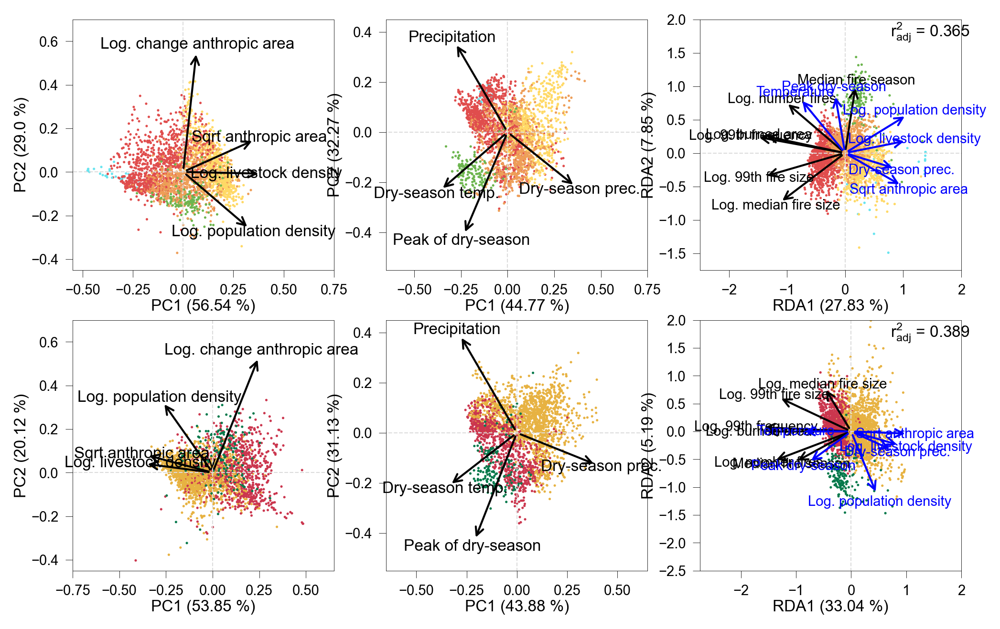

In [56]:
fig, axes = plt.subplots(2, 3, figsize = (8, 5))

pca_plot(expVars_pca['p1_anthropic03'], expVars_pca_comp['p1_anthropic03'], 
         expVars_pca_exp['p1_anthropic03'].loc[0, 'PC1'].item(), 
         expVars_pca_exp['p1_anthropic03'].loc[0, 'PC2'].item(), 1, axes[0][0], 
         (-0.55, 0.75), (-0.45, 0.7), 5, '')

pca_plot(expVars_pca['p1_climatic03'], expVars_pca_comp['p1_climatic03'], 
         expVars_pca_exp['p1_climatic03'].loc[0, 'PC1'].item(), 
         expVars_pca_exp['p1_climatic03'].loc[0, 'PC2'].item(), 1, axes[0][1], 
         (-0.65, 0.75), (-0.55, 0.45), 5, '')

pca_plot(expVars_pca['p4_anthropic03'], expVars_pca_comp['p4_anthropic03'], 
         expVars_pca_exp['p4_anthropic03'].loc[0, 'PC1'].item(), 
         expVars_pca_exp['p4_anthropic03'].loc[0, 'PC2'].item(), 4, axes[1][0], 
         (-0.75, 0.65), (-0.45, 0.7), 3, '')

pca_plot(expVars_pca['p4_climatic03'], expVars_pca_comp['p4_climatic03'], 
         expVars_pca_exp['p4_climatic03'].loc[0, 'PC1'].item(), 
         expVars_pca_exp['p4_climatic03'].loc[0, 'PC2'].item(), 4, axes[1][1], 
         (-0.65, 0.65), (-0.55, 0.45), 3, '')

rda_plot(rda_data['p1_anthClim01'], 
         rda_expPower['p1_anthClim01'], rda_comp['p1_anthClim01'], 
         rda_coeff['p1_anthClim01'], 
         rda_r2adj['p1_anthClim01'], 
         1, 5, axes[0][2],
        (-2.5, 2), (-1.75, 2), '')

rda_plot(rda_data['p4_anthClim01'], 
         rda_expPower['p4_anthClim01'], rda_comp['p4_anthClim01'], 
         rda_coeff['p4_anthClim01'], 
         rda_r2adj['p4_anthClim01'], 
         4, 3, axes[1][2],
        (-2.75, 2), (-2.5, 2), '')

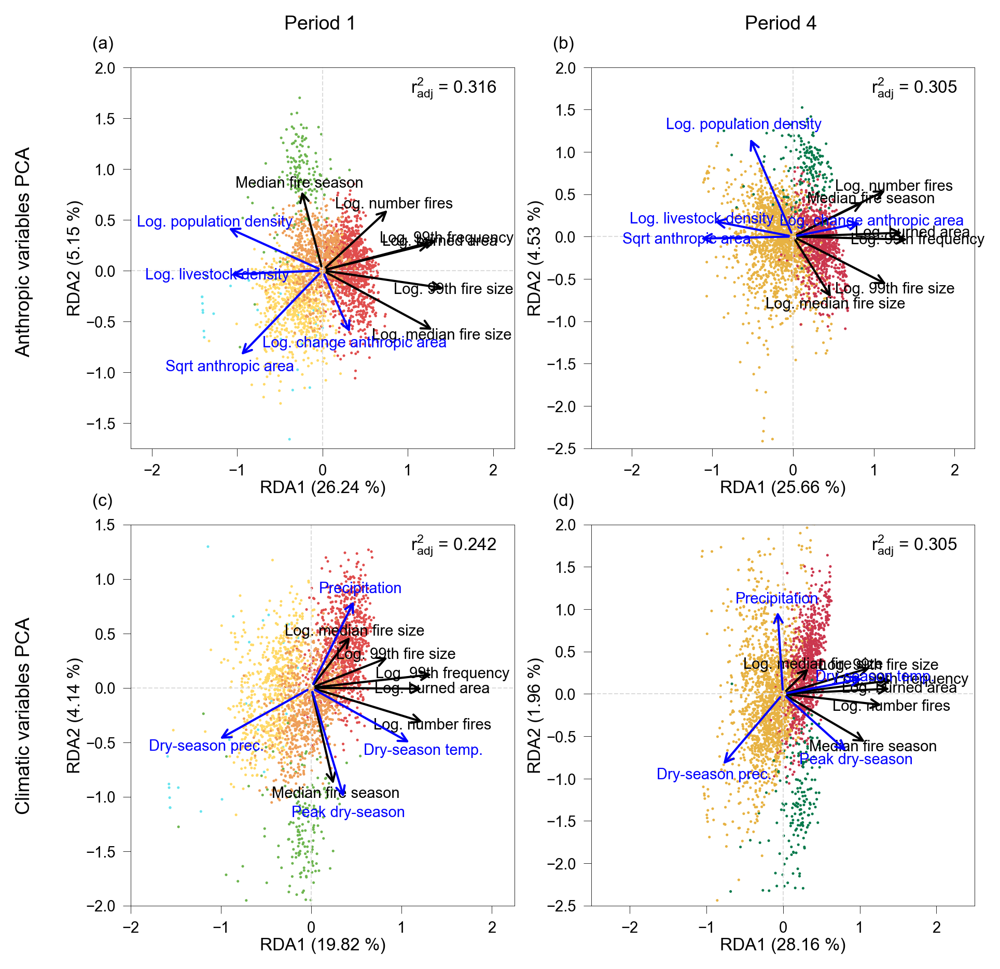

In [205]:
fig, axes = plt.subplots(2, 2, figsize = (7, 7))

rda_plot(rda_data['p1_anthropic03'], 
         rda_expPower['p1_anthropic03'], rda_comp['p1_anthropic03'], 
         rda_coeff['p1_anthropic03'], 
         rda_r2adj['p1_anthropic03'], 
         1, 5, axes[0][0],
        (-2.25, 2.25), (-1.75, 2), '(a)', inv_x = False)

rda_plot(rda_data['p1_climatic03'], 
         rda_expPower['p1_climatic03'], rda_comp['p1_climatic03'], 
         rda_coeff['p1_climatic03'], 
         rda_r2adj['p1_climatic03'], 
         1, 5, axes[1][0],
        (-2., 2.25), (-2., 1.5), '(c)')

rda_plot(rda_data['p4_anthropic03'], 
         rda_expPower['p4_anthropic03'], rda_comp['p4_anthropic03'], 
         rda_coeff['p4_anthropic03'], 
         rda_r2adj['p4_anthropic03'], 
         4, 3, axes[0][1],
        (-2.5, 2.25), (-2.5, 2), '(b)', inv_x = True)

rda_plot(rda_data['p4_climatic03'], 
         rda_expPower['p4_climatic03'], rda_comp['p4_climatic03'], 
         rda_coeff['p4_climatic03'], 
         rda_r2adj['p4_climatic03'], 
         4, 3, axes[1][1],
        (-2.5, 2.5), (-2.5, 2), '(d)')

axes[0][0].text(x = 0.4, y = 1.1, s = 'Period 1', transform=axes[0][0].transAxes, fontsize=9)
axes[0][1].text(x = 0.4, y = 1.1, s = 'Period 4', transform=axes[0][1].transAxes, fontsize=9)

axes[0][0].text(x = -0.3, y = 0.25, s = 'Anthropic variables PCA', transform=axes[0][0].transAxes, fontsize=9, rotation = 90)
axes[1][0].text(x = -0.3, y = 0.25, s = 'Climatic variables PCA', transform=axes[1][0].transAxes, fontsize=9, rotation = 90)

plt.savefig('../plots/map_RDA_periods1_4_varsSubsetRF.png', dpi=300, facecolor='white', transparent=False, bbox_inches="tight")
plt.savefig('../plots/map_RDA_periods1_4_varsSubsetRF.pdf', dpi=300, facecolor='white', transparent=False, bbox_inches="tight")
plt.show()

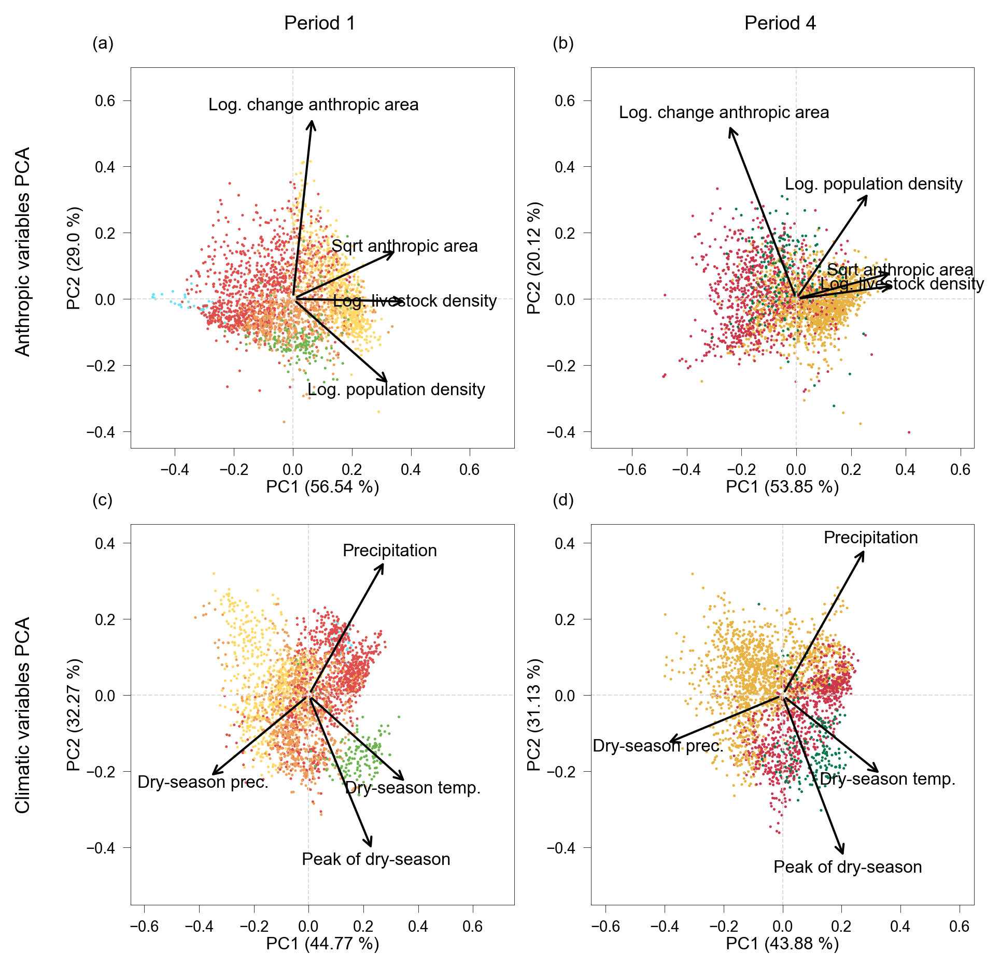

In [137]:
fig, axes = plt.subplots(2, 2, figsize = (7, 7))

pca_plot(expVars_pca['p1_anthropic03'], expVars_pca_comp['p1_anthropic03'], 
         expVars_pca_exp['p1_anthropic03'].loc[0, 'PC1'].item(), 
         expVars_pca_exp['p1_anthropic03'].loc[0, 'PC2'].item(), 1, axes[0][0], 
         (-0.55, 0.75), (-0.45, 0.7), 5, '(a)',
        inv_x = False)

pca_plot(expVars_pca['p1_climatic03'], expVars_pca_comp['p1_climatic03'], 
         expVars_pca_exp['p1_climatic03'].loc[0, 'PC1'].item(), 
         expVars_pca_exp['p1_climatic03'].loc[0, 'PC2'].item(), 1, axes[1][0], 
         (-0.65, 0.75), (-0.55, 0.45), 5, '(c)',
        inv_x = True)

pca_plot(expVars_pca['p4_anthropic03'], expVars_pca_comp['p4_anthropic03'], 
         expVars_pca_exp['p4_anthropic03'].loc[0, 'PC1'].item(), 
         expVars_pca_exp['p4_anthropic03'].loc[0, 'PC2'].item(), 4, axes[0][1], 
         (-0.75, 0.65), (-0.45, 0.7), 3, '(b)',
        inv_x = True)

pca_plot(expVars_pca['p4_climatic03'], expVars_pca_comp['p4_climatic03'], 
         expVars_pca_exp['p4_climatic03'].loc[0, 'PC1'].item(), 
         expVars_pca_exp['p4_climatic03'].loc[0, 'PC2'].item(), 4, axes[1][1], 
         (-0.65, 0.65), (-0.55, 0.45), 3, '(d)',
        inv_x = True)

axes[0][0].text(x = 0.4, y = 1.1, s = 'Period 1', transform=axes[0][0].transAxes, fontsize=9)
axes[0][1].text(x = 0.4, y = 1.1, s = 'Period 4', transform=axes[0][1].transAxes, fontsize=9)

axes[0][0].text(x = -0.3, y = 0.25, s = 'Anthropic variables PCA', transform=axes[0][0].transAxes, fontsize=9, rotation = 90)
axes[1][0].text(x = -0.3, y = 0.25, s = 'Climatic variables PCA', transform=axes[1][0].transAxes, fontsize=9, rotation = 90)

plt.savefig('../plots/map_PCA_expVars_periods1_4_varsSubsetRF.png', dpi=300, facecolor='white', transparent=False, bbox_inches="tight")
plt.savefig('../plots/map_PCA_expVars_periods1_4_varsSubsetRF.pdf', dpi=300, facecolor='white', transparent=False, bbox_inches="tight")
plt.show()

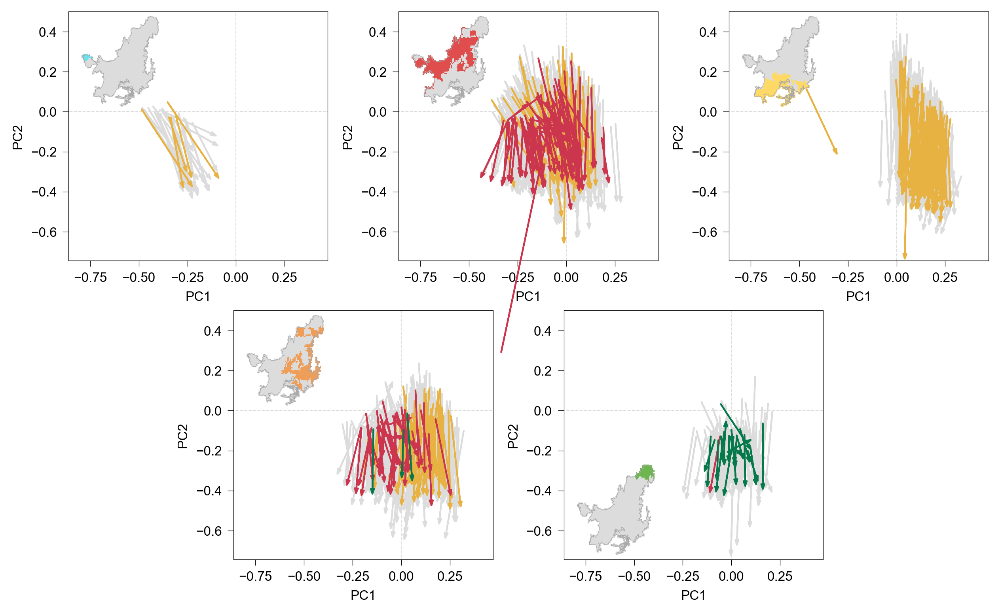

In [21]:
fig = plt.figure(figsize = (10, 6.))
gs = mpl.gridspec.GridSpec(4, 6, wspace=0.75, hspace=0.5)

grid_indicator = [[(0,2), (0,2)], [(0,2), (2,4)], [(0,2), (4,6)], [(2,4), (1,3)], [(2,4), (3,5)]]

num_select = [int(0.15 * len(data['p1'][data['p1']['clust_{}'.format(kp1_1)] == cl_id])) for cl_id in range(1, kp1_1 + 1)]

pca_id = 'anthropic01'


for h, indicator in zip(range(kp1_1), grid_indicator):
    
    cl_id = h + 1
    
    x1, x2 = indicator[0]
    y1, y2 = indicator[1]
    
    axes = fig.add_subplot(gs[x1:x2, y1:y2])
    
    clust_p1 = pca_p1_expVars[pca_id][pca_p1_expVars[pca_id]['clust_{}'.format(kp1_1)] == cl_id].reset_index(drop = True) 
    clust_p4 = pcaproj_p4_expVars[pca_id][pcaproj_p4_expVars[pca_id]['clust_{}'.format(kp1_1)] == cl_id].reset_index(drop = True) 
    
    n_total = num_select[h]
    unique_counts = clust_p4.groupby('clust_{}'.format(kp4_1))['id'].agg('nunique')
    nums_selected= np.floor(unique_counts / unique_counts.sum() * n_total).astype(int)  # rounded down

    selection = clust_p4.groupby('clust_{}'.format(kp4_1), group_keys = False).apply(
        lambda x: x.sample(n = nums_selected[x.name], #num_select[h]
                           replace = False))
    selection = selection.index.tolist()

    axes.axvline(0, -1, 1, linestyle = '--', linewidth = 0.5, color = 'gainsboro')
    axes.axhline(0, -1, 1, linestyle = '--', linewidth = 0.5, color = 'gainsboro')
    
    axes.set_xlim(pc1_min - 0.1, pc1_max + 0.1)
    axes.set_ylim(pc2_min - 0.1, pc2_max + 0.1)
    
    axes.set_xlabel('PC1', fontsize = 8)
    axes.set_ylabel('PC2', fontsize = 8)
    
    axes.tick_params(axis='both', 
                    which='both',
                    bottom=True,
                    left = True,
                    labelbottom=True, labelleft = True,
                    width = 0.3,
                    labelsize = 8)
    
    # Change width of all spines of axis
    for axis in ['top','bottom','left','right']:
        axes.spines[axis].set_linewidth(0.3)

    for i in clust_p4[~clust_p4.index.isin(selection)].index:#range(len(clust_p1['PC1'])):
        basex = clust_p1.loc[i, 'PC1'].item()
        basey = clust_p1.loc[i, 'PC2'].item()

        dx = clust_p4.loc[i, 'PC1'].item()# - basex
        dy = clust_p4.loc[i, 'PC2'].item()# - basey

        c = 'gainsboro' #clust_p4.loc[i, 'colors']

        axes.annotate('', xy = (dx, dy),
                      xytext = (basex, basey),
                      arrowprops = {'edgecolor' : c, 'facecolor':c, 'width' : 0.0001, 'headwidth':2, 'headlength':3})


    for i in selection:#range(len(clust_p1['PC1'])):
        basex = clust_p1.loc[i, 'PC1'].item()
        basey = clust_p1.loc[i, 'PC2'].item()

        dx = clust_p4.loc[i, 'PC1'].item()# - basex
        dy = clust_p4.loc[i, 'PC2'].item()# - basey

        c = clust_p4.loc[i, 'colors_{}'.format(kp4_1)]
        axes.annotate('', xy = (dx, dy),
                      xytext = (basex, basey),
                      arrowprops = {'edgecolor' : c, 'facecolor':c, 'width' : 0.0001, 'headwidth':2, 'headlength':3})

    # Create inset legend manually
    if cl_id < kp1_1:
        # Where to put the box and its shape
        ax = axes.inset_axes([0.,0.6,0.4,0.4])   
    elif cl_id == kp1_1:
        ax = axes.inset_axes([0.,0.0,0.4,0.4]) 
    ax.set_aspect('equal', adjustable = 'box')

    # Create temporary column with colors
    data['p1']['map_col'] = 'gainsboro'
    data['p1'].loc[data['p1']['clust_{}'.format(kp1_1)] == cl_id, 'map_col'] = data['p1'].loc[data['p1']['clust_{}'.format(kp1_1)] == cl_id, 'colors_{}'.format(kp1_1)]
    data['p1'].plot(ax = ax, color = data['p1']['map_col'])
    
    cerrado = gpd.read_file('../../data/shapes/cerrado_1-250000.shp')
    cerrado = cerrado.to_crs(grid.crs)
    cerrado.boundary.plot(ax = ax, linewidth=0.2, edgecolor = 'darkgrey')

    ax.set_axis_off()
    # break
    
# # Create legend manually
# patches_p1 = [Patch(color = c, label = l) for c, l in zip(pal_p14['p1'].values(), pal_p14['p1'].keys())]
# patches_p4 = [Patch(color = c, label = l) for c, l in zip(pal_p14['p4'].values(), pal_p14['p4'].keys())]
# legend_p1 = plt.legend(handles = patches_p1, title ='Period 1985-1993:', loc = (1.05, 0.45), fontsize = 8, title_fontsize = 8, frameon = False)
# plt.legend(handles = patches_p4, title ='Period 2012-2020:', loc = (1.05, .1), fontsize = 8, title_fontsize = 8, frameon = False)
# plt.gca().add_artist(legend_p1)

# plt.savefig('../plots/arrows_change_cluster.png', dpi=300, facecolor='white', transparent=False, bbox_inches="tight")
# plt.savefig('../plots/arrows_change_cluster.pdf', dpi=300, facecolor='white', transparent=False, bbox_inches="tight")
# plt.show()

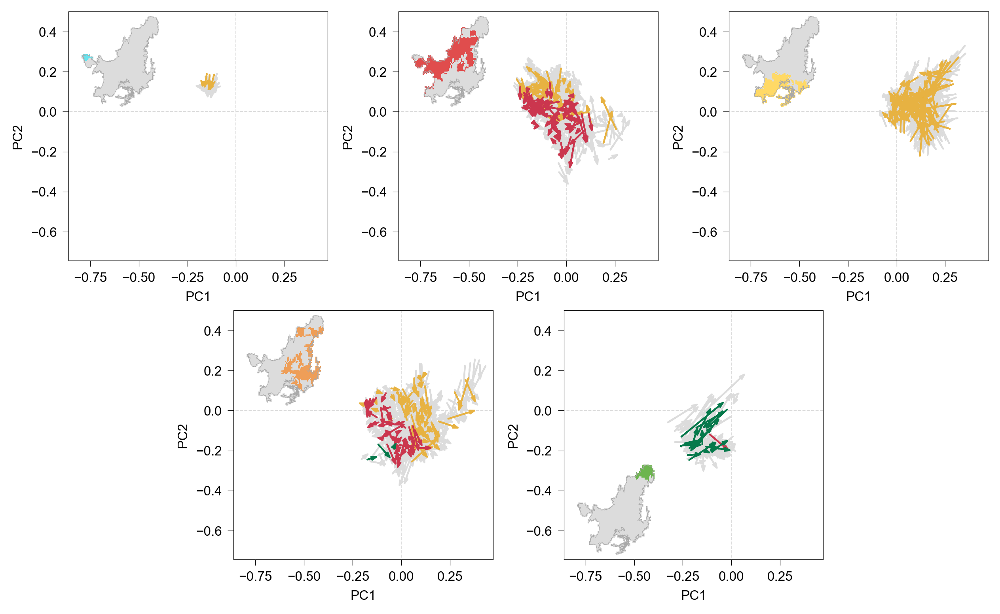

In [22]:
fig = plt.figure(figsize = (10, 6.))
gs = mpl.gridspec.GridSpec(4, 6, wspace=0.75, hspace=0.5)

grid_indicator = [[(0,2), (0,2)], [(0,2), (2,4)], [(0,2), (4,6)], [(2,4), (1,3)], [(2,4), (3,5)]]

num_select = [int(0.15 * len(data['p1'][data['p1']['clust_{}'.format(kp1_1)] == cl_id])) for cl_id in range(1, kp1_1 + 1)]

pca_id = 'climatic01'


for h, indicator in zip(range(kp1_1), grid_indicator):
    
    cl_id = h + 1
    
    x1, x2 = indicator[0]
    y1, y2 = indicator[1]
    
    axes = fig.add_subplot(gs[x1:x2, y1:y2])
    
    clust_p1 = pca_p1_expVars[pca_id][pca_p1_expVars[pca_id]['clust_{}'.format(kp1_1)] == cl_id].reset_index(drop = True) 
    clust_p4 = pcaproj_p4_expVars[pca_id][pcaproj_p4_expVars[pca_id]['clust_{}'.format(kp1_1)] == cl_id].reset_index(drop = True) 
    
    n_total = num_select[h]
    unique_counts = clust_p4.groupby('clust_{}'.format(kp4_1))['id'].agg('nunique')
    nums_selected= np.floor(unique_counts / unique_counts.sum() * n_total).astype(int)  # rounded down

    selection = clust_p4.groupby('clust_{}'.format(kp4_1), group_keys = False).apply(
        lambda x: x.sample(n = nums_selected[x.name], #num_select[h]
                           replace = False))
    selection = selection.index.tolist()

    axes.axvline(0, -1, 1, linestyle = '--', linewidth = 0.5, color = 'gainsboro')
    axes.axhline(0, -1, 1, linestyle = '--', linewidth = 0.5, color = 'gainsboro')
    
    axes.set_xlim(pc1_min - 0.1, pc1_max + 0.1)
    axes.set_ylim(pc2_min - 0.1, pc2_max + 0.1)
    
    axes.set_xlabel('PC1', fontsize = 8)
    axes.set_ylabel('PC2', fontsize = 8)
    
    axes.tick_params(axis='both', 
                    which='both',
                    bottom=True,
                    left = True,
                    labelbottom=True, labelleft = True,
                    width = 0.3,
                    labelsize = 8)
    
    # Change width of all spines of axis
    for axis in ['top','bottom','left','right']:
        axes.spines[axis].set_linewidth(0.3)

    for i in clust_p4[~clust_p4.index.isin(selection)].index:#range(len(clust_p1['PC1'])):
        basex = clust_p1.loc[i, 'PC1'].item()
        basey = clust_p1.loc[i, 'PC2'].item()

        dx = clust_p4.loc[i, 'PC1'].item()# - basex
        dy = clust_p4.loc[i, 'PC2'].item()# - basey

        c = 'gainsboro' #clust_p4.loc[i, 'colors']

        axes.annotate('', xy = (dx, dy),
                      xytext = (basex, basey),
                      arrowprops = {'edgecolor' : c, 'facecolor':c, 'width' : 0.0001, 'headwidth':2, 'headlength':3})


    for i in selection:#range(len(clust_p1['PC1'])):
        basex = clust_p1.loc[i, 'PC1'].item()
        basey = clust_p1.loc[i, 'PC2'].item()

        dx = clust_p4.loc[i, 'PC1'].item()# - basex
        dy = clust_p4.loc[i, 'PC2'].item()# - basey

        c = clust_p4.loc[i, 'colors_{}'.format(kp4_1)]
        axes.annotate('', xy = (dx, dy),
                      xytext = (basex, basey),
                      arrowprops = {'edgecolor' : c, 'facecolor':c, 'width' : 0.0001, 'headwidth':2, 'headlength':3})

    # Create inset legend manually
    if cl_id < kp1_1:
        # Where to put the box and its shape
        ax = axes.inset_axes([0.,0.6,0.4,0.4])   
    elif cl_id == kp1_1:
        ax = axes.inset_axes([0.,0.0,0.4,0.4]) 
    ax.set_aspect('equal', adjustable = 'box')

    # Create temporary column with colors
    data['p1']['map_col'] = 'gainsboro'
    data['p1'].loc[data['p1']['clust_{}'.format(kp1_1)] == cl_id, 'map_col'] = data['p1'].loc[data['p1']['clust_{}'.format(kp1_1)] == cl_id, 'colors_{}'.format(kp1_1)]
    data['p1'].plot(ax = ax, color = data['p1']['map_col'])
    
    cerrado = gpd.read_file('../../data/shapes/cerrado_1-250000.shp')
    cerrado = cerrado.to_crs(grid.crs)
    cerrado.boundary.plot(ax = ax, linewidth=0.2, edgecolor = 'darkgrey')

    ax.set_axis_off()
    # break
    
# # Create legend manually
# patches_p1 = [Patch(color = c, label = l) for c, l in zip(pal_p14['p1'].values(), pal_p14['p1'].keys())]
# patches_p4 = [Patch(color = c, label = l) for c, l in zip(pal_p14['p4'].values(), pal_p14['p4'].keys())]
# legend_p1 = plt.legend(handles = patches_p1, title ='Period 1985-1993:', loc = (1.05, 0.45), fontsize = 8, title_fontsize = 8, frameon = False)
# plt.legend(handles = patches_p4, title ='Period 2012-2020:', loc = (1.05, .1), fontsize = 8, title_fontsize = 8, frameon = False)
# plt.gca().add_artist(legend_p1)

# plt.savefig('../plots/arrows_change_cluster.png', dpi=300, facecolor='white', transparent=False, bbox_inches="tight")
# plt.savefig('../plots/arrows_change_cluster.pdf', dpi=300, facecolor='white', transparent=False, bbox_inches="tight")
# plt.show()

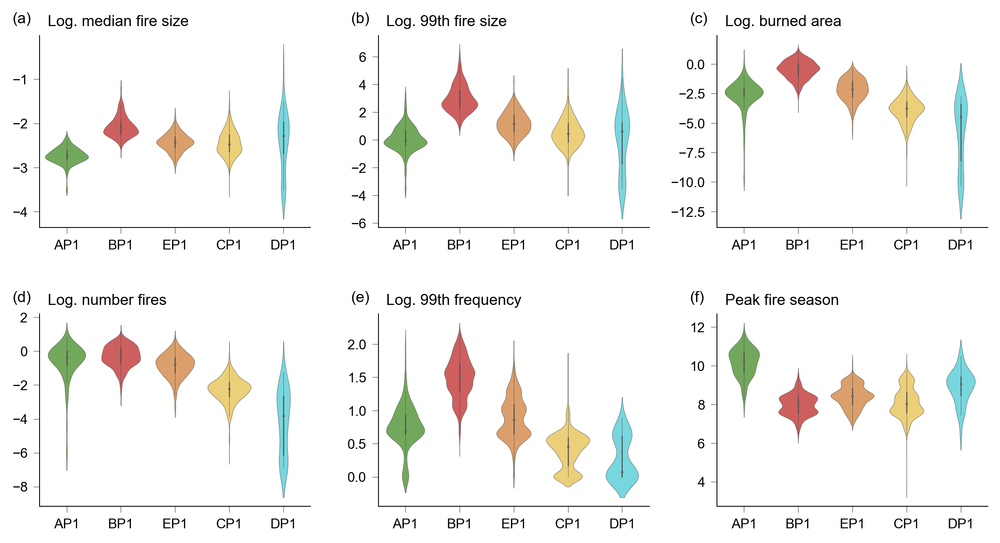

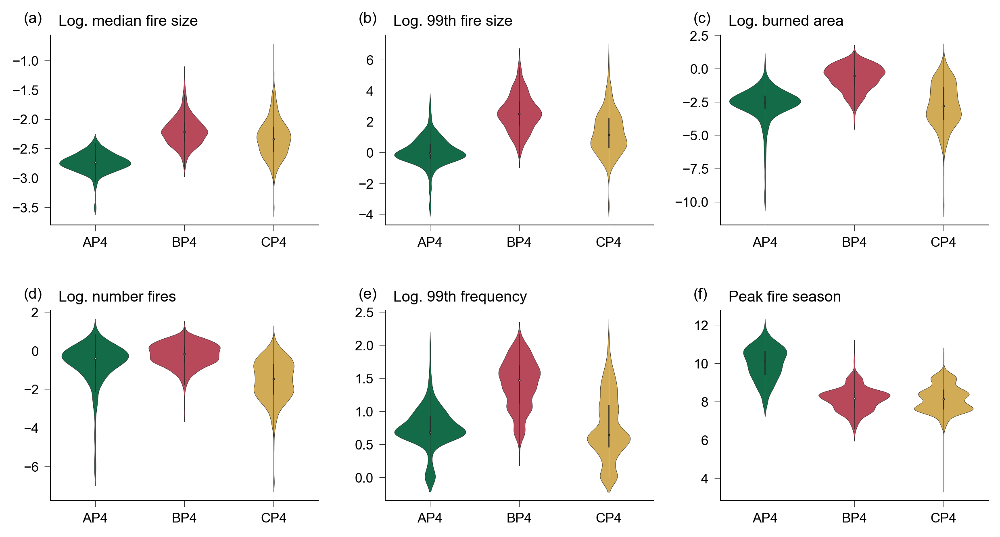

In [51]:
# Create figure of subplots

t = 1

for period, period_label, k, list_vars, list_labels, order_clusters, fdata, fig_labels in zip([1]*t + [4]*t, ['(1985, 1993)']*t + ['(2012, 2020)']*t, [kp1_1]*t + [kp4_1]*t,
                                                                                      [fire_vars_t]*t + [fire_vars_t]*t, [pca_comp_labels]*t + [pca_comp_labels]*t, 
                                                                                      [['AP1', 'BP1', 'EP1', 'CP1', 'DP1']] * t + [['AP4', 'BP4', 'CP4']] * t,
                                                                                      [fdata_p1]*t + [fdata_p4]*t,
                                                                                             [['(a)', '(b)', '(c)', '(d)', '(e)', '(f)']]*t*2):
    
    fig = plt.figure(figsize = (10, 5))



    # Create the grid of figures
    gs = mpl.gridspec.GridSpec(2, 3, wspace=0.25, hspace=0.45) # 2x5 grid


    # Create data subset to plot
    toPlot = fdata_p1[['id'] + list_vars].copy()
    toPlot = reduce(lambda df1, df2: pd.merge(df1, df2, on='id'), [grid, data['p{}'.format(period)][['id','clust_{}'.format(k), 'clust_alpha_{}'.format(k)]], toPlot])
    
    # Order according to preset order

    # print(toPlot)
    # toPlot = data[['id', 'geometry', 'clust_{}'.format(k)] + list_vars].copy()


    # Creating the different boxplots
    b = 0
    for i in range(0, 2):
        for j in range(0, 3):
            if b < len(list_vars):
                ax = fig.add_subplot(gs[i, j])

                sns.violinplot(data = toPlot, x = 'clust_alpha_{}'.format(k), y = list_vars[b], 
                               order = order_clusters,
                               ax = ax,
                               palette = pal_p14['p{}'.format(period)], # [pal_p14['p{}'.format(period)][e] for e in toPlot['clust_alpha_{}'.format(k)].unique()],# pal_p14['p{}'.format(period)],
                               linewidth = 0.2)#, scale = 'width') 

                ax.set_xlabel('')
                ax.set_ylabel('')
                ax.tick_params(axis='both', which='major', labelsize=8, width = 0.2)

                ax.text(x=0.03, y=1.05, s=list_labels[b], transform=ax.transAxes, fontsize=9)
                ax.text(x=-0.1, y=1.065, s=fig_labels[b], transform=ax.transAxes, fontsize=9)

                # Change width of all spines of axis
                for axis in ['top','right']:
                    ax.spines[axis].set_linewidth(0.)
                for axis in ['bottom','left']:
                    ax.spines[axis].set_linewidth(0.5)

    # Change width of all spine
                b += 1
        
    plt.savefig('../plots/boxplot_fireVars_period{}.png'.format(period), dpi=300, facecolor='white', transparent=False, bbox_inches="tight")
    plt.savefig('../plots/boxplot_fireVars_period{}.pdf'.format(period), dpi=300, facecolor='white', transparent=False, bbox_inches="tight")

plt.show()

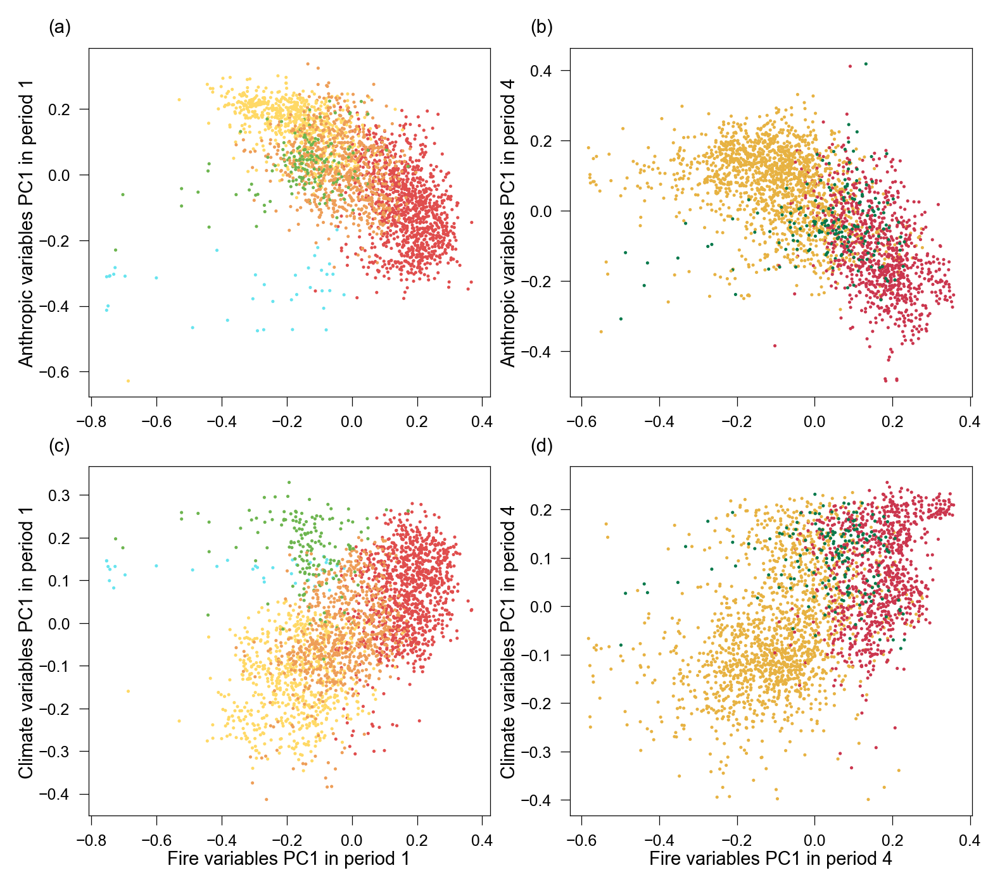

In [170]:
fig, axes = plt.subplots(2, 2, figsize = (6, 5.25))

for i, p, k, fig_labels in zip([0,1],[1,4], [5,3], [('(a)', '(c)'), ('(b)', '(d)')]):
    
    if p == 1:
        ant_x = 1
        ant_y = 1
        
        clim_x = 1
        clim_y = -1
    elif p == 4:
        ant_x = -1
        ant_y = -1
        
        clim_x = -1
        clim_y = -1
    
    # ANTHROPIC
    
    sns.scatterplot(x = ant_x * data['p{}'.format(p)]['PC1'], 
                    y = ant_y * expVars_pca['p{}_anthropic03'.format(p)]['PC1'], 
                    hue = data['p{}'.format(p)]['clust_alpha_{}'.format(k)], 
                    ax = axes[0][i], s = 1.5, edgecolor = 'none', legend = None, palette = pal_p14['p{}'.format(p)])
    
    axes[0][i].tick_params(axis='both', 
                    which='both',
                    bottom=True,
                    left = True,
                    labelbottom=True, labelleft = True,
                    width = 0.3,
                    labelsize = 6)
    
    # Change width of all spines of axis
    for axis in ['top','bottom','left','right']:
        axes[0][i].spines[axis].set_linewidth(0.3)
        
    # Adding figure label
    axes[0][i].text(x=-0.1, y=1.045, s=fig_labels[0], transform=axes[0][i].transAxes, fontsize=7)
    
    
        
    # CLIMATIC
    
    sns.scatterplot(x = clim_x * data['p{}'.format(p)]['PC1'], 
                    y = clim_y * expVars_pca['p{}_climatic03'.format(p)]['PC1'], 
                hue = data['p{}'.format(p)]['clust_alpha_{}'.format(k)], 
                ax = axes[1][i], s = 1.5, edgecolor = 'none', legend = None, palette = pal_p14['p{}'.format(p)])
    
    axes[1][i].tick_params(axis='both', 
                    which='both',
                    bottom=True,
                    left = True,
                    labelbottom=True, labelleft = True,
                    width = 0.3,
                    labelsize = 6)
    
    # Change width of all spines of axis
    for axis in ['top','bottom','left','right']:
        axes[1][i].spines[axis].set_linewidth(0.3)
        
    # Adding figure label
    axes[1][i].text(x=-0.1, y=1.045, s=fig_labels[1], transform=axes[1][i].transAxes, fontsize=7)


axes[1][0].set_xlabel('Fire variables PC1 in period 1', fontsize = 7, labelpad = 0.75)
axes[1][1].set_xlabel('Fire variables PC1 in period 4', fontsize = 7, labelpad = 0.75)
axes[0][1].set_xlabel('')
axes[0][0].set_xlabel('')

axes[0][0].set_ylabel('Anthropic variables PC1 in period 1', fontsize = 7, labelpad = 0.75)
axes[1][0].set_ylabel('Climate variables PC1 in period 1', fontsize = 7, labelpad = 0.75)
axes[0][1].set_ylabel('Anthropic variables PC1 in period 4', fontsize = 7, labelpad = 0.75)
axes[1][1].set_ylabel('Climate variables PC1 in period 4', fontsize = 7, labelpad = 0.75)

plt.savefig('../plots/fire_activity_human_presence_clim.png', dpi=300, facecolor='white', transparent=False, bbox_inches="tight")
plt.savefig('../plots/fire_activity_human_presence_clim.pdf', dpi=300, facecolor='white', transparent=False, bbox_inches="tight")
plt.show()

In [149]:
cells_in_cluster = data['p4'][data['p4']['clust_{}'.format(kp4_1)] == 1].reset_index(drop = True)['id'].tolist()

clust_p1 = data['p1'].sort_values(by = 'id')[data['p1']['id'].isin(cells_in_cluster)].reset_index(drop = True)['PC1']
clust_p4 = pcaproj_p4.sort_values(by = 'id')[pcaproj_p4['clust_{}'.format(kp4_1)] == 1].reset_index(drop = True)['PC1']
colors = pcaproj_p4.sort_values(by = 'id')[pcaproj_p4['clust_{}'.format(kp4_1)] == 1].reset_index(drop = True)['clust_alpha_{}'.format(kp1_1)]
title = pcaproj_p4.sort_values(by = 'id')[pcaproj_p4['clust_{}'.format(kp4_1)] == 1].reset_index(drop = True).loc[0,'clust_alpha_{}'.format(kp4_1)]

In [129]:
pca_trends

,id,geometry,pca_var,interc,slope,slope_cimin,slope_cimax,slope_sig,clust_5
0,307.0,"POLYGON ((4288491.269 8664278.452, 4318491.269...",PC1,-0.034230,0.019026,-0.057198,0.095250,False,1
1,307.0,"POLYGON ((4288491.269 8664278.452, 4318491.269...",PC2,-0.074748,0.027658,-0.027883,0.083200,False,1
2,308.0,"POLYGON ((4288491.269 8634278.452, 4318491.269...",PC1,0.146120,-0.024974,-0.052713,0.002765,False,2
3,308.0,"POLYGON ((4288491.269 8634278.452, 4318491.269...",PC2,0.031578,0.001685,-0.035884,0.039253,False,2
4,309.0,"POLYGON ((4288491.269 8604278.452, 4318491.269...",PC1,0.091161,0.017313,-0.027842,0.062469,False,2
...,...,...,...,...,...,...,...,...,...
5297,6513.0,"POLYGON ((6388491.269 9384278.451, 6418491.269...",PC2,0.243770,-0.050713,-0.088301,-0.013125,True,5
5298,6514.0,"POLYGON ((6388491.269 9354278.452, 6418491.269...",PC1,0.100376,-0.023337,-0.090285,0.043612,False,4
5299,6514.0,"POLYGON ((6388491.269 9354278.452, 6418491.269...",PC2,0.222574,-0.038007,-0.112745,0.036732,False,4
5300,6515.0,"POLYGON ((6388491.269 9324278.452, 6418491.269...",PC1,0.127852,-0.013684,-0.086770,0.059402,False,4


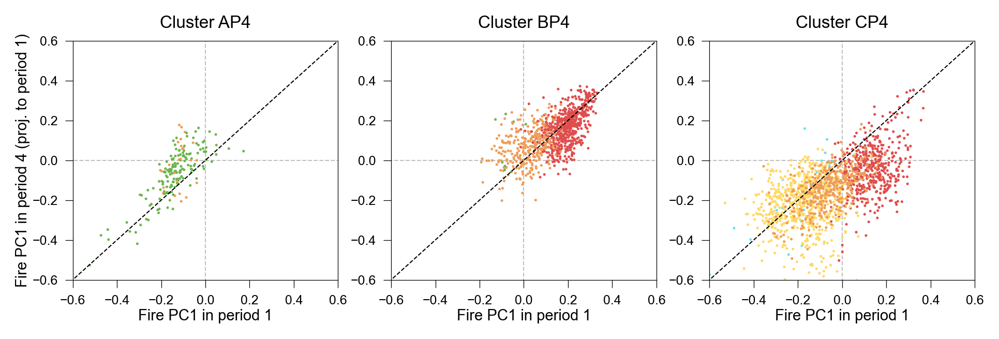

In [189]:
fig, axx = plt.subplots(1, 3, figsize = (7.5, 2.))

for i, c, axes in zip(range(3), [3,2,1], axx.flatten()):
    
    # List of cells in cluster c in period 4
    cells_in_cluster = data['p4'][data['p4']['clust_{}'.format(kp4_1)] == c].reset_index(drop = True)['id'].tolist()
    
    clust_p1 = data['p1'].sort_values(by = 'id')[data['p1']['id'].isin(cells_in_cluster)].reset_index(drop = True)['PC1']
    clust_p4 = pcaproj_p4.sort_values(by = 'id')[pcaproj_p4['clust_{}'.format(kp4_1)] == c].reset_index(drop = True)['PC1']
    colors = pcaproj_p4.sort_values(by = 'id')[pcaproj_p4['clust_{}'.format(kp4_1)] == c].reset_index(drop = True)['clust_alpha_{}'.format(kp1_1)]
    title = pcaproj_p4.sort_values(by = 'id')[pcaproj_p4['clust_{}'.format(kp4_1)] == c].reset_index(drop = True).loc[0,'clust_alpha_{}'.format(kp4_1)]




    axes. set_title('Cluster {}'.format(title), fontsize = 8)
    
    sns.scatterplot(x = clust_p1, y = clust_p4, hue = colors, palette = pal_p14['p{}'.format(1)],
                   ax = axes, s = 1.5, edgecolor = 'none', legend = False)
    
    axes.axvline(0, -1, 1, linestyle = '--', linewidth = 0.5, color = 'silver', zorder = 0)
    axes.axhline(0, -1, 1, linestyle = '--', linewidth = 0.5, color = 'silver', zorder = 0)

    axes.plot([-1, 1], [-1, 1], linestyle = '--', linewidth = 0.5, color = 'black')

    axes.set_xlim((-0.6, 0.6))
    axes.set_ylim((-0.6, 0.6))
    
    axes.tick_params(axis='both', 
                    which='both',
                    bottom=True,
                    left = True,
                    labelbottom=True, labelleft = True,
                    width = 0.3,
                    labelsize = 6)
    
    # Change width of all spines of axis
    for axis in ['top','bottom','left','right']:
        axes.spines[axis].set_linewidth(0.3)
        
    axes.set_xlabel('Fire PC1 in period 1', fontsize = 7, labelpad = 1)
    
    if i == 0:
        axes.set_ylabel('Fire PC1 in period 4 (proj. to period 1)', fontsize = 7, labelpad = 1)
    else:
        axes.set_ylabel('')
    
plt.savefig('../plots/change_fire_activity.png', dpi=300, facecolor='white', transparent=False, bbox_inches="tight")
plt.savefig('../plots/change_fire_activity.pdf', dpi=300, facecolor='white', transparent=False, bbox_inches="tight")
plt.show()

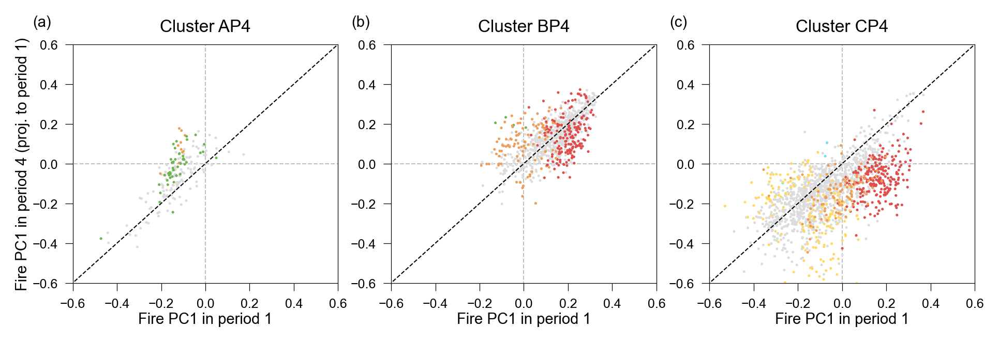

In [43]:
fig, axx = plt.subplots(1, 3, figsize = (7.5, 2.))

# List of cells with significative trends in PC1 (using OLS)
cells_pc1_sig = pca_trends[(pca_trends['slope_sig'] == True) & (pca_trends['pca_var'] == 'PC1')]['id'].tolist()
cells_pc1_sig

for i, c, axes, fig_labels in zip(range(3), [3,2,1], axx.flatten(), ['(a)', '(b)', '(c)']):
    
    # List of cells in cluster c in period 4
    cells_in_cluster = data['p4'][data['p4']['clust_{}'.format(kp4_1)] == c].reset_index(drop = True)['id'].tolist()
    
    clust_p1 = data['p1'].sort_values(by = 'id')[data['p1']['id'].isin(cells_in_cluster) & ~data['p1']['id'].isin(cells_pc1_sig)].reset_index(drop = True)['PC1']
    clust_p4 = pcaproj_p4.sort_values(by = 'id')[(pcaproj_p4['clust_{}'.format(kp4_1)] == c) & (~pcaproj_p4['id'].isin(cells_pc1_sig))].reset_index(drop = True)['PC1']
    colors = pcaproj_p4.sort_values(by = 'id')[(pcaproj_p4['clust_{}'.format(kp4_1)] == c) & (~pcaproj_p4['id'].isin(cells_pc1_sig))].reset_index(drop = True)['clust_alpha_{}'.format(kp1_1)]

    sns.scatterplot(x = clust_p1, y = clust_p4, color = 'gainsboro',#  hue = 'gainsboro', palette = pal_p14['p{}'.format(1)],
                   ax = axes, s = 1.5, edgecolor = 'none', legend = False)#, alpha = 0.5)
    

    clust_p1 = data['p1'].sort_values(by = 'id')[data['p1']['id'].isin(cells_in_cluster) & data['p1']['id'].isin(cells_pc1_sig)].reset_index(drop = True)['PC1']
    clust_p4 = pcaproj_p4.sort_values(by = 'id')[(pcaproj_p4['clust_{}'.format(kp4_1)] == c) & (pcaproj_p4['id'].isin(cells_pc1_sig))].reset_index(drop = True)['PC1']
    colors = pcaproj_p4.sort_values(by = 'id')[(pcaproj_p4['clust_{}'.format(kp4_1)] == c) & (pcaproj_p4['id'].isin(cells_pc1_sig))].reset_index(drop = True)['clust_alpha_{}'.format(kp1_1)]
    title = pcaproj_p4.sort_values(by = 'id')[(pcaproj_p4['clust_{}'.format(kp4_1)] == c) & (pcaproj_p4['id'].isin(cells_pc1_sig))].reset_index(drop = True).loc[0,'clust_alpha_{}'.format(kp4_1)]

    sns.scatterplot(x = clust_p1, y = clust_p4, hue = colors, palette = pal_p14['p{}'.format(1)],
                   ax = axes, s = 1.5, edgecolor = 'none', legend = False)
    
    
    axes.set_title('Cluster {}'.format(title), fontsize = 8)
    
    axes.axvline(0, -1, 1, linestyle = '--', linewidth = 0.5, color = 'silver', zorder = 0)
    axes.axhline(0, -1, 1, linestyle = '--', linewidth = 0.5, color = 'silver', zorder = 0)

    axes.plot([-1, 1], [-1, 1], linestyle = '--', linewidth = 0.5, color = 'black')

    axes.set_xlim((-0.6, 0.6))
    axes.set_ylim((-0.6, 0.6))
    
    axes.tick_params(axis='both', 
                    which='both',
                    bottom=True,
                    left = True,
                    labelbottom=True, labelleft = True,
                    width = 0.3,
                    labelsize = 6)
    
    # Change width of all spines of axis
    for axis in ['top','bottom','left','right']:
        axes.spines[axis].set_linewidth(0.3)
        
    axes.set_xlabel('Fire PC1 in period 1', fontsize = 7, labelpad = 1)
    
    if i == 0:
        axes.set_ylabel('Fire PC1 in period 4 (proj. to period 1)', fontsize = 7, labelpad = 1)
    else:
        axes.set_ylabel('')
        
    # Adding figure label
    axes.text(x=-0.15, y=1.075, s=fig_labels, transform=axes.transAxes, fontsize=7)
    
plt.savefig('../plots/change_fire_activity_sig.png', dpi=300, facecolor='white', transparent=True, bbox_inches="tight")
plt.savefig('../plots/change_fire_activity_sig.pdf', dpi=300, facecolor='white', transparent=True, bbox_inches="tight")
plt.show()

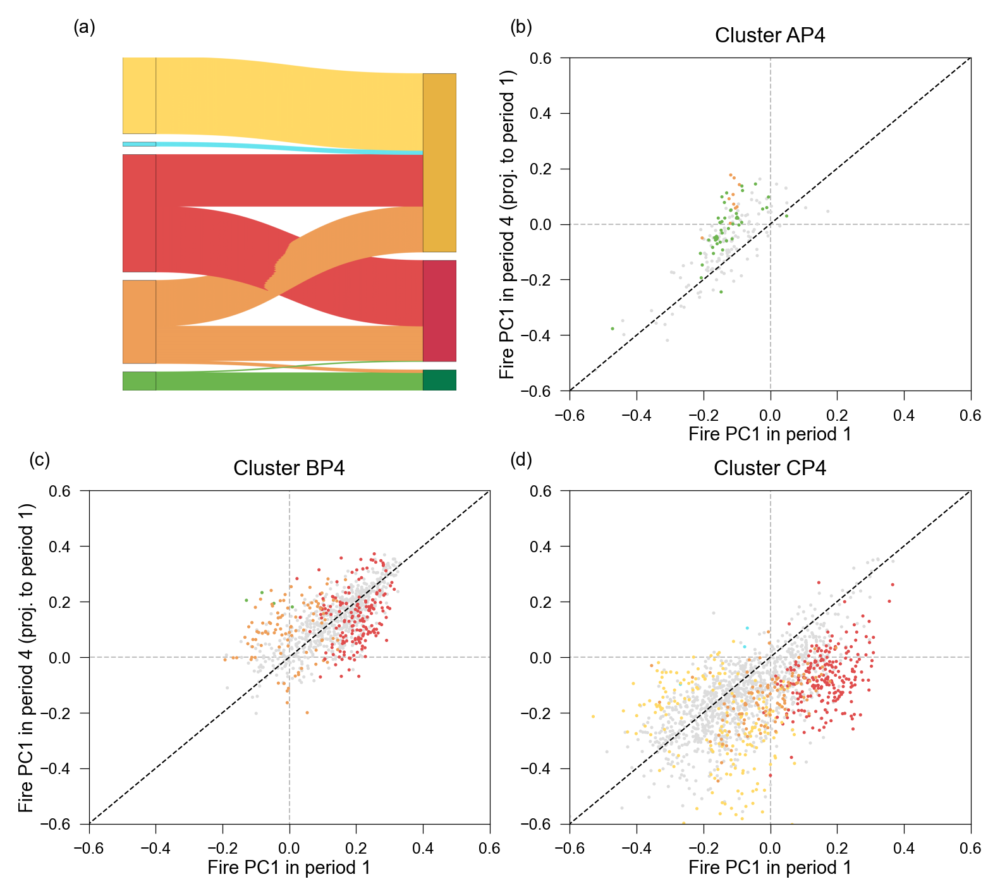

In [73]:
fig, axx = plt.subplots(2, 2, figsize = (6., 5.25))

plt.subplots_adjust(hspace = 0.3)

# List of cells with significative trends in PC1 (using OLS)
cells_pc1_sig = pca_trends[(pca_trends['slope_sig'] == True) & (pca_trends['pca_var'] == 'PC1')]['id'].tolist()
cells_pc1_sig

for i, c, axes, fig_labels in zip(range(4), [0,3,2,1], axx.flatten(), ['(a)', '(b)', '(c)','(d)']):
    
    if i == 0:
        # Reading transition plot
        trans_plot = plt.imread('../plots/transition_plot5.png')
        axes.imshow(trans_plot)
        axes.axis('off')
        # Adding figure label
        axes.text(x=-0.15, y=1.075, s=fig_labels, transform=axes.transAxes, fontsize=7)
        
    else:
        # List of cells in cluster c in period 4
        cells_in_cluster = data['p4'][data['p4']['clust_{}'.format(kp4_1)] == c].reset_index(drop = True)['id'].tolist()

        clust_p1 = data['p1'].sort_values(by = 'id')[data['p1']['id'].isin(cells_in_cluster) & ~data['p1']['id'].isin(cells_pc1_sig)].reset_index(drop = True)['PC1']
        clust_p4 = pcaproj_p4.sort_values(by = 'id')[(pcaproj_p4['clust_{}'.format(kp4_1)] == c) & (~pcaproj_p4['id'].isin(cells_pc1_sig))].reset_index(drop = True)['PC1']
        colors = pcaproj_p4.sort_values(by = 'id')[(pcaproj_p4['clust_{}'.format(kp4_1)] == c) & (~pcaproj_p4['id'].isin(cells_pc1_sig))].reset_index(drop = True)['clust_alpha_{}'.format(kp1_1)]

        sns.scatterplot(x = clust_p1, y = clust_p4, color = 'gainsboro',#  hue = 'gainsboro', palette = pal_p14['p{}'.format(1)],
                       ax = axes, s = 1.5, edgecolor = 'none', legend = False)#, alpha = 0.5)


        clust_p1 = data['p1'].sort_values(by = 'id')[data['p1']['id'].isin(cells_in_cluster) & data['p1']['id'].isin(cells_pc1_sig)].reset_index(drop = True)['PC1']
        clust_p4 = pcaproj_p4.sort_values(by = 'id')[(pcaproj_p4['clust_{}'.format(kp4_1)] == c) & (pcaproj_p4['id'].isin(cells_pc1_sig))].reset_index(drop = True)['PC1']
        colors = pcaproj_p4.sort_values(by = 'id')[(pcaproj_p4['clust_{}'.format(kp4_1)] == c) & (pcaproj_p4['id'].isin(cells_pc1_sig))].reset_index(drop = True)['clust_alpha_{}'.format(kp1_1)]
        title = pcaproj_p4.sort_values(by = 'id')[(pcaproj_p4['clust_{}'.format(kp4_1)] == c) & (pcaproj_p4['id'].isin(cells_pc1_sig))].reset_index(drop = True).loc[0,'clust_alpha_{}'.format(kp4_1)]

        sns.scatterplot(x = clust_p1, y = clust_p4, hue = colors, palette = pal_p14['p{}'.format(1)],
                       ax = axes, s = 1.5, edgecolor = 'none', legend = False)


        axes.set_title('Cluster {}'.format(title), fontsize = 8)

        axes.axvline(0, -1, 1, linestyle = '--', linewidth = 0.5, color = 'silver', zorder = 0)
        axes.axhline(0, -1, 1, linestyle = '--', linewidth = 0.5, color = 'silver', zorder = 0)

        axes.plot([-1, 1], [-1, 1], linestyle = '--', linewidth = 0.5, color = 'black')

        axes.set_xlim((-0.6, 0.6))
        axes.set_ylim((-0.6, 0.6))

        axes.tick_params(axis='both', 
                        which='both',
                        bottom=True,
                        left = True,
                        labelbottom=True, labelleft = True,
                        width = 0.3,
                        labelsize = 6)

        # Change width of all spines of axis
        for axis in ['top','bottom','left','right']:
            axes.spines[axis].set_linewidth(0.3)

        axes.set_xlabel('Fire PC1 in period 1', fontsize = 7, labelpad = 1)

        if (i == 1) | (i == 2):
            axes.set_ylabel('Fire PC1 in period 4 (proj. to period 1)', fontsize = 7, labelpad = 1)
        else:
            axes.set_ylabel('')

        # Adding figure label
        axes.text(x=-0.15, y=1.075, s=fig_labels, transform=axes.transAxes, fontsize=7)
    
# # Reading transition plot
# trans_plot = plt.imread('../plots/transition_plot5.png')
# axx[3].imshow(trans_plot)
# axx[3].axis('off')
# # Adding figure label
# axx[3].text(x=-0.15, y=1.075, s='(d)', transform=axx[3].transAxes, fontsize=7)
    
plt.savefig('../plots/change_fire_activity_sig_transPlot.png', dpi=300, facecolor='white', transparent=False, bbox_inches="tight")
plt.savefig('../plots/change_fire_activity_sig_transPlot.pdf', dpi=300, facecolor='white', transparent=False, bbox_inches="tight")
plt.show()

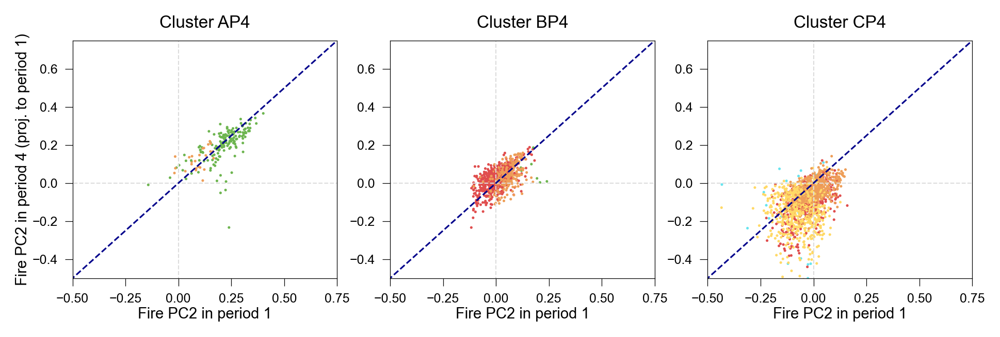

In [44]:
fig, axx = plt.subplots(1, 3, figsize = (7.5, 2.))

for i, c, axes in zip(range(3), [3,2,1], axx.flatten()):

    cells_in_cluster = data['p4'][data['p4']['clust_{}'.format(kp4_1)] == c].reset_index(drop = True)['id'].tolist()

    clust_p1 = data['p1'].sort_values(by = 'id')[data['p1']['id'].isin(cells_in_cluster)].reset_index(drop = True)['PC2']
    clust_p4 = pcaproj_p4.sort_values(by = 'id')[pcaproj_p4['clust_{}'.format(kp4_1)] == c].reset_index(drop = True)['PC2']
    colors = pcaproj_p4.sort_values(by = 'id')[pcaproj_p4['clust_{}'.format(kp4_1)] == c].reset_index(drop = True)['clust_alpha_{}'.format(kp1_1)]
    title = pcaproj_p4.sort_values(by = 'id')[pcaproj_p4['clust_{}'.format(kp4_1)] == c].reset_index(drop = True).loc[0,'clust_alpha_{}'.format(kp4_1)]




    axes. set_title('Cluster {}'.format(title), fontsize = 8)
    
    sns.scatterplot(x = clust_p1, y = clust_p4, hue = colors, palette = pal_p14['p{}'.format(1)],
                   ax = axes, s = 1.5, edgecolor = 'none', legend = False)
    
    axes.axvline(0, -1, 1, linestyle = '--', linewidth = 0.5, color = 'gainsboro')
    axes.axhline(0, -1, 1, linestyle = '--', linewidth = 0.5, color = 'gainsboro')

    axes.plot([-1, 1], [-1, 1], linestyle = '--', linewidth = 0.75, color = 'darkblue')

    axes.set_xlim((-0.5, 0.75))
    axes.set_ylim((-0.5, 0.75))
    
    axes.tick_params(axis='both', 
                    which='both',
                    bottom=True,
                    left = True,
                    labelbottom=True, labelleft = True,
                    width = 0.3,
                    labelsize = 6)
    
    # Change width of all spines of axis
    for axis in ['top','bottom','left','right']:
        axes.spines[axis].set_linewidth(0.3)
        
    axes.set_xlabel('Fire PC2 in period 1', fontsize = 7, labelpad = 1)
    
    if i == 0:
        axes.set_ylabel('Fire PC2 in period 4 (proj. to period 1)', fontsize = 7, labelpad = 1)
    else:
        axes.set_ylabel('')
    
# plt.savefig('../plots/change_fire_activity.png', dpi=300, facecolor='white', transparent=False, bbox_inches="tight")
# plt.savefig('../plots/change_fire_activity.pdf', dpi=300, facecolor='white', transparent=False, bbox_inches="tight")
# plt.show()

[0 1 2 3 4 6 7 8]


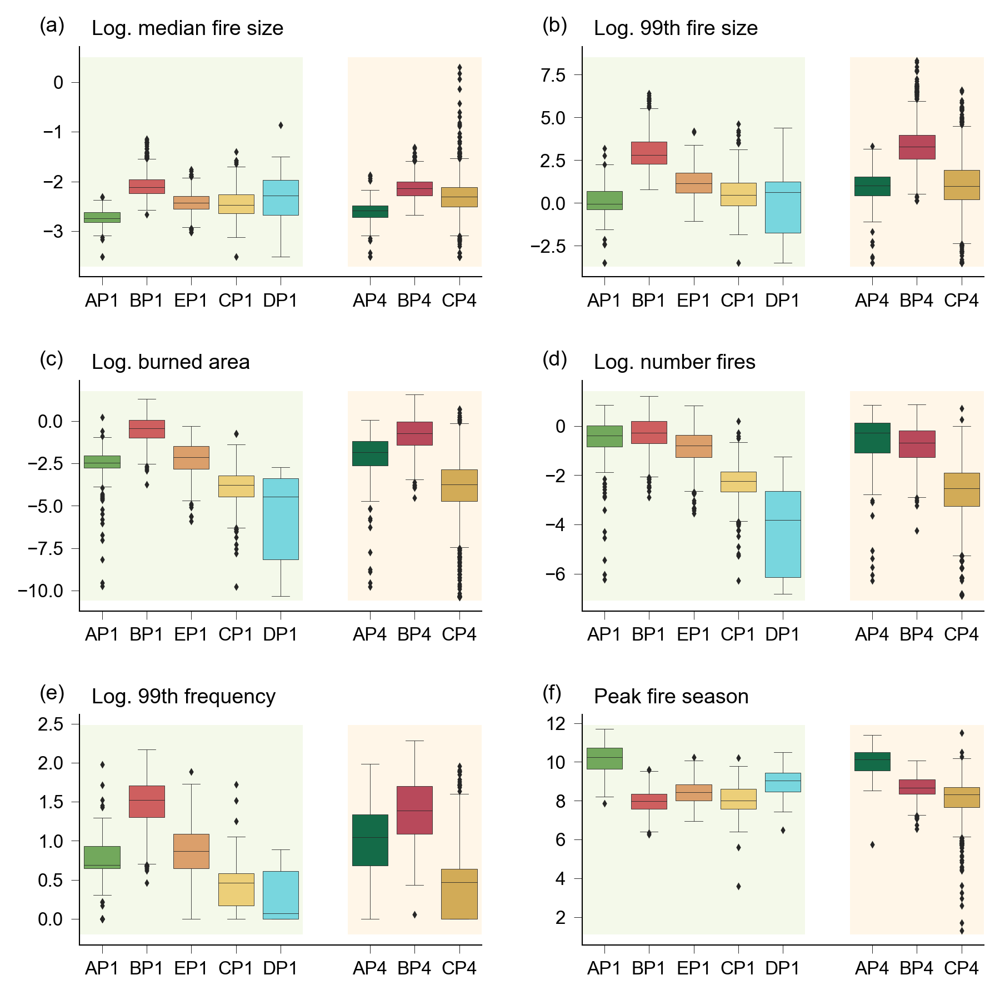

In [85]:
pal_p14_numeric = {
    5-1 : '#6db54f',
    2-1 : '#e04d4d',
    3-1 : '#ffd966', # '#6fa8dc',
    1-1 : '#67e4ef', # '#eeeeee',
    4-1 : '#ee9e58',
    5 : '#ee9e58',
    # 6 : '#ee9e58',
    # 7 : '#ee9e58',
    8 : '#06794b', # list_colors[0],
    7 : '#cb364e', # list_colors[1],
    6 : '#e7b242' # list_colors[2]}
}

fig_labels = ['(a)', '(b)', '(c)', '(d)', '(e)', '(f)']

subset1 = fdata_p1[fire_vars_t + ['clust_alpha_{}'.format(kp1_1), 'clust_{}'.format(kp1_1)]]
subset1 = subset1.rename(columns = {'clust_alpha_{}'.format(kp1_1): 'clust_alpha_id', 'clust_{}'.format(kp1_1): 'clust_id'})
subset1['clust_id'] = subset1['clust_id'] - 1

subset2 = fdata_p4[fire_vars_t + ['clust_alpha_{}'.format(kp4_1), 'clust_{}'.format(kp4_1)]]
subset2 = subset2.rename(columns = {'clust_alpha_{}'.format(kp4_1): 'clust_alpha_id', 'clust_{}'.format(kp4_1): 'clust_id'})
subset2['clust_id'] = subset2['clust_id'] + 5

subset = pd.concat([subset1, subset2], ignore_index = True)
print(subset['clust_id'].unique())


# Create figure

fig = plt.figure(figsize = (7, 7))

nrow = 3
ncol = 2

# Create the grid of figures
gs = mpl.gridspec.GridSpec(nrow, ncol, wspace=0.25, hspace=0.45) # 2x5 grid

# # Create data subset to plot
# toPlot = fdata_p1[['id'] + list_vars].copy()
# toPlot = reduce(lambda df1, df2: pd.merge(df1, df2, on='id'), [grid, data['p{}'.format(period)][['id','clust_{}'.format(k), 'clust_alpha_{}'.format(k)]], toPlot])

# Creating the different boxplots
b = 0
for i in range(0, nrow):
    for j in range(0, ncol):
        if b < len(fire_vars_t):
            ax = fig.add_subplot(gs[i, j])

            # sns.boxplot(data = toPlot, x = 'clust_{}'.format(k), y = list_vars[b], 
            #                order = [0,1,2,3,4,5,6,7,8],# order_clusters,
            #                ax = ax,
            #                palette = pal_p14_numeric['p{}'.format(period)], # [pal_p14['p{}'.format(period)][e] for e in toPlot['clust_alpha_{}'.format(k)].unique()],# pal_p14['p{}'.format(period)],
            #                linewidth = 0.2)#, scale = 'width') 
            
            # Shading areas depending on period
            ax.fill_between([-0.5, 4.5], min(subset[fire_vars_t[b]]) - 0.2, 
                            max(subset[fire_vars_t[b]]) + 0.2,
                            alpha=0.1, facecolor = 'yellowgreen',
                           zorder = 0)
            
            ax.fill_between([6-0.5, 8.5], min(subset[fire_vars_t[b]]) - 0.2, 
                            max(subset[fire_vars_t[b]]) + 0.2,
                            alpha=0.3, facecolor = 'moccasin',
                           zorder = 0)
            
            
            sns.boxplot(data = subset, x = 'clust_id', y = fire_vars_t[b],
                        order = [4, 1, 3, 2, 0, 5, 8, 7, 6],
                        ax = ax,
                        palette = pal_p14_numeric,
                        linewidth = 0.2,
                        flierprops = {'markersize' : 1}
                       )
                        
            # Setting axes to have no labels, and setting the labels of the ticks we want to show
            ax.set_xlabel('')
            ax.set_ylabel('')
            ax.tick_params(axis='both', which='major', labelsize=8, width = 0.2)
            ax.set_xticklabels(['AP1', 'BP1', 'EP1', 'CP1', 'DP1', '', 'AP4', 'BP4', 'CP4'])
            
            
            
            xticks = ax.xaxis.get_major_ticks()
            xticks[5].set_visible(False)

            ax.text(x=0.03, y=1.05, s=pca_comp_labels[b], transform=ax.transAxes, fontsize=9)
            ax.text(x=-0.1, y=1.065, s=fig_labels[b], transform=ax.transAxes, fontsize=9)
            
            

            # Change width of all spines of axis
            for axis in ['top','right']:
                ax.spines[axis].set_linewidth(0.)
            for axis in ['bottom','left']:
                ax.spines[axis].set_linewidth(0.5)

    # Change width of all spine
            b += 1


plt.savefig('../plots/boxplot_fireVars_bothPeriods.png', dpi=300, facecolor='white', transparent=False, bbox_inches="tight")
plt.savefig('../plots/boxplot_fireVars_bothPeriods.pdf', dpi=300, facecolor='white', transparent=False, bbox_inches="tight")
plt.show()


In [86]:
subset1 = fdata_p1[fire_vars_t + ['clust_alpha_5', 'clust_5']]
subset1

,log_size_q50,log_size_q99,log_burned_area_n,log_number_fires_n,log1_frequency_q99s,season_q50s,clust_alpha_5,clust_5
0,-1.910205,1.257384,-3.014430,-2.260657,0.889011,8.639677,DP1,1
1,-2.071473,1.951484,-1.392471,-0.605106,1.569511,8.326824,BP1,2
2,-1.969691,1.786247,-1.406526,-0.753111,1.592562,8.638794,BP1,2
3,-3.506558,-3.506558,-10.331728,-6.825170,0.000000,8.270411,DP1,1
4,-2.618667,-1.295299,-6.636095,-4.116845,0.000000,9.039312,DP1,1
...,...,...,...,...,...,...,...,...
2646,-2.303586,0.835256,-2.307016,-0.847769,0.688270,10.907598,AP1,5
2647,-2.618667,0.687831,-2.087609,-0.380709,0.950037,10.500984,AP1,5
2648,-2.535779,0.681049,-2.210106,-0.537286,0.834067,10.154582,AP1,5
2649,-2.340287,2.089328,-1.223083,-0.495219,1.298542,9.963898,EP1,4


In [88]:
subset2 = fdata_p4[fire_vars_t + ['clust_alpha_3', 'clust_3']]
subset2['clust_3'] = subset2['clust_3'] + 5 + 3
subset2

,log_size_q50,log_size_q99,log_burned_area_n,log_number_fires_n,log1_frequency_q99s,season_q50s,clust_alpha_3,clust_3
0,-2.192834,2.339490,-2.348546,-1.719142,1.168132,9.298527,CP4,9
1,-2.349677,2.346820,-1.955434,-1.142660,1.246367,8.528845,CP4,9
2,-2.085862,3.173439,-1.078950,-1.074179,1.705912,8.604332,CP4,9
3,-3.506558,-3.506558,-10.329908,-6.823350,0.000000,10.054108,CP4,9
4,-2.085862,-1.083952,-6.167249,-4.339655,0.000000,11.506462,CP4,9
...,...,...,...,...,...,...,...,...
2646,-2.285728,4.522219,-1.444746,-2.833770,0.680839,9.570520,BP4,10
2647,-2.259526,3.777595,-2.197443,-2.299754,0.660137,9.445390,BP4,10
2648,-2.276917,3.064204,-2.496704,-2.066479,0.680694,9.458291,BP4,10
2649,-2.022683,2.390163,-2.062515,-1.790980,0.678645,9.623435,BP4,10


In [ ]:
pca_plot(expVars_pca['p1_anthropic01'], expVars_pca_comp['p1_anthropic01'], 
         expVars_pca_exp['p1_anthropic01'].loc[0, 'PC1'].item(), 
         expVars_pca_exp['p1_anthropic01'].loc[0, 'PC2'].item(), 1, axes[0][0], 
         (-0.55, 0.75), (-0.45, 0.7), 5)

In [158]:
pcaproj_p4

,id,geometry,PC1,PC2,PC3,PC4,PC5,PC6,clust_5,clust_alpha_5,colors_5,clust_12,colors_12,clust_3,clust_alpha_3,colors_3,clust_8,colors_8
0,307.0,"POLYGON ((4288491.269 8664278.452, 4318491.269...",-0.003338,0.037047,0.123781,0.028321,0.039833,-0.007968,1,DP1,#67e4ef,1,#22668D,1,CP4,#e7b242,1,#FFBB5C
1,308.0,"POLYGON ((4288491.269 8634278.452, 4318491.269...",0.029971,0.021774,0.026129,0.044469,0.023457,-0.010081,2,BP1,#e04d4d,2,#BE3144,1,CP4,#e7b242,1,#FFBB5C
2,309.0,"POLYGON ((4288491.269 8604278.452, 4318491.269...",0.138369,0.012990,0.075347,0.041644,0.061754,-0.004764,2,BP1,#e04d4d,2,#BE3144,1,CP4,#e7b242,1,#FFBB5C
3,395.0,"POLYGON ((4318491.269 8694278.451, 4348491.269...",-0.762401,0.011698,0.056644,0.142775,0.216978,-0.003989,1,DP1,#67e4ef,1,#22668D,1,CP4,#e7b242,1,#FFBB5C
4,396.0,"POLYGON ((4318491.269 8664278.452, 4348491.269...",-0.397945,0.065777,0.334386,-0.090641,0.082813,0.005931,1,DP1,#67e4ef,1,#22668D,1,CP4,#e7b242,1,#FFBB5C
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2646,6511.0,"POLYGON ((6388491.269 9444278.452, 6418491.269...",-0.009861,0.003564,0.214602,0.146341,-0.054979,0.041600,5,AP1,#6db54f,10,#6db54f,2,BP4,#cb364e,6,#BE3144
2647,6512.0,"POLYGON ((6388491.269 9414278.452, 6418491.269...",-0.028760,0.009020,0.180224,0.097238,-0.047690,0.003906,5,AP1,#6db54f,10,#6db54f,2,BP4,#cb364e,6,#BE3144
2648,6513.0,"POLYGON ((6388491.269 9384278.451, 6418491.269...",-0.048682,0.024845,0.157134,0.066343,-0.032453,-0.004188,5,AP1,#6db54f,10,#6db54f,2,BP4,#cb364e,6,#BE3144
2649,6514.0,"POLYGON ((6388491.269 9354278.452, 6418491.269...",-0.024559,0.028496,0.182737,-0.013644,-0.024710,0.010744,4,EP1,#ee9e58,9,#FFD56F,2,BP4,#cb364e,6,#BE3144


In [149]:
# Function that helps creating the confidence ellipse
def eigsorted(cov):
    vals, vecs = np.linalg.eigh(cov)
    order = vals.argsort()[::-1]
    return vals[order], vecs[:,order]

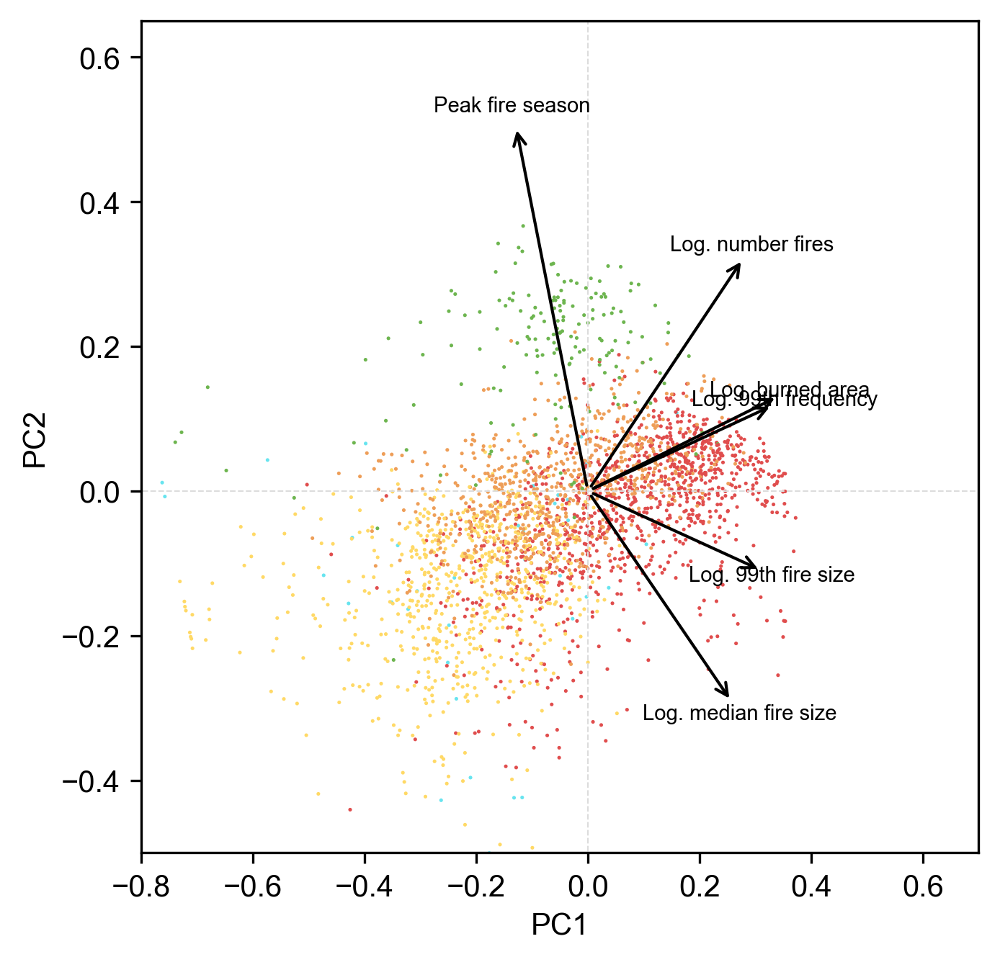

In [179]:
fig, axes = plt.subplots(figsize = (5, 5))

sns.scatterplot(data = pcaproj_p4, 
                x = 'PC1', y = 'PC2', 
                hue = 'clust_alpha_{}'.format(kp1_1), 
                palette = pal_p14['p{}'.format(1)], 
                ax = axes,
               s = 1.5, edgecolor = 'none', legend = None)

pca_lim = [((-0.8, 0.7), (-0.5, 0.65)), ((-0.6, 0.65), (-0.6, 0.55))]

 # Setting the limits of the axis manually
axes.set_xlim((-0.8, 0.7))
axes.set_ylim((-0.5, 0.65))

# Adding vertical and horizontal lines
axes.axvline(0, -1, 1, linestyle = '--', linewidth = 0.5, color = 'gainsboro')
axes.axhline(0, -1, 1, linestyle = '--', linewidth = 0.5, color = 'gainsboro')

# Adding the arrows
comp = pca_comp['p{}'.format(1)].copy()

for c in range(len(comp)):
    sc = 16
    # axes[i][1].arrow(0, 0, comp.loc[c,'PC1']/sc, comp.loc[c, 'PC2']/sc, color = 'r', width = 0.0001)
    axes.annotate('', xy = (0, 0),# xycoords = 'data',
              xytext = (comp.loc[c,'PC1']/sc, comp.loc[c, 'PC2']/sc),# textcoords = 'data',
              arrowprops = {'arrowstyle':'<-','edgecolor' : 'black', 'facecolor': 'black'})

    axes.text(comp.loc[c,'PC1']*1.05/sc, comp.loc[c, 'PC2']*1.05/sc, comp.loc[c, 'id_label'], fontsize = 7, color = 'black', ha = 'center', va = 'center')
    
    
# # Create a confidence ellipse per cluster in the first period
# subset_data = data['p1']
# for cluster, cluster_data in subset_data.groupby(by = 'clust_alpha_{}'.format(kp1_1)):
    
#     if cluster != 'DP1':
    
#         # Getting values to build the ellipse
#         cov = np.cov(cluster_data['PC1'], cluster_data['PC2'])
#         vals, vecs = eigsorted(cov)
#         theta = np.degrees(np.arctan2(*vecs[:,0][::-1]))
#         w, h = 1.96 * 2 * np.sqrt(vals)

#         # Create the ellipse
#         ell = Ellipse(xy = (np.mean(cluster_data['PC1']), np.mean(cluster_data['PC2'])),
#                       width = w, height = h,
#                       angle = theta, color = pal_p14['p{}'.format(1)][cluster], alpha = 0.2)
#         ell.set_facecolor(pal_p14['p{}'.format(1)][cluster])
#         axes.add_artist(ell)

# # Create a confidence ellipse per cluster in the first period
# subset_data = pcaproj_p4.copy()
# for cluster, cluster_data in subset_data.groupby(by = 'clust_alpha_{}'.format(kp4_1)):
    
#     # Getting values to build the ellipse
#     cov = np.cov(cluster_data['PC1'], cluster_data['PC2'])
#     vals, vecs = eigsorted(cov)
#     theta = np.degrees(np.arctan2(*vecs[:,0][::-1]))
#     w, h = 1.96 * 2 * np.sqrt(vals)
    
#     # Create the ellipse
#     ell = Ellipse(xy = (np.mean(cluster_data['PC1']), np.mean(cluster_data['PC2'])),
#                   width = w, height = h,
#                   angle = theta, color = pal_p14['p{}'.format(4)][cluster], alpha = 0.2)
#     ell.set_facecolor(pal_p14['p{}'.format(4)][cluster])
#     axes.add_artist(ell)

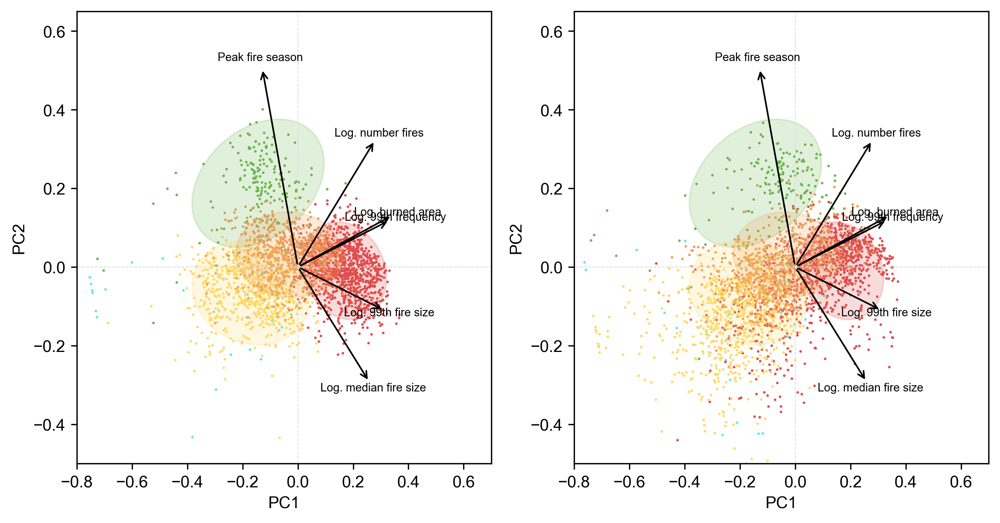

In [185]:
fig, axx = plt.subplots(1, 2, figsize = (10, 5))

axes = axx[0]
sns.scatterplot(data = data['p1'], 
                x = 'PC1', y = 'PC2', 
                hue = 'clust_alpha_{}'.format(kp1_1), 
                palette = pal_p14['p{}'.format(1)], 
                ax = axes,
               s = 2.5, edgecolor = 'none', legend = None)

pca_lim = [((-0.8, 0.7), (-0.5, 0.65)), ((-0.6, 0.65), (-0.6, 0.55))]

 # Setting the limits of the axis manually
axes.set_xlim((-0.8, 0.7))
axes.set_ylim((-0.5, 0.65))

# Adding vertical and horizontal lines
axes.axvline(0, -1, 1, linestyle = '--', linewidth = 0.5, color = 'gainsboro')
axes.axhline(0, -1, 1, linestyle = '--', linewidth = 0.5, color = 'gainsboro')

# Adding the arrows
comp = pca_comp['p{}'.format(1)].copy()

for c in range(len(comp)):
    sc = 16
    # axes[i][1].arrow(0, 0, comp.loc[c,'PC1']/sc, comp.loc[c, 'PC2']/sc, color = 'r', width = 0.0001)
    axes.annotate('', xy = (0, 0),# xycoords = 'data',
              xytext = (comp.loc[c,'PC1']/sc, comp.loc[c, 'PC2']/sc),# textcoords = 'data',
              arrowprops = {'arrowstyle':'<-','edgecolor' : 'black', 'facecolor': 'black'})

    axes.text(comp.loc[c,'PC1']*1.05/sc, comp.loc[c, 'PC2']*1.05/sc, comp.loc[c, 'id_label'], fontsize = 7, color = 'black', ha = 'center', va = 'center')
    
# Create a confidence ellipse per cluster in the first period
subset_data = data['p1']
for cluster, cluster_data in subset_data.groupby(by = 'clust_alpha_{}'.format(kp1_1)):
    
    if cluster != 'DP1':
    
        # Getting values to build the ellipse
        cov = np.cov(cluster_data['PC1'], cluster_data['PC2'])
        vals, vecs = eigsorted(cov)
        theta = np.degrees(np.arctan2(*vecs[:,0][::-1]))
        w, h = 1.96 * 2 * np.sqrt(vals)   # 1.14 corresponds to 75%, 1.96 corresponds to two standard deviaations, around 95%

        # Create the ellipse
        ell = Ellipse(xy = (np.mean(cluster_data['PC1']), np.mean(cluster_data['PC2'])),
                      width = w, height = h,
                      angle = theta, color = pal_p14['p{}'.format(1)][cluster], alpha = 0.2)
        ell.set_facecolor(pal_p14['p{}'.format(1)][cluster])
        axes.add_artist(ell)
    

axes = axx[1]
sns.scatterplot(data = pcaproj_p4, 
                x = 'PC1', y = 'PC2', 
                hue = 'clust_alpha_{}'.format(kp1_1), 
                palette = pal_p14['p{}'.format(1)], 
                ax = axes,
               s = 2.5, edgecolor = 'none', legend = None)

pca_lim = [((-0.8, 0.7), (-0.5, 0.65)), ((-0.6, 0.65), (-0.6, 0.55))]

 # Setting the limits of the axis manually
axes.set_xlim((-0.8, 0.7))
axes.set_ylim((-0.5, 0.65))

# Adding vertical and horizontal lines
axes.axvline(0, -1, 1, linestyle = '--', linewidth = 0.5, color = 'gainsboro')
axes.axhline(0, -1, 1, linestyle = '--', linewidth = 0.5, color = 'gainsboro')

# Adding the arrows
comp = pca_comp['p{}'.format(1)].copy()

for c in range(len(comp)):
    sc = 16
    # axes[i][1].arrow(0, 0, comp.loc[c,'PC1']/sc, comp.loc[c, 'PC2']/sc, color = 'r', width = 0.0001)
    axes.annotate('', xy = (0, 0),# xycoords = 'data',
              xytext = (comp.loc[c,'PC1']/sc, comp.loc[c, 'PC2']/sc),# textcoords = 'data',
              arrowprops = {'arrowstyle':'<-','edgecolor' : 'black', 'facecolor': 'black'})

    axes.text(comp.loc[c,'PC1']*1.05/sc, comp.loc[c, 'PC2']*1.05/sc, comp.loc[c, 'id_label'], fontsize = 7, color = 'black', ha = 'center', va = 'center')

# Create a confidence ellipse per cluster in the first period
subset_data = data['p1']
for cluster, cluster_data in subset_data.groupby(by = 'clust_alpha_{}'.format(kp1_1)):
    
    if cluster != 'DP1':
    
        # Getting values to build the ellipse
        cov = np.cov(cluster_data['PC1'], cluster_data['PC2'])
        vals, vecs = eigsorted(cov)
        theta = np.degrees(np.arctan2(*vecs[:,0][::-1]))
        w, h = 1.96 * 2 * np.sqrt(vals)

        # Create the ellipse
        ell = Ellipse(xy = (np.mean(cluster_data['PC1']), np.mean(cluster_data['PC2'])),
                      width = w, height = h,
                      angle = theta, color = pal_p14['p{}'.format(1)][cluster], alpha = 0.2)
        ell.set_facecolor(pal_p14['p{}'.format(1)][cluster])
        axes.add_artist(ell)

### Random Forest -- Predicted classification for period 4 using period 1 explanatory varaibles

Uisng variables: anthropic area, population density, livestock desnsity, prec in dry season, temp in dry season, prec, peak dry season, VPD, delta anthropic area

In [43]:
# Read data
randF_class = pd.read_csv('../../analysis_new_grids/9_year_periods/fireSize_intersecting/randomForest_classPred_forPeriod4.csv')

# Merge grid info
randF_class = grid.merge(randF_class, on = 'id', how = 'inner')

# Generating column with alphanumeric codes
randF_class['clust_alpha_5'] = [alpha_id['p1'][v] for v in randF_class['clust_5']]
randF_class['clust_alpha_pred4_5'] = [alpha_id['p1'][v] for v in randF_class['clust_pred4_5']]
randF_class['clust_alpha_3'] = [alpha_id['p4'][v] for v in randF_class['clust_3']]

# Adding colour-code information as column
randF_class['colors_5'] = [pal_p14['p1'][v] for v in randF_class['clust_alpha_5']]
randF_class['colors_pred4_5'] = [pal_p14['p1'][v] for v in randF_class['clust_alpha_pred4_5']]
randF_class['colors_3'] = [pal_p14['p4'][v] for v in randF_class['clust_alpha_3']]

randF_class.head()

,id,geometry,clust_5,clust_3,clust_pred4_5,clust_alpha_5,clust_alpha_pred4_5,clust_alpha_3,colors_5,colors_pred4_5,colors_3
0,307.0,"POLYGON ((4288491.269 8664278.452, 4318491.269...",1,1,4,DP1,EP1,CP4,#67e4ef,#ee9e58,#e7b242
1,308.0,"POLYGON ((4288491.269 8634278.452, 4318491.269...",2,1,4,BP1,EP1,CP4,#e04d4d,#ee9e58,#e7b242
2,309.0,"POLYGON ((4288491.269 8604278.452, 4318491.269...",2,1,4,BP1,EP1,CP4,#e04d4d,#ee9e58,#e7b242
3,395.0,"POLYGON ((4318491.269 8694278.451, 4348491.269...",1,1,4,DP1,EP1,CP4,#67e4ef,#ee9e58,#e7b242
4,396.0,"POLYGON ((4318491.269 8664278.452, 4348491.269...",1,1,5,DP1,AP1,CP4,#67e4ef,#6db54f,#e7b242


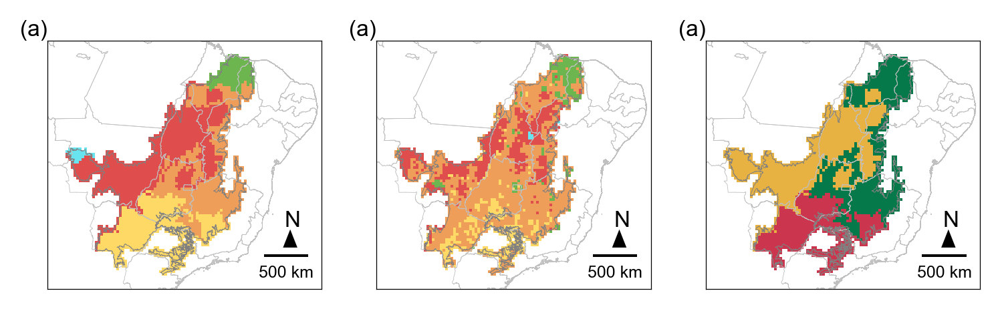

In [44]:
fig, axes = plt.subplots(1, 3, figsize = (6., 5.5))

fig_label = ['(a)', '(c)', '(b)']

# Plot for each solution (number of clusters)
i = 0
for column, axx in zip(['colors_5', 'colors_pred4_5', 'colors_3'], axes.flatten()):
    
    # ----------------------------------------------------------------------------------------------------------------------
    # Map on top
    randF_class.plot(color = randF_class[column], ax = axx, legend = True)
    
    br_states = gpd.read_file('../../data/shapes/brazilian_states/gadm36_BRA_1.shp')
    br_states = br_states.to_crs(randF_class.crs)
    br_states.boundary.plot(ax = axx, linewidth=0.2, edgecolor = 'silver')
    

    cerrado = gpd.read_file('../../data/shapes/cerrado_1-250000.shp')
    cerrado = cerrado.to_crs(randF_class.crs)
    cerrado.boundary.plot(ax = axx, linewidth=0.2, edgecolor = 'grey')
    
    minx, miny, maxx, maxy = randF_class.total_bounds
    axx.set_xlim(minx-200000, maxx+750000)
    axx.set_ylim(miny-150000, maxy+150000)
    
    
    # Adding figure label
    axx.text(x=-0.1, y=1.02, s=fig_label[i], transform=axx.transAxes, fontsize=8)
    
    axx.tick_params(axis='both', 
                            which='both',
                            bottom=False,
                            left = False,
                            labelbottom=False, labelleft = False)
    
    # Change width of all spines of axis
    for axis in ['top','bottom','left','right']:
        axx.spines[axis].set_linewidth(0.3)
        
#     # Adding label with the period
#     axes[i][0].text(0.375, 0.95, p_label, transform = axes[i][0].transAxes, fontsize=8, bbox = {'edgecolor': 'white', 'facecolor':'white', 'linewidth':0.2}, va = 'top', ha = 'right') # , backgroundcolor='white'
    
    # Including an arrow
    axx.text(x=0.865, y=0.25, s='N', transform=axx.transAxes, fontsize=8)
    # 0.055 for the 4-grid, 0.05 for the 3-grid
    axx.arrow(0.885, 0.175, 0.0, 0.05, length_includes_head=True, transform=axx.transAxes,
              width = 0, head_width=0.05, head_length=0.07, overhang=0.2, facecolor='k')
    
    # Taken from the GeoPandas documentation: https://geopandas.org/en/stable/gallery/matplotlib_scalebar.html 
    points = gpd.GeoSeries([Point(-45, -10.0), Point(-46, -10.0)], crs=4326)  # Geographic WGS 84 - degrees
    points = points.to_crs('epsg:5880') # Projected WGS 84 - meters
    distance_meters = points[0].distance(points[1])

    axx.add_artist(ScaleBar(dx = 1, units = 'm', dimension = 'si-length',  location='lower right', font_properties={'size': 6}, sep = 3))
    
    
    
    
# # Create legend manually
# patches_p1 = [Patch(color = c, label = l) for c, l in zip(pal_p14['p1'].values(), pal_p14['p1'].keys())]
# patches_p4 = [Patch(color = c, label = l) for c, l in zip(pal_p14['p4'].values(), pal_p14['p4'].keys())]

# legend_contents = [Patch(visible = False, label = 'Period 1985-1993:')] + patches_p1 + [Patch(visible = False, label = ''), Patch(visible = False, label = 'Period 2012-2020:')] + patches_p4

# legend_p1 = plt.legend(handles = patches_p1, title ='Period 1985-1993:', loc = (1.05, 1.45), fontsize = 7, title_fontsize = 7, frameon = False)
# plt.legend(handles = patches_p4, title ='Period 2012-2020:', loc = (1.05, .4), fontsize = 7, title_fontsize = 7, frameon = False)
# plt.gca().add_artist(legend_p1)

# plt.savefig('../plots/map_PCA_periods1_4.png', dpi=600, facecolor='white', transparent=False, bbox_inches="tight")
# plt.savefig('../plots/map_PCA_periods1_4.pdf', dpi=600, facecolor='white', transparent=False, bbox_inches="tight")
# plt.show()